<a href="https://colab.research.google.com/github/BrainConnection/Quantum_Algorithm/blob/main/4.%205Q%20TFIM%20VQNHE%20CNN%20QEM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Environment Setting

In [1]:
!pip install qiskit
!pip install qiskit-ibm-runtime
!pip install qiskit[visualization]
!pip install qiskit-algorithms
!pip install qiskit-aer

!pip install scipy
!pip install matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 15.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 29.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.7/49.7 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.4/39.4 MB 42.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.5/107.5 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 28.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.0/318.0 kB 23.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 8.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   

In [2]:
from functools import cache

from qiskit_ibm_runtime import QiskitRuntimeService, Estimator, Options

# Save an IBM Quantum account and set it as your default account.
QiskitRuntimeService.save_account(channel="ibm_quantum",
                                  token="067e5c82606f0a1157dd554e2087d6b7a9b823dbaa4ad47b95c3337eab2e6cd9361719cc0470f4a98d1631b73b264a82577012a0b8ff32963d5964e6cc12c525",
                                  set_as_default=True,
                                  overwrite=True)

service = QiskitRuntimeService()
backend = service.backend("ibmq_qasm_simulator")

# Hamiltonian Diagonalization

$$ H = Σ Z_j Z_{j+1} - Σ X_j  $$

1D 5 Qubit System

In [3]:
from qiskit.quantum_info import SparsePauliOp
import numpy as np
import matplotlib.pyplot as plt

In [4]:
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)
hamiltonian_matrix = hamiltonian.to_matrix()

eigenvalue, eigenvector = np.linalg.eig(hamiltonian_matrix)

lowest_energy = np.min(eigenvalue)

np.real(lowest_energy)

-6.026674183332294

# 5. CNN Estimation - Depolarizing Channel

## Depolarization Channel, Error 0.001~0.1, Shots = 10000, Hidden Layer 0개

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
    QuantumError,
    ReadoutError,
    depolarizing_error,
    pauli_error,
    thermal_relaxation_error,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

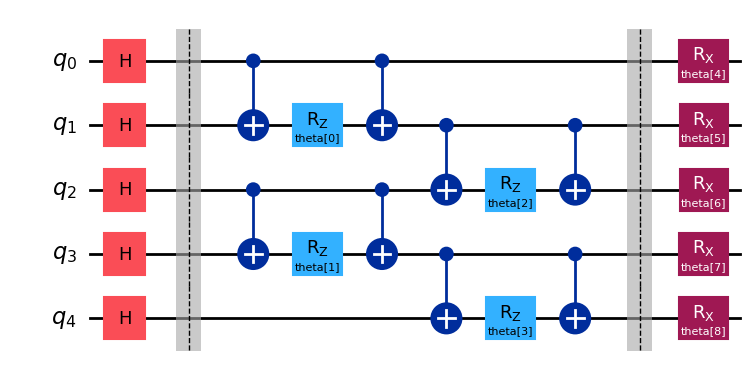

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)
ansatz.h(range(0,5))

ansatz.barrier()

ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.cx(1, 2)
ansatz.cx(3, 4)

ansatz.barrier()

ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)

ansatz.draw("mpl")

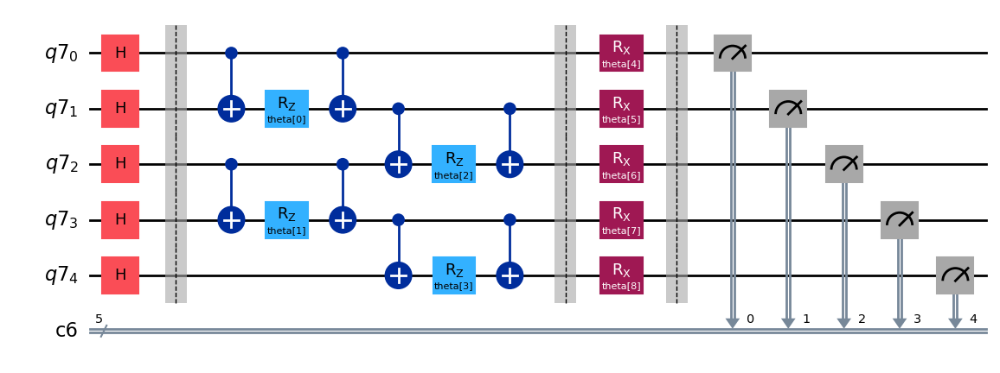

In [ ]:
# Ansatz for VQNHE ZZ Measurement

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatz_zz = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_zz.h(range(0,5))

ansatz_zz.barrier()

ansatz_zz.cx(0, 1)
ansatz_zz.cx(2, 3)
ansatz_zz.rz(next(it), 1)
ansatz_zz.rz(next(it), 3)
ansatz_zz.cx(0, 1)
ansatz_zz.cx(2, 3)
ansatz_zz.cx(1, 2)
ansatz_zz.cx(3, 4)
ansatz_zz.rz(next(it), 2)
ansatz_zz.rz(next(it), 4)
ansatz_zz.cx(1, 2)
ansatz_zz.cx(3, 4)

ansatz_zz.barrier()

ansatz_zz.rx(next(it), 0)
ansatz_zz.rx(next(it), 1)
ansatz_zz.rx(next(it), 2)
ansatz_zz.rx(next(it), 3)
ansatz_zz.rx(next(it), 4)

ansatz_zz.barrier()

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

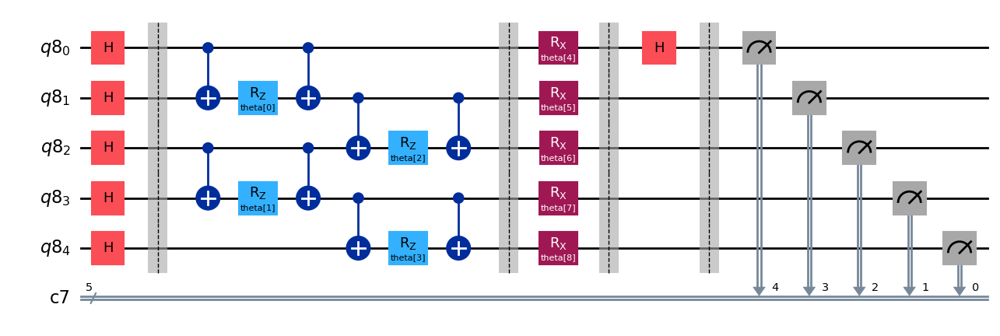

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = QuantumCircuit(qbit0, cbit0)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x0.h(range(0,5))

ansatz_x0.barrier()

ansatz_x0.cx(0, 1)
ansatz_x0.cx(2, 3)
ansatz_x0.rz(next(it), 1)
ansatz_x0.rz(next(it), 3)
ansatz_x0.cx(0, 1)
ansatz_x0.cx(2, 3)
ansatz_x0.cx(1, 2)
ansatz_x0.cx(3, 4)
ansatz_x0.rz(next(it), 2)
ansatz_x0.rz(next(it), 4)
ansatz_x0.cx(1, 2)
ansatz_x0.cx(3, 4)

ansatz_x0.barrier()

ansatz_x0.rx(next(it), 0)
ansatz_x0.rx(next(it), 1)
ansatz_x0.rx(next(it), 2)
ansatz_x0.rx(next(it), 3)
ansatz_x0.rx(next(it), 4)

ansatz_x0.barrier()

ansatz_x0.h(0)

ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

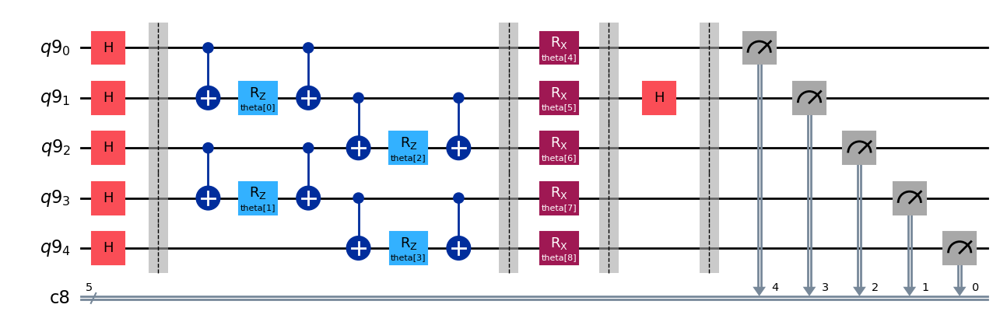

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = QuantumCircuit(qbit1, cbit1)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x1.h(range(0,5))

ansatz_x1.barrier()

ansatz_x1.cx(0, 1)
ansatz_x1.cx(2, 3)
ansatz_x1.rz(next(it), 1)
ansatz_x1.rz(next(it), 3)
ansatz_x1.cx(0, 1)
ansatz_x1.cx(2, 3)
ansatz_x1.cx(1, 2)
ansatz_x1.cx(3, 4)
ansatz_x1.rz(next(it), 2)
ansatz_x1.rz(next(it), 4)
ansatz_x1.cx(1, 2)
ansatz_x1.cx(3, 4)

ansatz_x1.barrier()

ansatz_x1.rx(next(it), 0)
ansatz_x1.rx(next(it), 1)
ansatz_x1.rx(next(it), 2)
ansatz_x1.rx(next(it), 3)
ansatz_x1.rx(next(it), 4)

ansatz_x1.barrier()

ansatz_x1.h(1)

ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

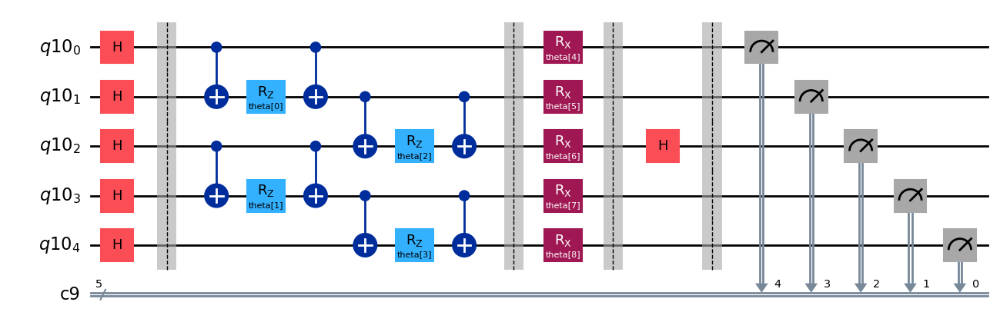

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = QuantumCircuit(qbit2, cbit2)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x2.h(range(0,5))

ansatz_x2.barrier()

ansatz_x2.cx(0, 1)
ansatz_x2.cx(2, 3)
ansatz_x2.rz(next(it), 1)
ansatz_x2.rz(next(it), 3)
ansatz_x2.cx(0, 1)
ansatz_x2.cx(2, 3)
ansatz_x2.cx(1, 2)
ansatz_x2.cx(3, 4)
ansatz_x2.rz(next(it), 2)
ansatz_x2.rz(next(it), 4)
ansatz_x2.cx(1, 2)
ansatz_x2.cx(3, 4)

ansatz_x2.barrier()

ansatz_x2.rx(next(it), 0)
ansatz_x2.rx(next(it), 1)
ansatz_x2.rx(next(it), 2)
ansatz_x2.rx(next(it), 3)
ansatz_x2.rx(next(it), 4)

ansatz_x2.barrier()

ansatz_x2.h(2)

ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

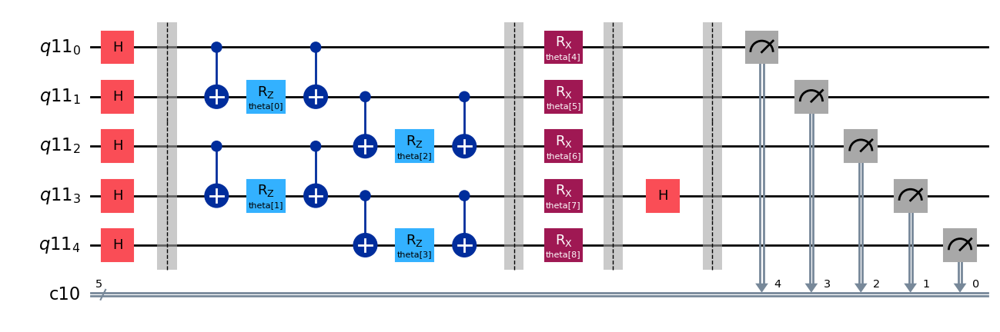

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = QuantumCircuit(qbit3, cbit3)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x3.h(range(0,5))

ansatz_x3.barrier()

ansatz_x3.cx(0, 1)
ansatz_x3.cx(2, 3)
ansatz_x3.rz(next(it), 1)
ansatz_x3.rz(next(it), 3)
ansatz_x3.cx(0, 1)
ansatz_x3.cx(2, 3)
ansatz_x3.cx(1, 2)
ansatz_x3.cx(3, 4)
ansatz_x3.rz(next(it), 2)
ansatz_x3.rz(next(it), 4)
ansatz_x3.cx(1, 2)
ansatz_x3.cx(3, 4)

ansatz_x3.barrier()

ansatz_x3.rx(next(it), 0)
ansatz_x3.rx(next(it), 1)
ansatz_x3.rx(next(it), 2)
ansatz_x3.rx(next(it), 3)
ansatz_x3.rx(next(it), 4)

ansatz_x3.barrier()

ansatz_x3.h(3)

ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

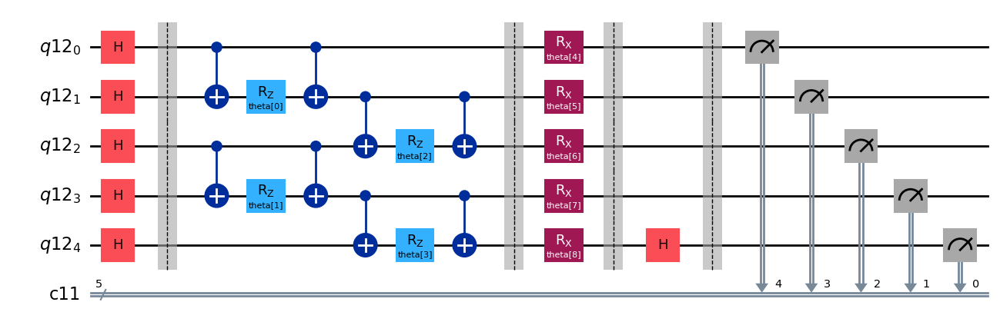

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = QuantumCircuit(qbit4, cbit4)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x4.h(range(0,5))

ansatz_x4.barrier()

ansatz_x4.cx(0, 1)
ansatz_x4.cx(2, 3)
ansatz_x4.rz(next(it), 1)
ansatz_x4.rz(next(it), 3)
ansatz_x4.cx(0, 1)
ansatz_x4.cx(2, 3)
ansatz_x4.cx(1, 2)
ansatz_x4.cx(3, 4)
ansatz_x4.rz(next(it), 2)
ansatz_x4.rz(next(it), 4)
ansatz_x4.cx(1, 2)
ansatz_x4.cx(3, 4)

ansatz_x4.barrier()

ansatz_x4.rx(next(it), 0)
ansatz_x4.rx(next(it), 1)
ansatz_x4.rx(next(it), 2)
ansatz_x4.rx(next(it), 3)
ansatz_x4.rx(next(it), 4)

ansatz_x4.barrier()

ansatz_x4.h(4)

ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE & VQNHE

In [ ]:
error_list = [0.001*i for i in range(10)]+[0.01*i for i in range(1,11,1)]

In [ ]:
error_list

[0.0,
 0.001,
 0.002,
 0.003,
 0.004,
 0.005,
 0.006,
 0.007,
 0.008,
 0.009000000000000001,
 0.01,
 0.02,
 0.03,
 0.04,
 0.05,
 0.06,
 0.07,
 0.08,
 0.09,
 0.1]

In [ ]:
lowest_energy_vqe_list = []

for num in range(20):

  noise_model = NoiseModel()
  depolar_prob = error_list[num]

  # QuantumError objects
  noise_model.add_all_qubit_quantum_error(depolarizing_error(depolar_prob, 1), ['u1', 'u2', 'u3'])
  noise_model.add_all_qubit_quantum_error(depolarizing_error(depolar_prob, 2), ["cx"])


  estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
  sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


  lowest_energy_vqe = 0
  lowest_energy_vqnhe = 0

  for k in range(num*100+40, num*100+50, 1):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

  print("error rate : {0}, lowest energy vqe : {1}".format(depolar_prob, lowest_energy_vqe))
  print()

  lowest_energy_vqe_list.append(lowest_energy_vqe)

error rate : 0.0, lowest energy vqe : -5.831799999999999

error rate : 0.001, lowest energy vqe : -5.8191999999999995

error rate : 0.002, lowest energy vqe : -5.775000000000001

error rate : 0.003, lowest energy vqe : -5.782000000000001

error rate : 0.004, lowest energy vqe : -5.7467999999999995

error rate : 0.005, lowest energy vqe : -5.742000000000001

error rate : 0.006, lowest energy vqe : -5.6944

error rate : 0.007, lowest energy vqe : -5.709399999999999

error rate : 0.008, lowest energy vqe : -5.684400000000002

error rate : 0.009000000000000001, lowest energy vqe : -5.6546

error rate : 0.01, lowest energy vqe : -5.6246

error rate : 0.02, lowest energy vqe : -5.4496

error rate : 0.03, lowest energy vqe : -5.256800000000002

error rate : 0.04, lowest energy vqe : -5.056400000000001

error rate : 0.05, lowest energy vqe : -4.8721999999999985

error rate : 0.06, lowest energy vqe : -4.706800000000002

error rate : 0.07, lowest energy vqe : -4.576600000000001

error rate : 0.

In [ ]:
lowest_energy_vqe_list

[-5.831799999999999,
 -5.8191999999999995,
 -5.775000000000001,
 -5.782000000000001,
 -5.7467999999999995,
 -5.742000000000001,
 -5.6944,
 -5.709399999999999,
 -5.684400000000002,
 -5.6546,
 -5.6246,
 -5.4496,
 -5.256800000000002,
 -5.056400000000001,
 -4.8721999999999985,
 -4.706800000000002,
 -4.576600000000001,
 -4.430999999999998,
 -4.254599999999999,
 -4.114799999999999]

In [ ]:
lowest_energy_vqnhe_list = []

for num in range(20):

  noise_model = NoiseModel()
  depolar_prob = error_list[num]

  # QuantumError objects
  noise_model.add_all_qubit_quantum_error(depolarizing_error(depolar_prob, 1), ['u1', 'u2', 'u3'])
  noise_model.add_all_qubit_quantum_error(depolarizing_error(depolar_prob, 2), ["cx"])


  estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
  sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


  lowest_energy_vqe = 0
  lowest_energy_vqnhe = 0

  for k in range(num*100+40, num*100+50, 1):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

  print("error rate : {0}, lowest energy vqe : {1}".format(depolar_prob, lowest_energy_vqe))
  print()


  for k in range(num*100, num*100+10, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

  print("error rate : {0}, lowest energy vqnhe : {1}".format(depolar_prob, lowest_energy_vqnhe))
  print()
  print()
  print()

  lowest_energy_vqnhe_list.append(lowest_energy_vqnhe)

error rate : 0.0, lowest energy vqe : -5.831799999999999

Optimization terminated successfully.
         Current function value: -5.919692
         Iterations: 66
         Function evaluations: 539
         Gradient evaluations: 77
Optimization terminated successfully.
         Current function value: -5.898826
         Iterations: 53
         Function evaluations: 406
         Gradient evaluations: 58
Optimization terminated successfully.
         Current function value: -5.919691
         Iterations: 55
         Function evaluations: 413
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: -5.873491
         Iterations: 43
         Function evaluations: 574
         Gradient evaluations: 82
Optimization terminated successfully.
         Current function value: -5.898767
         Iterations: 42
         Function evaluations: 329
         Gradient evaluations: 47
Optimization terminated successfully.
         Current function value: -

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.860513
         Iterations: 45
         Function evaluations: 427
         Gradient evaluations: 61
Optimization terminated successfully.
         Current function value: -5.798343
         Iterations: 53
         Function evaluations: 588
         Gradient evaluations: 84
Optimization terminated successfully.
         Current function value: -5.860512
         Iterations: 44
         Function evaluations: 322
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: -5.806718
         Iterations: 57
         Function evaluations: 462
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: -5.814993
         Iterations: 76
         Function evaluations: 658
         Gradient evaluations: 94
Optimization terminated successfully.
         Current function value: -5.860513
         Iterations: 58
         Function evaluations: 455
         Gradient evaluation

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.772274
         Iterations: 49
         Function evaluations: 483
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: -5.820421
         Iterations: 56
         Function evaluations: 441
         Gradient evaluations: 63
Optimization terminated successfully.
         Current function value: -5.817207
         Iterations: 51
         Function evaluations: 399
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: -5.827856
         Iterations: 61
         Function evaluations: 511
         Gradient evaluations: 73
error rate : 0.004, lowest energy vqnhe : -5.827856166661195



error rate : 0.005, lowest energy vqe : -5.742000000000001

Optimization terminated successfully.
         Current function value: -5.789710
         Iterations: 58
         Function evaluations: 602
         Gradient evaluations: 86
Optimization terminated successfully.
      

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.793299
         Iterations: 56
         Function evaluations: 677
         Gradient evaluations: 95
Optimization terminated successfully.
         Current function value: -5.786723
         Iterations: 66
         Function evaluations: 532
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: -5.869353
         Iterations: 62
         Function evaluations: 560
         Gradient evaluations: 80
Optimization terminated successfully.
         Current function value: -5.794190
         Iterations: 47
         Function evaluations: 371
         Gradient evaluations: 53


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.869353
         Iterations: 48
         Function evaluations: 656
         Gradient evaluations: 92
Optimization terminated successfully.
         Current function value: -5.790517
         Iterations: 35
         Function evaluations: 294
         Gradient evaluations: 42


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.805146
         Iterations: 48
         Function evaluations: 448
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: -5.805146
         Iterations: 46
         Function evaluations: 371
         Gradient evaluations: 53
error rate : 0.005, lowest energy vqnhe : -5.8693531158632455



error rate : 0.006, lowest energy vqe : -5.6944



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.721471
         Iterations: 54
         Function evaluations: 476
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: -5.761155
         Iterations: 99
         Function evaluations: 833
         Gradient evaluations: 119
Optimization terminated successfully.
         Current function value: -5.803894
         Iterations: 51
         Function evaluations: 371
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: -5.803894
         Iterations: 39
         Function evaluations: 301
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: -5.731167
         Iterations: 51
         Function evaluations: 413
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: -5.803894
         Iterations: 48
         Function evaluations: 392
         Gradient evaluatio

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.755751
         Iterations: 68
         Function evaluations: 588
         Gradient evaluations: 84
Optimization terminated successfully.
         Current function value: -5.791311
         Iterations: 47
         Function evaluations: 350
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: -5.816255
         Iterations: 47
         Function evaluations: 350
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: -5.749527
         Iterations: 36
         Function evaluations: 294
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: -5.791311
         Iterations: 50
         Function evaluations: 413
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: -5.753165
         Iterations: 54
         Function evaluations: 420
         Gradient evaluation

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.691668
         Iterations: 49
         Function evaluations: 504
         Gradient evaluations: 72
Optimization terminated successfully.
         Current function value: -5.755068
         Iterations: 39
         Function evaluations: 371
         Gradient evaluations: 53
Optimization terminated successfully.
         Current function value: -5.755068
         Iterations: 40
         Function evaluations: 315
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: -5.734160
         Iterations: 44
         Function evaluations: 357
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: -5.755068
         Iterations: 48
         Function evaluations: 483
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: -5.755068
         Iterations: 44
         Function evaluations: 357
         Gradient evaluation

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.468837
         Iterations: 52
         Function evaluations: 719
         Gradient evaluations: 101
Optimization terminated successfully.
         Current function value: -5.497512
         Iterations: 89
         Function evaluations: 756
         Gradient evaluations: 108
Optimization terminated successfully.
         Current function value: -5.495975
         Iterations: 51
         Function evaluations: 392
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: -5.568578
         Iterations: 48
         Function evaluations: 378
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: -5.567221
         Iterations: 52
         Function evaluations: 420
         Gradient evaluations: 60
error rate : 0.02, lowest energy vqnhe : -5.568578059117119



error rate : 0.03, lowest energy vqe : -5.256800000000002

Optimization terminated successfully.
      

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.411915
         Iterations: 188
         Function evaluations: 1792
         Gradient evaluations: 256
Optimization terminated successfully.
         Current function value: -5.405870
         Iterations: 58
         Function evaluations: 546
         Gradient evaluations: 78
Optimization terminated successfully.
         Current function value: -5.388054
         Iterations: 30
         Function evaluations: 301
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: -5.388054
         Iterations: 32
         Function evaluations: 259
         Gradient evaluations: 37
error rate : 0.03, lowest energy vqnhe : -5.411916222038937



error rate : 0.04, lowest energy vqe : -5.056400000000001



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.258392
         Iterations: 173
         Function evaluations: 1972
         Gradient evaluations: 280


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.284469
         Iterations: 194
         Function evaluations: 1897
         Gradient evaluations: 271
Optimization terminated successfully.
         Current function value: -5.247274
         Iterations: 31
         Function evaluations: 294
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: -5.088006
         Iterations: 33
         Function evaluations: 238
         Gradient evaluations: 34


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.258391
         Iterations: 166
         Function evaluations: 1694
         Gradient evaluations: 242


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.284469
         Iterations: 167
         Function evaluations: 1757
         Gradient evaluations: 251
Optimization terminated successfully.
         Current function value: -5.110803
         Iterations: 53
         Function evaluations: 462
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: -5.183392
         Iterations: 53
         Function evaluations: 413
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: -5.112370
         Iterations: 61
         Function evaluations: 581
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: -5.247274
         Iterations: 30
         Function evaluations: 238
         Gradient evaluations: 34
error rate : 0.04, lowest energy vqnhe : -5.284468919589966



error rate : 0.05, lowest energy vqe : -4.8721999999999985

Optimization terminated successfully.
    

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.265287
         Iterations: 200
         Function evaluations: 1988
         Gradient evaluations: 284
Optimization terminated successfully.
         Current function value: -4.925063
         Iterations: 42
         Function evaluations: 343
         Gradient evaluations: 49


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.265286
         Iterations: 179
         Function evaluations: 1818
         Gradient evaluations: 258
Optimization terminated successfully.
         Current function value: -5.265287
         Iterations: 220
         Function evaluations: 2240
         Gradient evaluations: 320
Optimization terminated successfully.
         Current function value: -4.965638
         Iterations: 49
         Function evaluations: 371
         Gradient evaluations: 53


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.246989
         Iterations: 207
         Function evaluations: 2238
         Gradient evaluations: 318
Optimization terminated successfully.
         Current function value: -5.246989
         Iterations: 193
         Function evaluations: 1855
         Gradient evaluations: 265
Optimization terminated successfully.
         Current function value: -4.933620
         Iterations: 46
         Function evaluations: 406
         Gradient evaluations: 58


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.246987
         Iterations: 195
         Function evaluations: 1820
         Gradient evaluations: 260
error rate : 0.05, lowest energy vqnhe : -5.265287221604532



error rate : 0.06, lowest energy vqe : -4.706800000000002



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.129174
         Iterations: 191
         Function evaluations: 1951
         Gradient evaluations: 277


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.116340
         Iterations: 175
         Function evaluations: 1827
         Gradient evaluations: 261
Optimization terminated successfully.
         Current function value: -4.780580
         Iterations: 43
         Function evaluations: 315
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: -5.129173
         Iterations: 207
         Function evaluations: 2107
         Gradient evaluations: 301
Optimization terminated successfully.
         Current function value: -5.116340
         Iterations: 193
         Function evaluations: 1918
         Gradient evaluations: 274
Optimization terminated successfully.
         Current function value: -5.116341
         Iterations: 217
         Function evaluations: 2051
         Gradient evaluations: 293
Optimization terminated successfully.
         Current function value: -5.116342
         Iterations: 228
         Function evaluations: 2268
         Gradi

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.116342
         Iterations: 222
         Function evaluations: 2100
         Gradient evaluations: 300


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.129172
         Iterations: 175
         Function evaluations: 1666
         Gradient evaluations: 238
error rate : 0.06, lowest energy vqnhe : -5.129173554445168



error rate : 0.07, lowest energy vqe : -4.576600000000001



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.059500
         Iterations: 246
         Function evaluations: 2380
         Gradient evaluations: 340


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.077622
         Iterations: 214
         Function evaluations: 2009
         Gradient evaluations: 287


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.077624
         Iterations: 253
         Function evaluations: 2843
         Gradient evaluations: 403


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.059500
         Iterations: 228
         Function evaluations: 2301
         Gradient evaluations: 327
Optimization terminated successfully.
         Current function value: -5.077622
         Iterations: 175
         Function evaluations: 1652
         Gradient evaluations: 236
Optimization terminated successfully.
         Current function value: -5.059498
         Iterations: 195
         Function evaluations: 1918
         Gradient evaluations: 274


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.077624
         Iterations: 223
         Function evaluations: 2296
         Gradient evaluations: 328
Optimization terminated successfully.
         Current function value: -5.059499
         Iterations: 186
         Function evaluations: 1813
         Gradient evaluations: 259
Optimization terminated successfully.
         Current function value: -4.681916
         Iterations: 52
         Function evaluations: 385
         Gradient evaluations: 55


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.077624
         Iterations: 234
         Function evaluations: 2338
         Gradient evaluations: 334
error rate : 0.07, lowest energy vqnhe : -5.077624272045166



error rate : 0.08, lowest energy vqe : -4.430999999999998



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.073424
         Iterations: 243
         Function evaluations: 2443
         Gradient evaluations: 349


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.073422
         Iterations: 171
         Function evaluations: 1575
         Gradient evaluations: 225
Optimization terminated successfully.
         Current function value: -4.567780
         Iterations: 53
         Function evaluations: 413
         Gradient evaluations: 59


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.007553
         Iterations: 170
         Function evaluations: 1519
         Gradient evaluations: 217
Optimization terminated successfully.
         Current function value: -4.494543
         Iterations: 63
         Function evaluations: 679
         Gradient evaluations: 97
Optimization terminated successfully.
         Current function value: -4.567780
         Iterations: 104
         Function evaluations: 791
         Gradient evaluations: 113
Optimization terminated successfully.
         Current function value: -4.567780
         Iterations: 101
         Function evaluations: 917
         Gradient evaluations: 131
Optimization terminated successfully.
         Current function value: -5.007555
         Iterations: 192
         Function evaluations: 1862
         Gradient evaluations: 266


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.007554
         Iterations: 196
         Function evaluations: 2044
         Gradient evaluations: 292


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.073423
         Iterations: 204
         Function evaluations: 1953
         Gradient evaluations: 279
error rate : 0.08, lowest energy vqnhe : -5.073424152028077



error rate : 0.09, lowest energy vqe : -4.254599999999999



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.928244
         Iterations: 246
         Function evaluations: 2749
         Gradient evaluations: 391


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.928241
         Iterations: 196
         Function evaluations: 1981
         Gradient evaluations: 283
Optimization terminated successfully.
         Current function value: -4.928244
         Iterations: 241
         Function evaluations: 2373
         Gradient evaluations: 339
Optimization terminated successfully.
         Current function value: -4.390860
         Iterations: 72
         Function evaluations: 609
         Gradient evaluations: 87
Optimization terminated successfully.
         Current function value: -4.367651
         Iterations: 53
         Function evaluations: 448
         Gradient evaluations: 64


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.928243
         Iterations: 184
         Function evaluations: 1848
         Gradient evaluations: 264
Optimization terminated successfully.
         Current function value: -4.347525
         Iterations: 40
         Function evaluations: 287
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: -4.347525
         Iterations: 44
         Function evaluations: 336
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: -4.928243
         Iterations: 223
         Function evaluations: 2254
         Gradient evaluations: 322
         Current function value: -4.344322
         Iterations: 73
         Function evaluations: 756
         Gradient evaluations: 108
error rate : 0.09, lowest energy vqnhe : -4.928244187760365





/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe_list

[-5.919691524202059,
 -5.909266681731913,
 -5.871121846295345,
 -5.860512992519139,
 -5.827856166661195,
 -5.8693531158632455,
 -5.803894487338251,
 -5.816255217174009,
 -5.763852070123904,
 -5.7550676097308475,
 -5.720940795044208,
 -5.568578059117119,
 -5.411916222038937,
 -5.284468919589966,
 -5.265287221604532,
 -5.129173554445168,
 -5.077624272045166,
 -5.073424152028077,
 -4.928244187760365]

In [ ]:
lowest_energy_vqnhe_list

[-4.911047483324537]

## Depolarization Channel, Error 0.001~0.1, Shots = 10000, FC Hidden Layer 1개

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
    QuantumError,
    ReadoutError,
    depolarizing_error,
    pauli_error,
    thermal_relaxation_error,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

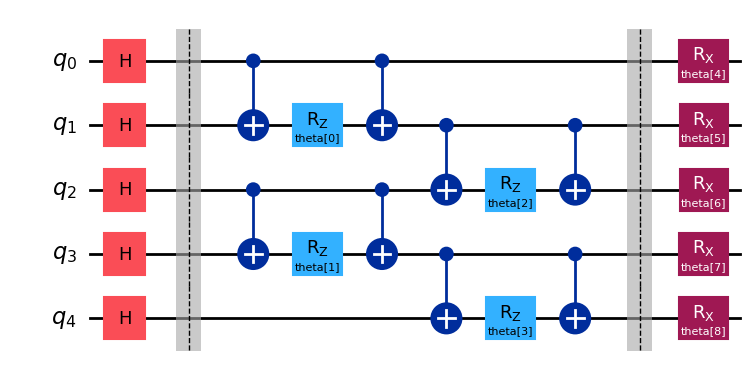

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)
ansatz.h(range(0,5))

ansatz.barrier()

ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.cx(1, 2)
ansatz.cx(3, 4)

ansatz.barrier()

ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)

ansatz.draw("mpl")

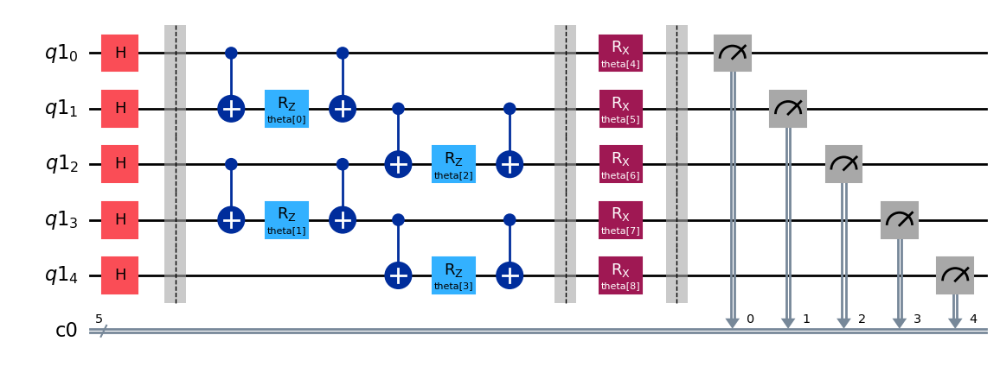

In [ ]:
# Ansatz for VQNHE ZZ Measurement

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatz_zz = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_zz.h(range(0,5))

ansatz_zz.barrier()

ansatz_zz.cx(0, 1)
ansatz_zz.cx(2, 3)
ansatz_zz.rz(next(it), 1)
ansatz_zz.rz(next(it), 3)
ansatz_zz.cx(0, 1)
ansatz_zz.cx(2, 3)
ansatz_zz.cx(1, 2)
ansatz_zz.cx(3, 4)
ansatz_zz.rz(next(it), 2)
ansatz_zz.rz(next(it), 4)
ansatz_zz.cx(1, 2)
ansatz_zz.cx(3, 4)

ansatz_zz.barrier()

ansatz_zz.rx(next(it), 0)
ansatz_zz.rx(next(it), 1)
ansatz_zz.rx(next(it), 2)
ansatz_zz.rx(next(it), 3)
ansatz_zz.rx(next(it), 4)

ansatz_zz.barrier()

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

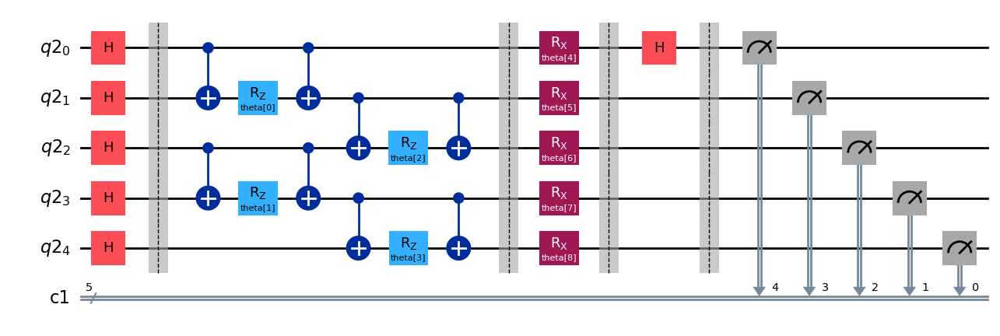

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = QuantumCircuit(qbit0, cbit0)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x0.h(range(0,5))

ansatz_x0.barrier()

ansatz_x0.cx(0, 1)
ansatz_x0.cx(2, 3)
ansatz_x0.rz(next(it), 1)
ansatz_x0.rz(next(it), 3)
ansatz_x0.cx(0, 1)
ansatz_x0.cx(2, 3)
ansatz_x0.cx(1, 2)
ansatz_x0.cx(3, 4)
ansatz_x0.rz(next(it), 2)
ansatz_x0.rz(next(it), 4)
ansatz_x0.cx(1, 2)
ansatz_x0.cx(3, 4)

ansatz_x0.barrier()

ansatz_x0.rx(next(it), 0)
ansatz_x0.rx(next(it), 1)
ansatz_x0.rx(next(it), 2)
ansatz_x0.rx(next(it), 3)
ansatz_x0.rx(next(it), 4)

ansatz_x0.barrier()

ansatz_x0.h(0)

ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

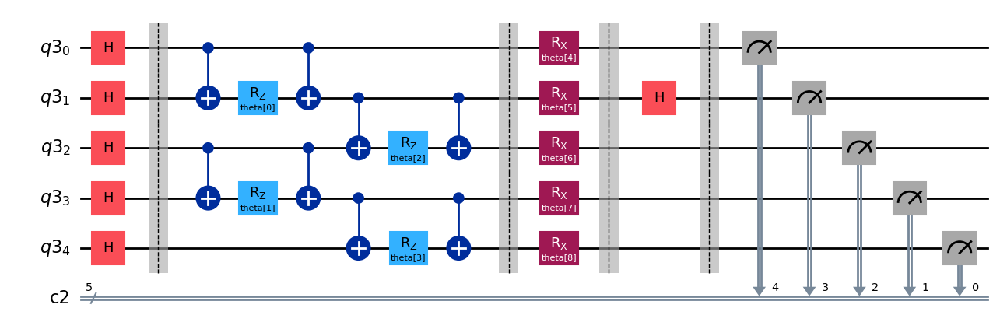

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = QuantumCircuit(qbit1, cbit1)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x1.h(range(0,5))

ansatz_x1.barrier()

ansatz_x1.cx(0, 1)
ansatz_x1.cx(2, 3)
ansatz_x1.rz(next(it), 1)
ansatz_x1.rz(next(it), 3)
ansatz_x1.cx(0, 1)
ansatz_x1.cx(2, 3)
ansatz_x1.cx(1, 2)
ansatz_x1.cx(3, 4)
ansatz_x1.rz(next(it), 2)
ansatz_x1.rz(next(it), 4)
ansatz_x1.cx(1, 2)
ansatz_x1.cx(3, 4)

ansatz_x1.barrier()

ansatz_x1.rx(next(it), 0)
ansatz_x1.rx(next(it), 1)
ansatz_x1.rx(next(it), 2)
ansatz_x1.rx(next(it), 3)
ansatz_x1.rx(next(it), 4)

ansatz_x1.barrier()

ansatz_x1.h(1)

ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

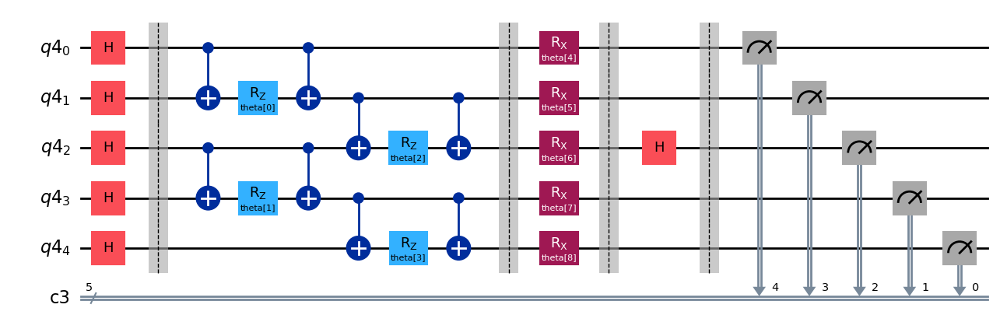

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = QuantumCircuit(qbit2, cbit2)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x2.h(range(0,5))

ansatz_x2.barrier()

ansatz_x2.cx(0, 1)
ansatz_x2.cx(2, 3)
ansatz_x2.rz(next(it), 1)
ansatz_x2.rz(next(it), 3)
ansatz_x2.cx(0, 1)
ansatz_x2.cx(2, 3)
ansatz_x2.cx(1, 2)
ansatz_x2.cx(3, 4)
ansatz_x2.rz(next(it), 2)
ansatz_x2.rz(next(it), 4)
ansatz_x2.cx(1, 2)
ansatz_x2.cx(3, 4)

ansatz_x2.barrier()

ansatz_x2.rx(next(it), 0)
ansatz_x2.rx(next(it), 1)
ansatz_x2.rx(next(it), 2)
ansatz_x2.rx(next(it), 3)
ansatz_x2.rx(next(it), 4)

ansatz_x2.barrier()

ansatz_x2.h(2)

ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

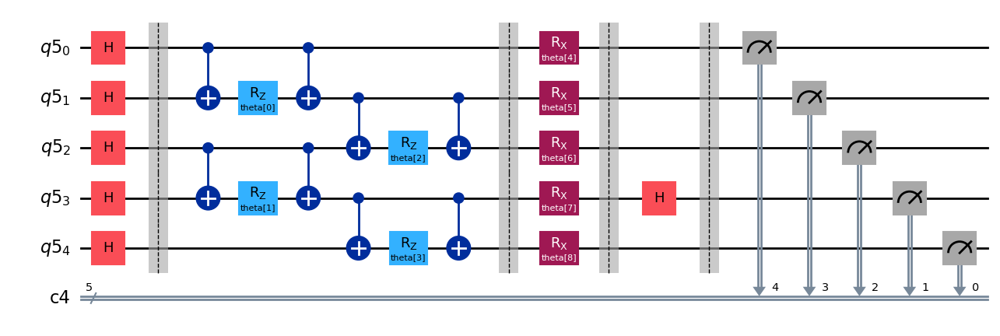

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = QuantumCircuit(qbit3, cbit3)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x3.h(range(0,5))

ansatz_x3.barrier()

ansatz_x3.cx(0, 1)
ansatz_x3.cx(2, 3)
ansatz_x3.rz(next(it), 1)
ansatz_x3.rz(next(it), 3)
ansatz_x3.cx(0, 1)
ansatz_x3.cx(2, 3)
ansatz_x3.cx(1, 2)
ansatz_x3.cx(3, 4)
ansatz_x3.rz(next(it), 2)
ansatz_x3.rz(next(it), 4)
ansatz_x3.cx(1, 2)
ansatz_x3.cx(3, 4)

ansatz_x3.barrier()

ansatz_x3.rx(next(it), 0)
ansatz_x3.rx(next(it), 1)
ansatz_x3.rx(next(it), 2)
ansatz_x3.rx(next(it), 3)
ansatz_x3.rx(next(it), 4)

ansatz_x3.barrier()

ansatz_x3.h(3)

ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

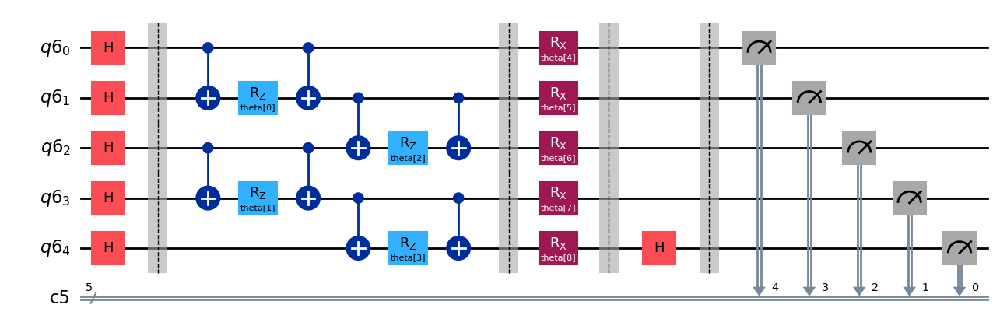

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = QuantumCircuit(qbit4, cbit4)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x4.h(range(0,5))

ansatz_x4.barrier()

ansatz_x4.cx(0, 1)
ansatz_x4.cx(2, 3)
ansatz_x4.rz(next(it), 1)
ansatz_x4.rz(next(it), 3)
ansatz_x4.cx(0, 1)
ansatz_x4.cx(2, 3)
ansatz_x4.cx(1, 2)
ansatz_x4.cx(3, 4)
ansatz_x4.rz(next(it), 2)
ansatz_x4.rz(next(it), 4)
ansatz_x4.cx(1, 2)
ansatz_x4.cx(3, 4)

ansatz_x4.barrier()

ansatz_x4.rx(next(it), 0)
ansatz_x4.rx(next(it), 1)
ansatz_x4.rx(next(it), 2)
ansatz_x4.rx(next(it), 3)
ansatz_x4.rx(next(it), 4)

ansatz_x4.barrier()

ansatz_x4.h(4)

ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE & VQNHE

In [ ]:
error_list = [0.001*i for i in range(10)]+[0.01*i for i in range(1,11,1)]

In [ ]:
error_list

[0.0,
 0.001,
 0.002,
 0.003,
 0.004,
 0.005,
 0.006,
 0.007,
 0.008,
 0.009000000000000001,
 0.01,
 0.02,
 0.03,
 0.04,
 0.05,
 0.06,
 0.07,
 0.08,
 0.09,
 0.1]

In [ ]:
lowest_energy_vqe_list = []

for num in range(20):

  noise_model = NoiseModel()
  depolar_prob = error_list[num]

  # QuantumError objects
  noise_model.add_all_qubit_quantum_error(depolarizing_error(depolar_prob, 1), ['u1', 'u2', 'u3'])
  noise_model.add_all_qubit_quantum_error(depolarizing_error(depolar_prob, 2), ["cx"])


  estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
  sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


  lowest_energy_vqe = 0
  lowest_energy_vqnhe = 0

  for k in range(num*100+40, num*100+50, 1):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    if cost_func_vqnhe(np.zeros(shape=82), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=82), pqc)
      optimized_pqc = pqc

  print("error rate : {0}, lowest energy vqe : {1}".format(depolar_prob, lowest_energy_vqe))
  print()

  lowest_energy_vqe_list.append(lowest_energy_vqe)

error rate : 0.0, lowest energy vqe : -5.831799999999999

error rate : 0.001, lowest energy vqe : -5.8191999999999995

error rate : 0.002, lowest energy vqe : -5.775000000000001

error rate : 0.003, lowest energy vqe : -5.782000000000001

error rate : 0.004, lowest energy vqe : -5.7467999999999995

error rate : 0.005, lowest energy vqe : -5.742000000000001

error rate : 0.006, lowest energy vqe : -5.6944

error rate : 0.007, lowest energy vqe : -5.709399999999999

error rate : 0.008, lowest energy vqe : -5.684400000000002

error rate : 0.009000000000000001, lowest energy vqe : -5.6546

error rate : 0.01, lowest energy vqe : -5.6246

error rate : 0.02, lowest energy vqe : -5.4496

error rate : 0.03, lowest energy vqe : -5.256800000000002

error rate : 0.04, lowest energy vqe : -5.056400000000001

error rate : 0.05, lowest energy vqe : -4.8721999999999985

error rate : 0.06, lowest energy vqe : -4.706800000000002

error rate : 0.07, lowest energy vqe : -4.576600000000001

error rate : 0.

In [ ]:
lowest_energy_vqe_list

[-5.831799999999999,
 -5.8191999999999995,
 -5.775000000000001,
 -5.782000000000001,
 -5.7467999999999995,
 -5.742000000000001,
 -5.6944,
 -5.709399999999999,
 -5.684400000000002,
 -5.6546,
 -5.6246,
 -5.4496,
 -5.256800000000002,
 -5.056400000000001,
 -4.8721999999999985,
 -4.706800000000002,
 -4.576600000000001,
 -4.430999999999998,
 -4.254599999999999,
 -4.114799999999999]

In [ ]:
lowest_energy_vqnhe_list = []

for num in range(20):

  noise_model = NoiseModel()
  depolar_prob = error_list[num]

  # QuantumError objects
  noise_model.add_all_qubit_quantum_error(depolarizing_error(depolar_prob, 1), ['u1', 'u2', 'u3'])
  noise_model.add_all_qubit_quantum_error(depolarizing_error(depolar_prob, 2), ["cx"])


  estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
  sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


  lowest_energy_vqe = 0
  lowest_energy_vqnhe = 0

  for k in range(num*100+40, num*100+50, 1):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc

  print("error rate : {0}, lowest energy vqe : {1}".format(depolar_prob, lowest_energy_vqe))
  print()


  for k in range(num*100+10, num*100+20, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if local_minimum_dict[-1] < lowest_energy_vqnhe:
      lowest_energy_vqnhe = local_minimum_dict[-1]

  print("error rate : {0}, lowest energy vqnhe : {1}".format(depolar_prob, lowest_energy_vqnhe))
  print()
  print()
  print()

  lowest_energy_vqnhe_list.append(lowest_energy_vqnhe)

error rate : 0.0, lowest energy vqe : -5.831799999999999

Optimization terminated successfully.
         Current function value: -6.004784
         Iterations: 82
         Function evaluations: 2784
         Gradient evaluations: 87


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.003931
         Iterations: 154
         Function evaluations: 8556
         Gradient evaluations: 267


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.927758
         Iterations: 122
         Function evaluations: 6795
         Gradient evaluations: 212
Optimization terminated successfully.
         Current function value: -5.939194
         Iterations: 208
         Function evaluations: 7840
         Gradient evaluations: 245


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.016810
         Iterations: 221
         Function evaluations: 8800
         Gradient evaluations: 275


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.952731
         Iterations: 80
         Function evaluations: 7691
         Gradient evaluations: 240


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.944070
         Iterations: 300
         Function evaluations: 12864
         Gradient evaluations: 402
Optimization terminated successfully.
         Current function value: -5.950618
         Iterations: 152
         Function evaluations: 6336
         Gradient evaluations: 198


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.009845
         Iterations: 188
         Function evaluations: 10475
         Gradient evaluations: 327


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.992475
         Iterations: 300
         Function evaluations: 15040
         Gradient evaluations: 470
error rate : 0.0, lowest energy vqnhe : -6.016810277150228



error rate : 0.001, lowest energy vqe : -5.8191999999999995

         Current function value: -5.987465
         Iterations: 300
         Function evaluations: 14176
         Gradient evaluations: 443


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.976115
         Iterations: 117
         Function evaluations: 6502
         Gradient evaluations: 203


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.991393
         Iterations: 300
         Function evaluations: 15872
         Gradient evaluations: 496
Optimization terminated successfully.
         Current function value: -5.917169
         Iterations: 120
         Function evaluations: 4544
         Gradient evaluations: 142
         Current function value: -5.979523
         Iterations: 300
         Function evaluations: 13024
         Gradient evaluations: 407


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.985428
         Iterations: 117
         Function evaluations: 5578
         Gradient evaluations: 174


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.993446
         Iterations: 232
         Function evaluations: 11020
         Gradient evaluations: 344


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.958837
         Iterations: 104
         Function evaluations: 5484
         Gradient evaluations: 171
Optimization terminated successfully.
         Current function value: -5.918238
         Iterations: 93
         Function evaluations: 3808
         Gradient evaluations: 119


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.987207
         Iterations: 137
         Function evaluations: 6762
         Gradient evaluations: 211
error rate : 0.001, lowest energy vqnhe : -5.993445929692607



error rate : 0.002, lowest energy vqe : -5.775000000000001



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.983269
         Iterations: 133
         Function evaluations: 7079
         Gradient evaluations: 221


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.012592
         Iterations: 300
         Function evaluations: 12480
         Gradient evaluations: 390


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.989294
         Iterations: 168
         Function evaluations: 9160
         Gradient evaluations: 286


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.838989
         Iterations: 70
         Function evaluations: 4904
         Gradient evaluations: 153


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.009351
         Iterations: 196
         Function evaluations: 13702
         Gradient evaluations: 428


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.955667
         Iterations: 145
         Function evaluations: 7264
         Gradient evaluations: 227


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.987242
         Iterations: 300
         Function evaluations: 12224
         Gradient evaluations: 382
Optimization terminated successfully.
         Current function value: -5.998896
         Iterations: 248
         Function evaluations: 9280
         Gradient evaluations: 290


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.010824
         Iterations: 180
         Function evaluations: 8331
         Gradient evaluations: 260


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.928891
         Iterations: 156
         Function evaluations: 9898
         Gradient evaluations: 309
error rate : 0.002, lowest energy vqnhe : -6.012591815389597



error rate : 0.003, lowest energy vqe : -5.782000000000001



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.950474
         Iterations: 226
         Function evaluations: 11052
         Gradient evaluations: 345


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.913197
         Iterations: 44
         Function evaluations: 3015
         Gradient evaluations: 94


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.958281
         Iterations: 300
         Function evaluations: 12320
         Gradient evaluations: 385


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.794519
         Iterations: 6
         Function evaluations: 3084
         Gradient evaluations: 96
Optimization terminated successfully.
         Current function value: -5.958370
         Iterations: 165
         Function evaluations: 5504
         Gradient evaluations: 172


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.882057
         Iterations: 300
         Function evaluations: 13376
         Gradient evaluations: 418
         Current function value: -5.959096
         Iterations: 300
         Function evaluations: 11424
         Gradient evaluations: 357


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.952870
         Iterations: 151
         Function evaluations: 7530
         Gradient evaluations: 235


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.949357
         Iterations: 121
         Function evaluations: 6572
         Gradient evaluations: 205


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.955255
         Iterations: 173
         Function evaluations: 9708
         Gradient evaluations: 303
error rate : 0.003, lowest energy vqnhe : -5.959095768598058



error rate : 0.004, lowest energy vqe : -5.7467999999999995



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.909028
         Iterations: 300
         Function evaluations: 11424
         Gradient evaluations: 357


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.892768
         Iterations: 195
         Function evaluations: 7808
         Gradient evaluations: 244


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.900657
         Iterations: 300
         Function evaluations: 13792
         Gradient evaluations: 431


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.905168
         Iterations: 110
         Function evaluations: 6924
         Gradient evaluations: 216


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.904828
         Iterations: 300
         Function evaluations: 12544
         Gradient evaluations: 392
Optimization terminated successfully.
         Current function value: -5.810790
         Iterations: 85
         Function evaluations: 3168
         Gradient evaluations: 99
         Current function value: -5.871710
         Iterations: 300
         Function evaluations: 14464
         Gradient evaluations: 452


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.905535
         Iterations: 284
         Function evaluations: 13515
         Gradient evaluations: 422


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.885154
         Iterations: 174
         Function evaluations: 7648
         Gradient evaluations: 239


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.900848
         Iterations: 215
         Function evaluations: 10795
         Gradient evaluations: 337
error rate : 0.004, lowest energy vqnhe : -5.909027999679842



error rate : 0.005, lowest energy vqe : -5.742000000000001



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.977925
         Iterations: 300
         Function evaluations: 11616
         Gradient evaluations: 363


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.950637
         Iterations: 105
         Function evaluations: 5129
         Gradient evaluations: 160


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.975976
         Iterations: 119
         Function evaluations: 6122
         Gradient evaluations: 191
Optimization terminated successfully.
         Current function value: -5.887694
         Iterations: 152
         Function evaluations: 7264
         Gradient evaluations: 227


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.982712
         Iterations: 300
         Function evaluations: 11584
         Gradient evaluations: 362
         Current function value: -5.981216
         Iterations: 300
         Function evaluations: 10752
         Gradient evaluations: 336


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.987107
         Iterations: 229
         Function evaluations: 10795
         Gradient evaluations: 337


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.939757
         Iterations: 300
         Function evaluations: 11936
         Gradient evaluations: 373


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.971180
         Iterations: 207
         Function evaluations: 8160
         Gradient evaluations: 255


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.983984
         Iterations: 249
         Function evaluations: 14020
         Gradient evaluations: 438
error rate : 0.005, lowest energy vqnhe : -5.987107360376306



error rate : 0.006, lowest energy vqe : -5.6944



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.694462
         Iterations: 2
         Function evaluations: 1732
         Gradient evaluations: 54


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.916291
         Iterations: 153
         Function evaluations: 9420
         Gradient evaluations: 294


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.883635
         Iterations: 107
         Function evaluations: 5931
         Gradient evaluations: 185


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.893039
         Iterations: 242
         Function evaluations: 15432
         Gradient evaluations: 482
Optimization terminated successfully.
         Current function value: -5.836749
         Iterations: 105
         Function evaluations: 4416
         Gradient evaluations: 138


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.889464
         Iterations: 300
         Function evaluations: 11808
         Gradient evaluations: 369


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.917036
         Iterations: 118
         Function evaluations: 4672
         Gradient evaluations: 146


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.895745
         Iterations: 300
         Function evaluations: 12832
         Gradient evaluations: 401


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.854487
         Iterations: 174
         Function evaluations: 10377
         Gradient evaluations: 324


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.900008
         Iterations: 300
         Function evaluations: 13824
         Gradient evaluations: 432
error rate : 0.006, lowest energy vqnhe : -5.917036036455259



error rate : 0.007, lowest energy vqe : -5.709399999999999



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.918606
         Iterations: 194
         Function evaluations: 9484
         Gradient evaluations: 296


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.914814
         Iterations: 146
         Function evaluations: 7692
         Gradient evaluations: 240


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.906318
         Iterations: 147
         Function evaluations: 7040
         Gradient evaluations: 220
Optimization terminated successfully.
         Current function value: -5.758435
         Iterations: 82
         Function evaluations: 2816
         Gradient evaluations: 88


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.902753
         Iterations: 300
         Function evaluations: 12288
         Gradient evaluations: 384
         Current function value: -5.898296
         Iterations: 300
         Function evaluations: 12576
         Gradient evaluations: 393
         Current function value: -5.921805
         Iterations: 300
         Function evaluations: 12896
         Gradient evaluations: 403


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.834116
         Iterations: 118
         Function evaluations: 6540
         Gradient evaluations: 204


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.922397
         Iterations: 266
         Function evaluations: 12139
         Gradient evaluations: 379
Optimization terminated successfully.
         Current function value: -5.800655
         Iterations: 137
         Function evaluations: 6528
         Gradient evaluations: 204
error rate : 0.007, lowest energy vqnhe : -5.922397274809012



error rate : 0.008, lowest energy vqe : -5.684400000000002



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.803893
         Iterations: 127
         Function evaluations: 9094
         Gradient evaluations: 284


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.851807
         Iterations: 247
         Function evaluations: 14859
         Gradient evaluations: 464


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.857230
         Iterations: 245
         Function evaluations: 10667
         Gradient evaluations: 333


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.849149
         Iterations: 300
         Function evaluations: 12064
         Gradient evaluations: 377


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.842266
         Iterations: 162
         Function evaluations: 8492
         Gradient evaluations: 265


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.843977
         Iterations: 245
         Function evaluations: 14440
         Gradient evaluations: 451


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.833843
         Iterations: 254
         Function evaluations: 10848
         Gradient evaluations: 339


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.803848
         Iterations: 300
         Function evaluations: 13056
         Gradient evaluations: 408


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.836476
         Iterations: 182
         Function evaluations: 11884
         Gradient evaluations: 371


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.835793
         Iterations: 178
         Function evaluations: 8203
         Gradient evaluations: 256
error rate : 0.008, lowest energy vqnhe : -5.857229761262304



error rate : 0.009000000000000001, lowest energy vqe : -5.6546



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.841495
         Iterations: 155
         Function evaluations: 7884
         Gradient evaluations: 246


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.821779
         Iterations: 265
         Function evaluations: 16428
         Gradient evaluations: 513
Optimization terminated successfully.
         Current function value: -5.839629
         Iterations: 142
         Function evaluations: 4896
         Gradient evaluations: 153


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.840852
         Iterations: 252
         Function evaluations: 10976
         Gradient evaluations: 343
Optimization terminated successfully.
         Current function value: -5.834423
         Iterations: 141
         Function evaluations: 5920
         Gradient evaluations: 185
Optimization terminated successfully.
         Current function value: -5.760576
         Iterations: 134
         Function evaluations: 5408
         Gradient evaluations: 169


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.788668
         Iterations: 155
         Function evaluations: 8748
         Gradient evaluations: 273


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.791790
         Iterations: 172
         Function evaluations: 7718
         Gradient evaluations: 241


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.827276
         Iterations: 145
         Function evaluations: 8268
         Gradient evaluations: 258
Optimization terminated successfully.
         Current function value: -5.788337
         Iterations: 69
         Function evaluations: 2464
         Gradient evaluations: 77
error rate : 0.009000000000000001, lowest energy vqnhe : -5.841494889534196



error rate : 0.01, lowest energy vqe : -5.6246



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.796173
         Iterations: 76
         Function evaluations: 4935
         Gradient evaluations: 154


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.797782
         Iterations: 249
         Function evaluations: 13100
         Gradient evaluations: 409


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.791856
         Iterations: 300
         Function evaluations: 13728
         Gradient evaluations: 429


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.803214
         Iterations: 153
         Function evaluations: 9381
         Gradient evaluations: 293


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.810582
         Iterations: 300
         Function evaluations: 14976
         Gradient evaluations: 468


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.801589
         Iterations: 200
         Function evaluations: 9191
         Gradient evaluations: 287


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.796633
         Iterations: 265
         Function evaluations: 12812
         Gradient evaluations: 400


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.809051
         Iterations: 300
         Function evaluations: 14048
         Gradient evaluations: 439


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.791724
         Iterations: 162
         Function evaluations: 11276
         Gradient evaluations: 352


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.807917
         Iterations: 89
         Function evaluations: 4908
         Gradient evaluations: 153
error rate : 0.01, lowest energy vqnhe : -5.8105821583220525



error rate : 0.02, lowest energy vqe : -5.4496



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.687281
         Iterations: 130
         Function evaluations: 7941
         Gradient evaluations: 248


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.687746
         Iterations: 300
         Function evaluations: 13184
         Gradient evaluations: 412


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.679840
         Iterations: 176
         Function evaluations: 8871
         Gradient evaluations: 277


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.651836
         Iterations: 177
         Function evaluations: 8616
         Gradient evaluations: 269


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.674844
         Iterations: 74
         Function evaluations: 6086
         Gradient evaluations: 190


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.678134
         Iterations: 188
         Function evaluations: 10312
         Gradient evaluations: 322


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.590757
         Iterations: 64
         Function evaluations: 5893
         Gradient evaluations: 184
Optimization terminated successfully.
         Current function value: -5.505818
         Iterations: 72
         Function evaluations: 4288
         Gradient evaluations: 134


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.653318
         Iterations: 51
         Function evaluations: 3878
         Gradient evaluations: 121


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.692371
         Iterations: 200
         Function evaluations: 11628
         Gradient evaluations: 363
error rate : 0.02, lowest energy vqnhe : -5.692370916403381



error rate : 0.03, lowest energy vqe : -5.256800000000002

Optimization terminated successfully.
         Current function value: -5.569566
         Iterations: 151
         Function evaluations: 5472
         Gradient evaluations: 171


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.484393
         Iterations: 189
         Function evaluations: 10924
         Gradient evaluations: 341


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.567749
         Iterations: 300
         Function evaluations: 14336
         Gradient evaluations: 448


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.562695
         Iterations: 163
         Function evaluations: 11276
         Gradient evaluations: 352


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.566582
         Iterations: 102
         Function evaluations: 4640
         Gradient evaluations: 145


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.532760
         Iterations: 300
         Function evaluations: 12512
         Gradient evaluations: 391


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.486350
         Iterations: 160
         Function evaluations: 8201
         Gradient evaluations: 256
Optimization terminated successfully.
         Current function value: -5.481217
         Iterations: 112
         Function evaluations: 4832
         Gradient evaluations: 151


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.566094
         Iterations: 203
         Function evaluations: 9804
         Gradient evaluations: 306


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.375342
         Iterations: 194
         Function evaluations: 11087
         Gradient evaluations: 346
error rate : 0.03, lowest energy vqnhe : -5.569565571660491



error rate : 0.04, lowest energy vqe : -5.056400000000001

Optimization terminated successfully.
         Current function value: -5.406280
         Iterations: 209
         Function evaluations: 10785
         Gradient evaluations: 337


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.186635
         Iterations: 55
         Function evaluations: 5740
         Gradient evaluations: 179


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.397456
         Iterations: 281
         Function evaluations: 13705
         Gradient evaluations: 428
Optimization terminated successfully.
         Current function value: -5.127045
         Iterations: 186
         Function evaluations: 8544
         Gradient evaluations: 267
Optimization terminated successfully.
         Current function value: -5.237900
         Iterations: 207
         Function evaluations: 11616
         Gradient evaluations: 363


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.119312
         Iterations: 94
         Function evaluations: 5388
         Gradient evaluations: 168


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.403480
         Iterations: 252
         Function evaluations: 11392
         Gradient evaluations: 356


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.405543
         Iterations: 300
         Function evaluations: 12960
         Gradient evaluations: 405
Optimization terminated successfully.
         Current function value: -5.184419
         Iterations: 129
         Function evaluations: 6592
         Gradient evaluations: 206


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.401993
         Iterations: 218
         Function evaluations: 8844
         Gradient evaluations: 276
error rate : 0.04, lowest energy vqnhe : -5.406280078842187



error rate : 0.05, lowest energy vqe : -4.8721999999999985



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.359564
         Iterations: 282
         Function evaluations: 14784
         Gradient evaluations: 462


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.367122
         Iterations: 199
         Function evaluations: 11168
         Gradient evaluations: 349


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.396340
         Iterations: 300
         Function evaluations: 12224
         Gradient evaluations: 382


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.313988
         Iterations: 41
         Function evaluations: 3078
         Gradient evaluations: 96


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.384467
         Iterations: 300
         Function evaluations: 14080
         Gradient evaluations: 440
Optimization terminated successfully.
         Current function value: -4.946605
         Iterations: 56
         Function evaluations: 2016
         Gradient evaluations: 63


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.320557
         Iterations: 106
         Function evaluations: 6027
         Gradient evaluations: 188


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.309957
         Iterations: 300
         Function evaluations: 12640
         Gradient evaluations: 395
Optimization terminated successfully.
         Current function value: -5.346774
         Iterations: 39
         Function evaluations: 1472
         Gradient evaluations: 46
         Current function value: -5.376679
         Iterations: 300
         Function evaluations: 13216
         Gradient evaluations: 413
error rate : 0.05, lowest energy vqnhe : -5.396340270045532



error rate : 0.06, lowest energy vqe : -4.706800000000002



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.974623
         Iterations: 256
         Function evaluations: 14406
         Gradient evaluations: 450


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.218012
         Iterations: 300
         Function evaluations: 11648
         Gradient evaluations: 364
Optimization terminated successfully.
         Current function value: -5.245673
         Iterations: 110
         Function evaluations: 4064
         Gradient evaluations: 127
         Current function value: -5.199103
         Iterations: 300
         Function evaluations: 14112
         Gradient evaluations: 441
         Current function value: -5.225961
         Iterations: 300
         Function evaluations: 11264
         Gradient evaluations: 352
         Current function value: -5.169407
         Iterations: 300
         Function evaluations: 17888
         Gradient evaluations: 559
Optimization terminated successfully.
         Current function value: -4.773537
         Iterations: 102
         Function evaluations: 3648
         Gradient evaluations: 114
         Current function value: -5.237629
         Iterations: 300
         Function 

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.977625
         Iterations: 41
         Function evaluations: 3690
         Gradient evaluations: 115


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.190988
         Iterations: 123
         Function evaluations: 7180
         Gradient evaluations: 224
error rate : 0.06, lowest energy vqnhe : -5.245672828163454



error rate : 0.07, lowest energy vqe : -4.576600000000001



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.127998
         Iterations: 175
         Function evaluations: 9642
         Gradient evaluations: 301


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.087322
         Iterations: 182
         Function evaluations: 9938
         Gradient evaluations: 310


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.945553
         Iterations: 206
         Function evaluations: 13868
         Gradient evaluations: 433


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.178612
         Iterations: 154
         Function evaluations: 8588
         Gradient evaluations: 268


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.192263
         Iterations: 300
         Function evaluations: 13952
         Gradient evaluations: 436


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.116511
         Iterations: 45
         Function evaluations: 4172
         Gradient evaluations: 130


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.106386
         Iterations: 176
         Function evaluations: 9644
         Gradient evaluations: 301


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.157193
         Iterations: 300
         Function evaluations: 12480
         Gradient evaluations: 390
Optimization terminated successfully.
         Current function value: -5.113668
         Iterations: 107
         Function evaluations: 3744
         Gradient evaluations: 117


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.027863
         Iterations: 209
         Function evaluations: 11271
         Gradient evaluations: 352
error rate : 0.07, lowest energy vqnhe : -5.192263034610052



error rate : 0.08, lowest energy vqe : -4.430999999999998

Optimization terminated successfully.
         Current function value: -4.579489
         Iterations: 56
         Function evaluations: 2016
         Gradient evaluations: 63


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.812540
         Iterations: 118
         Function evaluations: 8293
         Gradient evaluations: 259


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.024736
         Iterations: 95
         Function evaluations: 7975
         Gradient evaluations: 249


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.163134
         Iterations: 52
         Function evaluations: 4204
         Gradient evaluations: 131


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.136310
         Iterations: 300
         Function evaluations: 11648
         Gradient evaluations: 364
         Current function value: -5.138430
         Iterations: 300
         Function evaluations: 11104
         Gradient evaluations: 347


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.087306
         Iterations: 218
         Function evaluations: 11462
         Gradient evaluations: 358
Optimization terminated successfully.
         Current function value: -4.747034
         Iterations: 71
         Function evaluations: 4512
         Gradient evaluations: 141
Optimization terminated successfully.
         Current function value: -4.599573
         Iterations: 178
         Function evaluations: 9184
         Gradient evaluations: 287


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.153846
         Iterations: 262
         Function evaluations: 11914
         Gradient evaluations: 372
error rate : 0.08, lowest energy vqnhe : -5.16313359541295



error rate : 0.09, lowest energy vqe : -4.254599999999999



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.955791
         Iterations: 300
         Function evaluations: 12736
         Gradient evaluations: 398
         Current function value: -4.994550
         Iterations: 300
         Function evaluations: 12608
         Gradient evaluations: 394
         Current function value: -5.011734
         Iterations: 300
         Function evaluations: 13760
         Gradient evaluations: 430
         Current function value: -4.948532
         Iterations: 300
         Function evaluations: 10944
         Gradient evaluations: 342


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.028445
         Iterations: 184
         Function evaluations: 8779
         Gradient evaluations: 274


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.971662
         Iterations: 255
         Function evaluations: 13100
         Gradient evaluations: 409


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.028304
         Iterations: 300
         Function evaluations: 10912
         Gradient evaluations: 341


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.032879
         Iterations: 110
         Function evaluations: 5572
         Gradient evaluations: 174


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.022429
         Iterations: 300
         Function evaluations: 13152
         Gradient evaluations: 411


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.985514
         Iterations: 246
         Function evaluations: 12872
         Gradient evaluations: 402
error rate : 0.09, lowest energy vqnhe : -5.032879195310073



error rate : 0.1, lowest energy vqe : -4.114799999999999



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.532301
         Iterations: 300
         Function evaluations: 15648
         Gradient evaluations: 489


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.919126
         Iterations: 137
         Function evaluations: 7465
         Gradient evaluations: 233


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.907353
         Iterations: 225
         Function evaluations: 10442
         Gradient evaluations: 326


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.940800
         Iterations: 135
         Function evaluations: 6272
         Gradient evaluations: 196


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.978092
         Iterations: 300
         Function evaluations: 11456
         Gradient evaluations: 358


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.891284
         Iterations: 263
         Function evaluations: 14348
         Gradient evaluations: 448


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.504413
         Iterations: 56
         Function evaluations: 4646
         Gradient evaluations: 145


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.911056
         Iterations: 273
         Function evaluations: 15276
         Gradient evaluations: 477


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.903781
         Iterations: 71
         Function evaluations: 4869
         Gradient evaluations: 152
         Current function value: -4.974572
         Iterations: 260
         Function evaluations: 12681
         Gradient evaluations: 396
error rate : 0.1, lowest energy vqnhe : -4.978091901266644





/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe_list

[-6.016810277150228,
 -5.993445929692607,
 -6.012591815389597,
 -5.959095768598058,
 -5.909027999679842,
 -5.987107360376306,
 -5.917036036455259,
 -5.922397274809012,
 -5.857229761262304,
 -5.841494889534196,
 -5.8105821583220525,
 -5.692370916403381,
 -5.569565571660491,
 -5.406280078842187,
 -5.396340270045532,
 -5.245672828163454,
 -5.192263034610052,
 -5.16313359541295,
 -5.032879195310073,
 -4.978091901266644]

## Depolarization Channel, Error 0.001~0.1, Shots = 10000, CNN Hidden Layer 1개

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

In [5]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
    QuantumError,
    ReadoutError,
    depolarizing_error,
    pauli_error,
    thermal_relaxation_error,
)

In [6]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

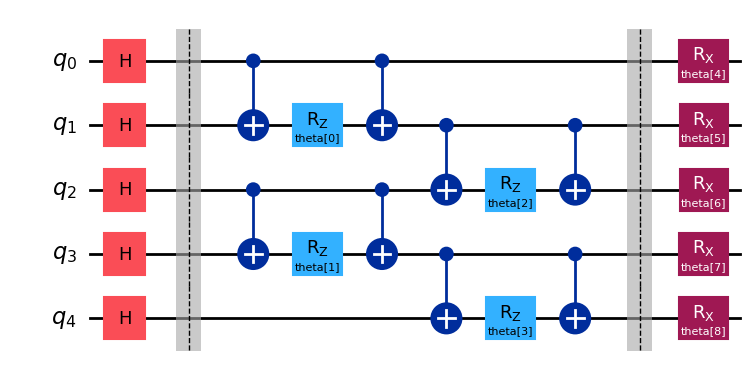

In [7]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)
ansatz.h(range(0,5))

ansatz.barrier()

ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.cx(1, 2)
ansatz.cx(3, 4)

ansatz.barrier()

ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)

ansatz.draw("mpl")

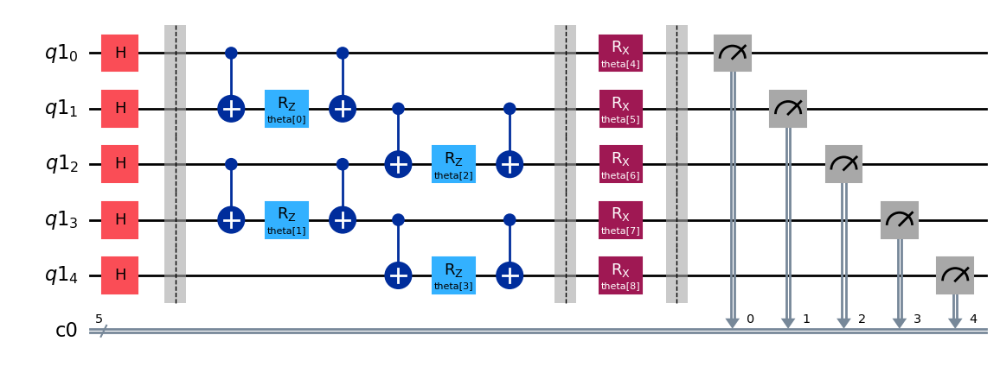

In [8]:
# Ansatz for VQNHE ZZ Measurement

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatz_zz = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_zz.h(range(0,5))

ansatz_zz.barrier()

ansatz_zz.cx(0, 1)
ansatz_zz.cx(2, 3)
ansatz_zz.rz(next(it), 1)
ansatz_zz.rz(next(it), 3)
ansatz_zz.cx(0, 1)
ansatz_zz.cx(2, 3)
ansatz_zz.cx(1, 2)
ansatz_zz.cx(3, 4)
ansatz_zz.rz(next(it), 2)
ansatz_zz.rz(next(it), 4)
ansatz_zz.cx(1, 2)
ansatz_zz.cx(3, 4)

ansatz_zz.barrier()

ansatz_zz.rx(next(it), 0)
ansatz_zz.rx(next(it), 1)
ansatz_zz.rx(next(it), 2)
ansatz_zz.rx(next(it), 3)
ansatz_zz.rx(next(it), 4)

ansatz_zz.barrier()

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

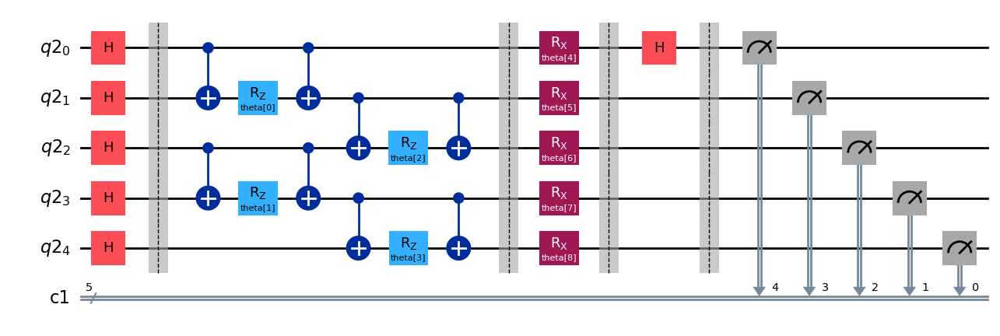

In [9]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = QuantumCircuit(qbit0, cbit0)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x0.h(range(0,5))

ansatz_x0.barrier()

ansatz_x0.cx(0, 1)
ansatz_x0.cx(2, 3)
ansatz_x0.rz(next(it), 1)
ansatz_x0.rz(next(it), 3)
ansatz_x0.cx(0, 1)
ansatz_x0.cx(2, 3)
ansatz_x0.cx(1, 2)
ansatz_x0.cx(3, 4)
ansatz_x0.rz(next(it), 2)
ansatz_x0.rz(next(it), 4)
ansatz_x0.cx(1, 2)
ansatz_x0.cx(3, 4)

ansatz_x0.barrier()

ansatz_x0.rx(next(it), 0)
ansatz_x0.rx(next(it), 1)
ansatz_x0.rx(next(it), 2)
ansatz_x0.rx(next(it), 3)
ansatz_x0.rx(next(it), 4)

ansatz_x0.barrier()

ansatz_x0.h(0)

ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

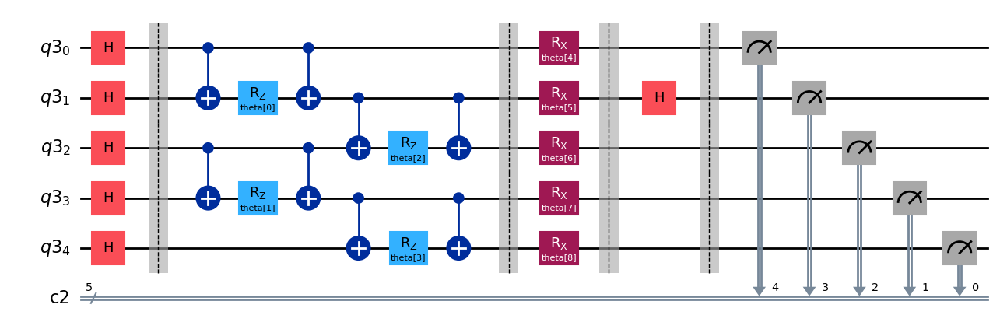

In [10]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = QuantumCircuit(qbit1, cbit1)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x1.h(range(0,5))

ansatz_x1.barrier()

ansatz_x1.cx(0, 1)
ansatz_x1.cx(2, 3)
ansatz_x1.rz(next(it), 1)
ansatz_x1.rz(next(it), 3)
ansatz_x1.cx(0, 1)
ansatz_x1.cx(2, 3)
ansatz_x1.cx(1, 2)
ansatz_x1.cx(3, 4)
ansatz_x1.rz(next(it), 2)
ansatz_x1.rz(next(it), 4)
ansatz_x1.cx(1, 2)
ansatz_x1.cx(3, 4)

ansatz_x1.barrier()

ansatz_x1.rx(next(it), 0)
ansatz_x1.rx(next(it), 1)
ansatz_x1.rx(next(it), 2)
ansatz_x1.rx(next(it), 3)
ansatz_x1.rx(next(it), 4)

ansatz_x1.barrier()

ansatz_x1.h(1)

ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

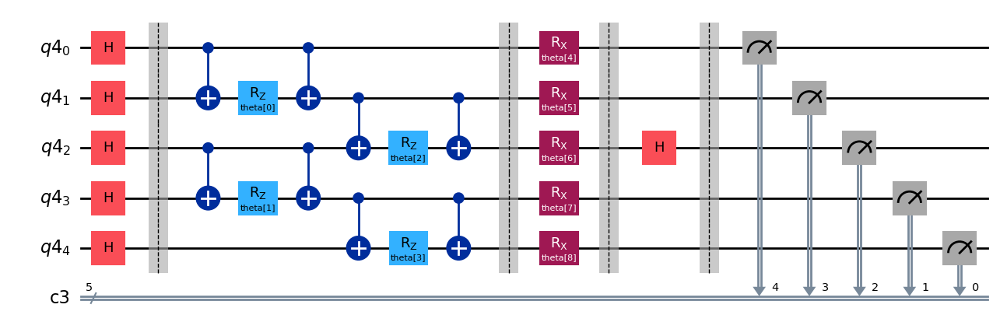

In [11]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = QuantumCircuit(qbit2, cbit2)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x2.h(range(0,5))

ansatz_x2.barrier()

ansatz_x2.cx(0, 1)
ansatz_x2.cx(2, 3)
ansatz_x2.rz(next(it), 1)
ansatz_x2.rz(next(it), 3)
ansatz_x2.cx(0, 1)
ansatz_x2.cx(2, 3)
ansatz_x2.cx(1, 2)
ansatz_x2.cx(3, 4)
ansatz_x2.rz(next(it), 2)
ansatz_x2.rz(next(it), 4)
ansatz_x2.cx(1, 2)
ansatz_x2.cx(3, 4)

ansatz_x2.barrier()

ansatz_x2.rx(next(it), 0)
ansatz_x2.rx(next(it), 1)
ansatz_x2.rx(next(it), 2)
ansatz_x2.rx(next(it), 3)
ansatz_x2.rx(next(it), 4)

ansatz_x2.barrier()

ansatz_x2.h(2)

ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

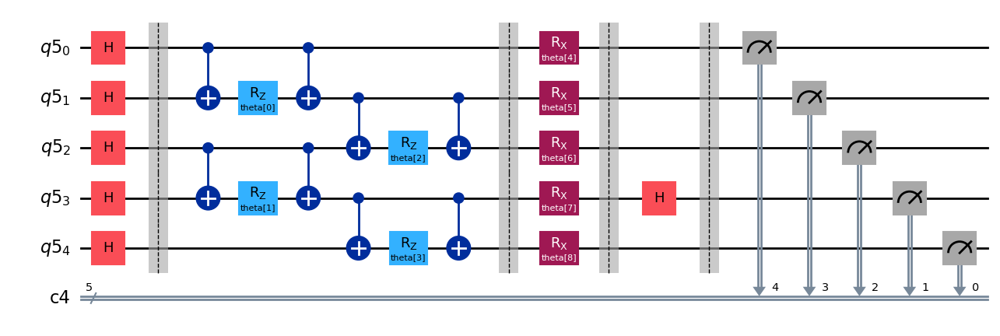

In [12]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = QuantumCircuit(qbit3, cbit3)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x3.h(range(0,5))

ansatz_x3.barrier()

ansatz_x3.cx(0, 1)
ansatz_x3.cx(2, 3)
ansatz_x3.rz(next(it), 1)
ansatz_x3.rz(next(it), 3)
ansatz_x3.cx(0, 1)
ansatz_x3.cx(2, 3)
ansatz_x3.cx(1, 2)
ansatz_x3.cx(3, 4)
ansatz_x3.rz(next(it), 2)
ansatz_x3.rz(next(it), 4)
ansatz_x3.cx(1, 2)
ansatz_x3.cx(3, 4)

ansatz_x3.barrier()

ansatz_x3.rx(next(it), 0)
ansatz_x3.rx(next(it), 1)
ansatz_x3.rx(next(it), 2)
ansatz_x3.rx(next(it), 3)
ansatz_x3.rx(next(it), 4)

ansatz_x3.barrier()

ansatz_x3.h(3)

ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

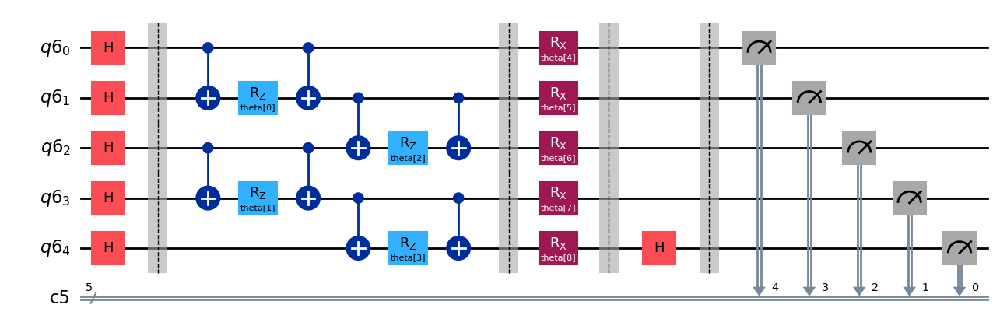

In [13]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = QuantumCircuit(qbit4, cbit4)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x4.h(range(0,5))

ansatz_x4.barrier()

ansatz_x4.cx(0, 1)
ansatz_x4.cx(2, 3)
ansatz_x4.rz(next(it), 1)
ansatz_x4.rz(next(it), 3)
ansatz_x4.cx(0, 1)
ansatz_x4.cx(2, 3)
ansatz_x4.cx(1, 2)
ansatz_x4.cx(3, 4)
ansatz_x4.rz(next(it), 2)
ansatz_x4.rz(next(it), 4)
ansatz_x4.cx(1, 2)
ansatz_x4.cx(3, 4)

ansatz_x4.barrier()

ansatz_x4.rx(next(it), 0)
ansatz_x4.rx(next(it), 1)
ansatz_x4.rx(next(it), 2)
ansatz_x4.rx(next(it), 3)
ansatz_x4.rx(next(it), 4)

ansatz_x4.barrier()

ansatz_x4.h(4)

ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [14]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)

In [15]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [16]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [17]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [18]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [19]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE & VQNHE

In [20]:
error_list = [0.001*i for i in range(10)]+[0.01*i for i in range(1,11,1)]

In [21]:
error_list

[0.0,
 0.001,
 0.002,
 0.003,
 0.004,
 0.005,
 0.006,
 0.007,
 0.008,
 0.009000000000000001,
 0.01,
 0.02,
 0.03,
 0.04,
 0.05,
 0.06,
 0.07,
 0.08,
 0.09,
 0.1]

In [ ]:
lowest_energy_vqe_list = []

for num in range(20):

  noise_model = NoiseModel()
  depolar_prob = error_list[num]

  # QuantumError objects
  noise_model.add_all_qubit_quantum_error(depolarizing_error(depolar_prob, 1), ['u1', 'u2', 'u3'])
  noise_model.add_all_qubit_quantum_error(depolarizing_error(depolar_prob, 2), ["cx"])


  estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
  sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


  lowest_energy_vqe = 0
  lowest_energy_vqnhe = 0

  for k in range(num*100+40, num*100+50, 1):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    if cost_func_vqnhe(np.zeros(shape=90), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=90), pqc)
      optimized_pqc = pqc

  print("error rate : {0}, lowest energy vqe : {1}".format(depolar_prob, lowest_energy_vqe))
  print()

  lowest_energy_vqe_list.append(lowest_energy_vqe)

error rate : 0.0, lowest energy vqe : -5.831799999999999

error rate : 0.001, lowest energy vqe : -5.8191999999999995

error rate : 0.002, lowest energy vqe : -5.775000000000001

error rate : 0.003, lowest energy vqe : -5.782000000000001

error rate : 0.004, lowest energy vqe : -5.7467999999999995

error rate : 0.005, lowest energy vqe : -5.742000000000001

error rate : 0.006, lowest energy vqe : -5.6944



In [ ]:
lowest_energy_vqe_list

In [ ]:
lowest_energy_vqnhe_list = []

for num in range(20):

  noise_model = NoiseModel()
  depolar_prob = error_list[num]

  # QuantumError objects
  noise_model.add_all_qubit_quantum_error(depolarizing_error(depolar_prob, 1), ['u1', 'u2', 'u3'])
  noise_model.add_all_qubit_quantum_error(depolarizing_error(depolar_prob, 2), ["cx"])


  estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
  sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


  lowest_energy_vqe = 0
  lowest_energy_vqnhe = 0

  for k in range(num*100+40, num*100+50, 1):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    if cost_func_vqnhe(np.zeros(shape=90), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=90), pqc)
      optimized_pqc = pqc

  print("error rate : {0}, lowest energy vqe : {1}".format(depolar_prob, lowest_energy_vqe))
  print()


  for k in range(num*100, num*100+10, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(90) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 400
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

  print("error rate : {0}, lowest energy vqnhe : {1}".format(depolar_prob, lowest_energy_vqnhe))
  print()
  print()
  print()

  lowest_energy_vqnhe_list.append(lowest_energy_vqnhe)

In [ ]:
lowest_energy_vqnhe_list

## Depolarization Channel, Error 0.001~0.1, Shots = 10000, CNN Hidden Layer 1개 + FC Hidden Layer 1개

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
    QuantumError,
    ReadoutError,
    depolarizing_error,
    pauli_error,
    thermal_relaxation_error,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

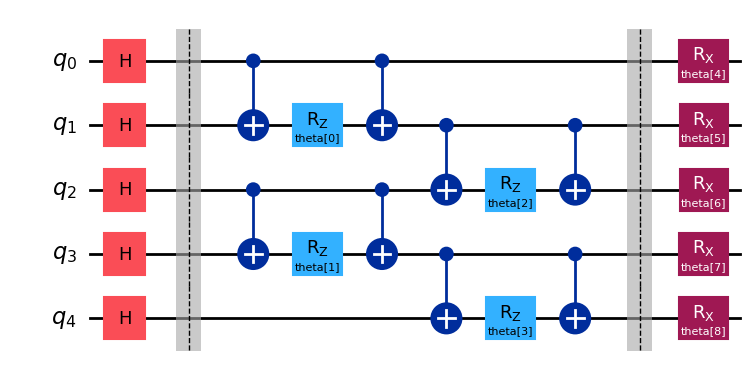

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)
ansatz.h(range(0,5))

ansatz.barrier()

ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.cx(1, 2)
ansatz.cx(3, 4)

ansatz.barrier()

ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)

ansatz.draw("mpl")

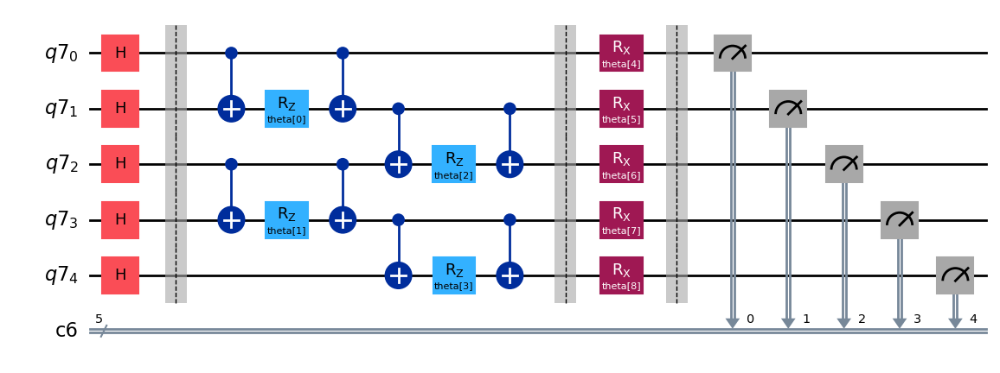

In [ ]:
# Ansatz for VQNHE ZZ Measurement

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatz_zz = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_zz.h(range(0,5))

ansatz_zz.barrier()

ansatz_zz.cx(0, 1)
ansatz_zz.cx(2, 3)
ansatz_zz.rz(next(it), 1)
ansatz_zz.rz(next(it), 3)
ansatz_zz.cx(0, 1)
ansatz_zz.cx(2, 3)
ansatz_zz.cx(1, 2)
ansatz_zz.cx(3, 4)
ansatz_zz.rz(next(it), 2)
ansatz_zz.rz(next(it), 4)
ansatz_zz.cx(1, 2)
ansatz_zz.cx(3, 4)

ansatz_zz.barrier()

ansatz_zz.rx(next(it), 0)
ansatz_zz.rx(next(it), 1)
ansatz_zz.rx(next(it), 2)
ansatz_zz.rx(next(it), 3)
ansatz_zz.rx(next(it), 4)

ansatz_zz.barrier()

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

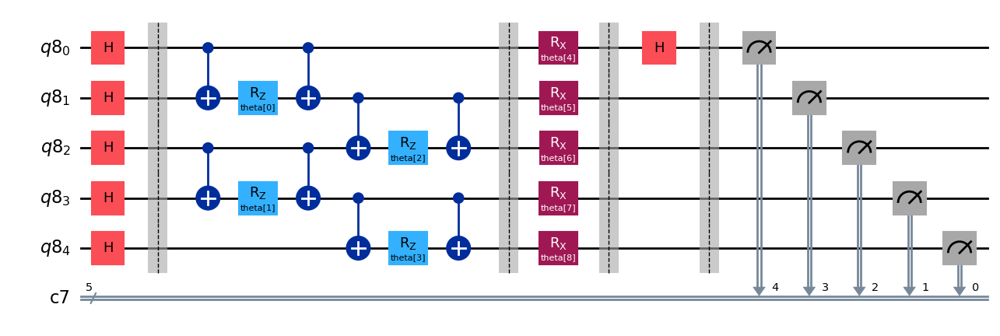

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = QuantumCircuit(qbit0, cbit0)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x0.h(range(0,5))

ansatz_x0.barrier()

ansatz_x0.cx(0, 1)
ansatz_x0.cx(2, 3)
ansatz_x0.rz(next(it), 1)
ansatz_x0.rz(next(it), 3)
ansatz_x0.cx(0, 1)
ansatz_x0.cx(2, 3)
ansatz_x0.cx(1, 2)
ansatz_x0.cx(3, 4)
ansatz_x0.rz(next(it), 2)
ansatz_x0.rz(next(it), 4)
ansatz_x0.cx(1, 2)
ansatz_x0.cx(3, 4)

ansatz_x0.barrier()

ansatz_x0.rx(next(it), 0)
ansatz_x0.rx(next(it), 1)
ansatz_x0.rx(next(it), 2)
ansatz_x0.rx(next(it), 3)
ansatz_x0.rx(next(it), 4)

ansatz_x0.barrier()

ansatz_x0.h(0)

ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

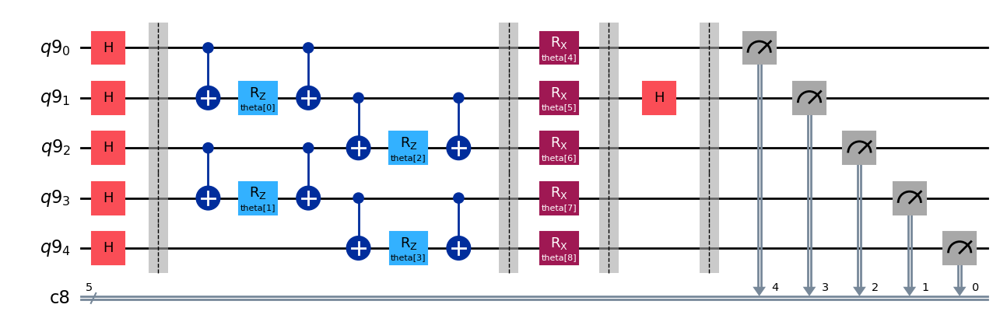

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = QuantumCircuit(qbit1, cbit1)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x1.h(range(0,5))

ansatz_x1.barrier()

ansatz_x1.cx(0, 1)
ansatz_x1.cx(2, 3)
ansatz_x1.rz(next(it), 1)
ansatz_x1.rz(next(it), 3)
ansatz_x1.cx(0, 1)
ansatz_x1.cx(2, 3)
ansatz_x1.cx(1, 2)
ansatz_x1.cx(3, 4)
ansatz_x1.rz(next(it), 2)
ansatz_x1.rz(next(it), 4)
ansatz_x1.cx(1, 2)
ansatz_x1.cx(3, 4)

ansatz_x1.barrier()

ansatz_x1.rx(next(it), 0)
ansatz_x1.rx(next(it), 1)
ansatz_x1.rx(next(it), 2)
ansatz_x1.rx(next(it), 3)
ansatz_x1.rx(next(it), 4)

ansatz_x1.barrier()

ansatz_x1.h(1)

ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

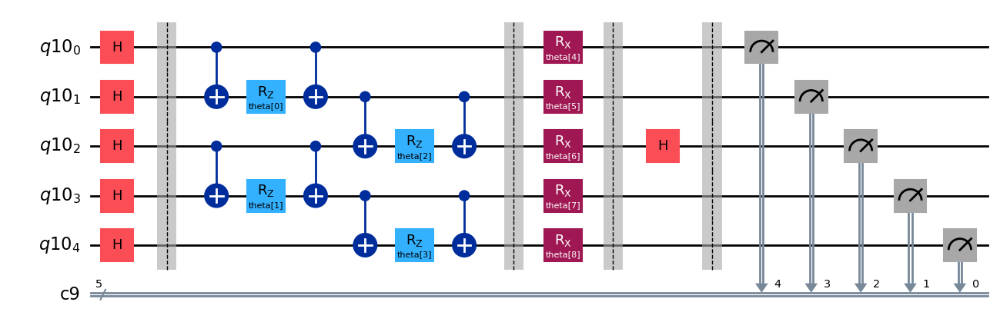

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = QuantumCircuit(qbit2, cbit2)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x2.h(range(0,5))

ansatz_x2.barrier()

ansatz_x2.cx(0, 1)
ansatz_x2.cx(2, 3)
ansatz_x2.rz(next(it), 1)
ansatz_x2.rz(next(it), 3)
ansatz_x2.cx(0, 1)
ansatz_x2.cx(2, 3)
ansatz_x2.cx(1, 2)
ansatz_x2.cx(3, 4)
ansatz_x2.rz(next(it), 2)
ansatz_x2.rz(next(it), 4)
ansatz_x2.cx(1, 2)
ansatz_x2.cx(3, 4)

ansatz_x2.barrier()

ansatz_x2.rx(next(it), 0)
ansatz_x2.rx(next(it), 1)
ansatz_x2.rx(next(it), 2)
ansatz_x2.rx(next(it), 3)
ansatz_x2.rx(next(it), 4)

ansatz_x2.barrier()

ansatz_x2.h(2)

ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

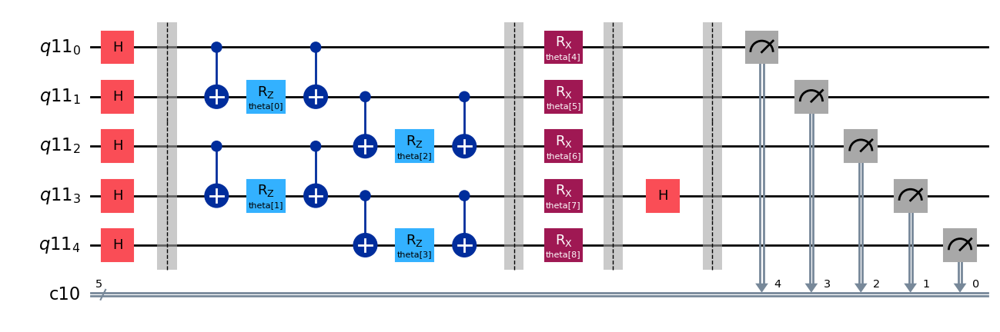

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = QuantumCircuit(qbit3, cbit3)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x3.h(range(0,5))

ansatz_x3.barrier()

ansatz_x3.cx(0, 1)
ansatz_x3.cx(2, 3)
ansatz_x3.rz(next(it), 1)
ansatz_x3.rz(next(it), 3)
ansatz_x3.cx(0, 1)
ansatz_x3.cx(2, 3)
ansatz_x3.cx(1, 2)
ansatz_x3.cx(3, 4)
ansatz_x3.rz(next(it), 2)
ansatz_x3.rz(next(it), 4)
ansatz_x3.cx(1, 2)
ansatz_x3.cx(3, 4)

ansatz_x3.barrier()

ansatz_x3.rx(next(it), 0)
ansatz_x3.rx(next(it), 1)
ansatz_x3.rx(next(it), 2)
ansatz_x3.rx(next(it), 3)
ansatz_x3.rx(next(it), 4)

ansatz_x3.barrier()

ansatz_x3.h(3)

ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

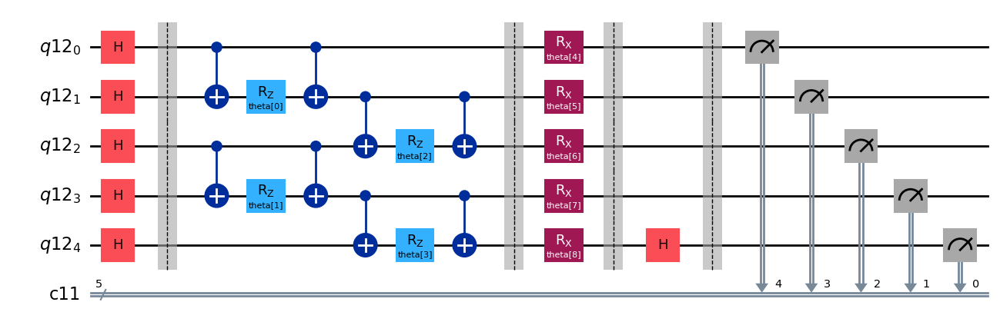

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = QuantumCircuit(qbit4, cbit4)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatz_x4.h(range(0,5))

ansatz_x4.barrier()

ansatz_x4.cx(0, 1)
ansatz_x4.cx(2, 3)
ansatz_x4.rz(next(it), 1)
ansatz_x4.rz(next(it), 3)
ansatz_x4.cx(0, 1)
ansatz_x4.cx(2, 3)
ansatz_x4.cx(1, 2)
ansatz_x4.cx(3, 4)
ansatz_x4.rz(next(it), 2)
ansatz_x4.rz(next(it), 4)
ansatz_x4.cx(1, 2)
ansatz_x4.cx(3, 4)

ansatz_x4.barrier()

ansatz_x4.rx(next(it), 0)
ansatz_x4.rx(next(it), 1)
ansatz_x4.rx(next(it), 2)
ansatz_x4.rx(next(it), 3)
ansatz_x4.rx(next(it), 4)

ansatz_x4.barrier()

ansatz_x4.h(4)

ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE & VQNHE

In [ ]:
error_list = [0.001*i for i in range(10)]+[0.01*i for i in range(1,11,1)]

In [ ]:
error_list

[0.0,
 0.001,
 0.002,
 0.003,
 0.004,
 0.005,
 0.006,
 0.007,
 0.008,
 0.009000000000000001,
 0.01,
 0.02,
 0.03,
 0.04,
 0.05,
 0.06,
 0.07,
 0.08,
 0.09,
 0.1]

In [ ]:
lowest_energy_vqe_list = []

for num in range(20):

  noise_model = NoiseModel()
  depolar_prob = error_list[num]

  # QuantumError objects
  noise_model.add_all_qubit_quantum_error(depolarizing_error(depolar_prob, 1), ['u1', 'u2', 'u3'])
  noise_model.add_all_qubit_quantum_error(depolarizing_error(depolar_prob, 2), ["cx"])


  estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
  sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


  lowest_energy_vqe = 0
  lowest_energy_vqnhe = 0

  for k in range(num*100+40, num*100+50, 1):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc

  print("error rate : {0}, lowest energy vqe : {1}".format(depolar_prob, lowest_energy_vqe))
  print()

  lowest_energy_vqe_list.append(lowest_energy_vqe)

error rate : 0.0, lowest energy vqe : -5.831799999999999

error rate : 0.001, lowest energy vqe : -5.8191999999999995

error rate : 0.002, lowest energy vqe : -5.775000000000001

error rate : 0.003, lowest energy vqe : -5.782000000000001

error rate : 0.004, lowest energy vqe : -5.7467999999999995

error rate : 0.005, lowest energy vqe : -5.742000000000001

error rate : 0.006, lowest energy vqe : -5.6944

error rate : 0.007, lowest energy vqe : -5.709399999999999

error rate : 0.008, lowest energy vqe : -5.684400000000002

error rate : 0.009000000000000001, lowest energy vqe : -5.6546

error rate : 0.01, lowest energy vqe : -5.6246

error rate : 0.02, lowest energy vqe : -5.4496

error rate : 0.03, lowest energy vqe : -5.256800000000002

error rate : 0.04, lowest energy vqe : -5.056400000000001

error rate : 0.05, lowest energy vqe : -4.8721999999999985

error rate : 0.06, lowest energy vqe : -4.706800000000002

error rate : 0.07, lowest energy vqe : -4.576600000000001

error rate : 0.

In [ ]:
lowest_energy_vqe_list

[-5.831799999999999,
 -5.8191999999999995,
 -5.775000000000001,
 -5.782000000000001,
 -5.7467999999999995,
 -5.742000000000001,
 -5.6944,
 -5.709399999999999,
 -5.684400000000002,
 -5.6546,
 -5.6246,
 -5.4496,
 -5.256800000000002,
 -5.056400000000001,
 -4.8721999999999985,
 -4.706800000000002,
 -4.576600000000001,
 -4.430999999999998,
 -4.254599999999999,
 -4.114799999999999]

In [ ]:
lowest_energy_vqnhe_list = []

for num in range(20):

  noise_model = NoiseModel()
  depolar_prob = error_list[num]

  # QuantumError objects
  noise_model.add_all_qubit_quantum_error(depolarizing_error(depolar_prob, 1), ['u1', 'u2', 'u3'])
  noise_model.add_all_qubit_quantum_error(depolarizing_error(depolar_prob, 2), ["cx"])


  estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
  sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


  lowest_energy_vqe = 0
  lowest_energy_vqnhe = 0

  for k in range(num*100+40, num*100+50, 1):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc

  print("error rate : {0}, lowest energy vqe : {1}".format(depolar_prob, lowest_energy_vqe))
  print()


  for k in range(num*100, num*100+10, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

  print("error rate : {0}, lowest energy vqnhe : {1}".format(depolar_prob, lowest_energy_vqnhe))
  print()
  print()
  print()

  lowest_energy_vqnhe_list.append(lowest_energy_vqnhe)

error rate : 0.0, lowest energy vqe : -5.831799999999999



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.903948
         Iterations: 60
         Function evaluations: 9031
         Gradient evaluations: 164


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.897615
         Iterations: 41
         Function evaluations: 6721
         Gradient evaluations: 122
Optimization terminated successfully.
         Current function value: -5.902854
         Iterations: 78
         Function evaluations: 9240
         Gradient evaluations: 168
Optimization terminated successfully.
         Current function value: -5.864111
         Iterations: 63
         Function evaluations: 4400
         Gradient evaluations: 80
Optimization terminated successfully.
         Current function value: -5.921569
         Iterations: 78
         Function evaluations: 6875
         Gradient evaluations: 125
Optimization terminated successfully.
         Current function value: -5.860597
         Iterations: 39
         Function evaluations: 2640
         Gradient evaluations: 48


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.900397
         Iterations: 57
         Function evaluations: 6055
         Gradient evaluations: 110
Optimization terminated successfully.
         Current function value: -5.900608
         Iterations: 100
         Function evaluations: 9295
         Gradient evaluations: 169
Optimization terminated successfully.
         Current function value: -5.895773
         Iterations: 23
         Function evaluations: 1430
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: -5.901901
         Iterations: 42
         Function evaluations: 2420
         Gradient evaluations: 44
error rate : 0.0, lowest energy vqnhe : -5.9215692209688084



error rate : 0.001, lowest energy vqe : -5.8191999999999995

Optimization terminated successfully.
         Current function value: -5.872847
         Iterations: 43
         Function evaluations: 2585
         Gradient evaluations: 47
Optimization terminated successfully

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.842839
         Iterations: 4
         Function evaluations: 2976
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: -5.821059
         Iterations: 18
         Function evaluations: 1265
         Gradient evaluations: 23


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.874404
         Iterations: 36
         Function evaluations: 6991
         Gradient evaluations: 127
Optimization terminated successfully.
         Current function value: -5.874866
         Iterations: 92
         Function evaluations: 7260
         Gradient evaluations: 132


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.871604
         Iterations: 28
         Function evaluations: 5287
         Gradient evaluations: 96
error rate : 0.001, lowest energy vqnhe : -5.9051113716317625



error rate : 0.002, lowest energy vqe : -5.775000000000001

Optimization terminated successfully.
         Current function value: -5.776677
         Iterations: 18
         Function evaluations: 1100
         Gradient evaluations: 20


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.849878
         Iterations: 54
         Function evaluations: 7987
         Gradient evaluations: 145


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.869496
         Iterations: 168
         Function evaluations: 16731
         Gradient evaluations: 304
Optimization terminated successfully.
         Current function value: -5.882039
         Iterations: 162
         Function evaluations: 12485
         Gradient evaluations: 227
Optimization terminated successfully.
         Current function value: -5.812554
         Iterations: 38
         Function evaluations: 2695
         Gradient evaluations: 49
Optimization terminated successfully.
         Current function value: -5.859794
         Iterations: 36
         Function evaluations: 2200
         Gradient evaluations: 40
Optimization terminated successfully.
         Current function value: -5.810124
         Iterations: 9
         Function evaluations: 990
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: -5.860276
         Iterations: 59
         Function evaluations: 4015
         Gradient 

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.886623
         Iterations: 30
         Function evaluations: 6392
         Gradient evaluations: 116
Optimization terminated successfully.
         Current function value: -5.881305
         Iterations: 71
         Function evaluations: 5225
         Gradient evaluations: 95
Optimization terminated successfully.
         Current function value: -5.815053
         Iterations: 41
         Function evaluations: 2860
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: -5.782000
         Iterations: 0
         Function evaluations: 55
         Gradient evaluations: 1
Optimization terminated successfully.
         Current function value: -5.832017
         Iterations: 34
         Function evaluations: 2145
         Gradient evaluations: 39
error rate : 0.003, lowest energy vqnhe : -5.88662268294751



error rate : 0.004, lowest energy vqe : -5.7467999999999995



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.824758
         Iterations: 51
         Function evaluations: 8206
         Gradient evaluations: 149


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.771251
         Iterations: 37
         Function evaluations: 4135
         Gradient evaluations: 75
Optimization terminated successfully.
         Current function value: -5.823477
         Iterations: 10
         Function evaluations: 1155
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: -5.768789
         Iterations: 15
         Function evaluations: 1210
         Gradient evaluations: 22
Optimization terminated successfully.
         Current function value: -5.829257
         Iterations: 77
         Function evaluations: 9240
         Gradient evaluations: 168
Optimization terminated successfully.
         Current function value: -5.764788
         Iterations: 3
         Function evaluations: 330
         Gradient evaluations: 6


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.839374
         Iterations: 114
         Function evaluations: 13321
         Gradient evaluations: 242
Optimization terminated successfully.
         Current function value: -5.776580
         Iterations: 21
         Function evaluations: 1430
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: -5.794593
         Iterations: 38
         Function evaluations: 6270
         Gradient evaluations: 114


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.810364
         Iterations: 58
         Function evaluations: 7706
         Gradient evaluations: 140
error rate : 0.004, lowest energy vqnhe : -5.839374372609238



error rate : 0.005, lowest energy vqe : -5.742000000000001

Optimization terminated successfully.
         Current function value: -5.771971
         Iterations: 35
         Function evaluations: 4565
         Gradient evaluations: 83


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.823752
         Iterations: 142
         Function evaluations: 16182
         Gradient evaluations: 294
Optimization terminated successfully.
         Current function value: -5.823257
         Iterations: 65
         Function evaluations: 5060
         Gradient evaluations: 92
Optimization terminated successfully.
         Current function value: -5.823945
         Iterations: 58
         Function evaluations: 3795
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: -5.836690
         Iterations: 37
         Function evaluations: 2530
         Gradient evaluations: 46
Optimization terminated successfully.
         Current function value: -5.824407
         Iterations: 296
         Function evaluations: 20955
         Gradient evaluations: 381
Optimization terminated successfully.
         Current function value: -5.742898
         Iterations: 9
         Function evaluations: 605
         Gradient 

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.744221
         Iterations: 5
         Function evaluations: 3745
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: -5.742898
         Iterations: 27
         Function evaluations: 1595
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: -5.772579
         Iterations: 26
         Function evaluations: 1650
         Gradient evaluations: 30
error rate : 0.005, lowest energy vqnhe : -5.836689658429629



error rate : 0.006, lowest energy vqe : -5.6944

Optimization terminated successfully.
         Current function value: -5.808364
         Iterations: 92
         Function evaluations: 6050
         Gradient evaluations: 110
Optimization terminated successfully.
         Current function value: -5.752148
         Iterations: 21
         Function evaluations: 1760
         Gradient evaluations: 32


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.757709
         Iterations: 281
         Function evaluations: 23770
         Gradient evaluations: 432


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.743845
         Iterations: 67
         Function evaluations: 10069
         Gradient evaluations: 183
Optimization terminated successfully.
         Current function value: -5.695017
         Iterations: 25
         Function evaluations: 1430
         Gradient evaluations: 26


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.735724
         Iterations: 16
         Function evaluations: 5178
         Gradient evaluations: 94
Optimization terminated successfully.
         Current function value: -5.737654
         Iterations: 32
         Function evaluations: 2310
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: -5.805710
         Iterations: 110
         Function evaluations: 12980
         Gradient evaluations: 236
Optimization terminated successfully.
         Current function value: -5.760383
         Iterations: 32
         Function evaluations: 2475
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: -5.808484
         Iterations: 25
         Function evaluations: 1650
         Gradient evaluations: 30
error rate : 0.006, lowest energy vqnhe : -5.808483999142415



error rate : 0.007, lowest energy vqe : -5.709399999999999



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.828647
         Iterations: 35
         Function evaluations: 6440
         Gradient evaluations: 117
Optimization terminated successfully.
         Current function value: -5.756774
         Iterations: 32
         Function evaluations: 1980
         Gradient evaluations: 36


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.825133
         Iterations: 44
         Function evaluations: 6447
         Gradient evaluations: 117
Optimization terminated successfully.
         Current function value: -5.709408
         Iterations: 10
         Function evaluations: 660
         Gradient evaluations: 12
Optimization terminated successfully.
         Current function value: -5.797708
         Iterations: 45
         Function evaluations: 2970
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: -5.764550
         Iterations: 54
         Function evaluations: 4015
         Gradient evaluations: 73
Optimization terminated successfully.
         Current function value: -5.774309
         Iterations: 39
         Function evaluations: 3025
         Gradient evaluations: 55
Optimization terminated successfully.
         Current function value: -5.827833
         Iterations: 47
         Function evaluations: 2750
         Gradient eval

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.714425
         Iterations: 9
         Function evaluations: 4521
         Gradient evaluations: 82


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.738934
         Iterations: 19
         Function evaluations: 4742
         Gradient evaluations: 86
Optimization terminated successfully.
         Current function value: -5.787440
         Iterations: 63
         Function evaluations: 4345
         Gradient evaluations: 79
Optimization terminated successfully.
         Current function value: -5.775048
         Iterations: 20
         Function evaluations: 1320
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: -5.741271
         Iterations: 53
         Function evaluations: 3300
         Gradient evaluations: 60
Optimization terminated successfully.
         Current function value: -5.756113
         Iterations: 79
         Function evaluations: 5830
         Gradient evaluations: 106
error rate : 0.008, lowest energy vqnhe : -5.787439979698193



error rate : 0.009000000000000001, lowest energy vqe : -5.6546

Optimization terminated successful

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.695681
         Iterations: 134
         Function evaluations: 15190
         Gradient evaluations: 276
Optimization terminated successfully.
         Current function value: -5.654600
         Iterations: 1
         Function evaluations: 110
         Gradient evaluations: 2


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.728248
         Iterations: 119
         Function evaluations: 13265
         Gradient evaluations: 241
Optimization terminated successfully.
         Current function value: -5.757376
         Iterations: 219
         Function evaluations: 17600
         Gradient evaluations: 320
Optimization terminated successfully.
         Current function value: -5.692339
         Iterations: 38
         Function evaluations: 2310
         Gradient evaluations: 42
Optimization terminated successfully.
         Current function value: -5.757147
         Iterations: 74
         Function evaluations: 7434
         Gradient evaluations: 135


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.765175
         Iterations: 56
         Function evaluations: 7325
         Gradient evaluations: 133
Optimization terminated successfully.
         Current function value: -5.768134
         Iterations: 95
         Function evaluations: 9295
         Gradient evaluations: 169


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.686956
         Iterations: 24
         Function evaluations: 6442
         Gradient evaluations: 117
error rate : 0.009000000000000001, lowest energy vqnhe : -5.768134065885558



error rate : 0.01, lowest energy vqe : -5.6246

Optimization terminated successfully.
         Current function value: -5.673007
         Iterations: 23
         Function evaluations: 1705
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: -5.624600
         Iterations: 2
         Function evaluations: 220
         Gradient evaluations: 4
Optimization terminated successfully.
         Current function value: -5.726225
         Iterations: 36
         Function evaluations: 2255
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: -5.624600
         Iterations: 0
         Function evaluations: 55
         Gradient evaluations: 1
Optimization terminated successfully.
    

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.705343
         Iterations: 132
         Function evaluations: 16122
         Gradient evaluations: 293
Optimization terminated successfully.
         Current function value: -5.727551
         Iterations: 54
         Function evaluations: 3520
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: -5.727475
         Iterations: 55
         Function evaluations: 3905
         Gradient evaluations: 71
error rate : 0.01, lowest energy vqnhe : -5.727824786531487



error rate : 0.02, lowest energy vqe : -5.4496

Optimization terminated successfully.
         Current function value: -5.449792
         Iterations: 12
         Function evaluations: 880
         Gradient evaluations: 16
Optimization terminated successfully.
         Current function value: -5.606434
         Iterations: 124
         Function evaluations: 13255
         Gradient evaluations: 241
Optimization terminated successfully.
         

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.519476
         Iterations: 42
         Function evaluations: 5016
         Gradient evaluations: 91
Optimization terminated successfully.
         Current function value: -5.449793
         Iterations: 2
         Function evaluations: 275
         Gradient evaluations: 5


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.600544
         Iterations: 82
         Function evaluations: 10952
         Gradient evaluations: 199
Optimization terminated successfully.
         Current function value: -5.613545
         Iterations: 65
         Function evaluations: 4730
         Gradient evaluations: 86
Optimization terminated successfully.
         Current function value: -5.590128
         Iterations: 76
         Function evaluations: 4950
         Gradient evaluations: 90


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.527883
         Iterations: 61
         Function evaluations: 7427
         Gradient evaluations: 135
error rate : 0.02, lowest energy vqnhe : -5.613545399129404



error rate : 0.03, lowest energy vqe : -5.256800000000002

Optimization terminated successfully.
         Current function value: -5.458938
         Iterations: 17
         Function evaluations: 1100
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: -5.460875
         Iterations: 50
         Function evaluations: 3025
         Gradient evaluations: 55


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.455503
         Iterations: 84
         Function evaluations: 8916
         Gradient evaluations: 162
Optimization terminated successfully.
         Current function value: -5.460960
         Iterations: 31
         Function evaluations: 1760
         Gradient evaluations: 32


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.338670
         Iterations: 86
         Function evaluations: 10677
         Gradient evaluations: 194
Optimization terminated successfully.
         Current function value: -5.459033
         Iterations: 51
         Function evaluations: 3245
         Gradient evaluations: 59
Optimization terminated successfully.
         Current function value: -5.317422
         Iterations: 19
         Function evaluations: 1100
         Gradient evaluations: 20
Optimization terminated successfully.
         Current function value: -5.460801
         Iterations: 46
         Function evaluations: 3080
         Gradient evaluations: 56
Optimization terminated successfully.
         Current function value: -5.458955
         Iterations: 41
         Function evaluations: 2695
         Gradient evaluations: 49


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.333792
         Iterations: 66
         Function evaluations: 9305
         Gradient evaluations: 169
error rate : 0.03, lowest energy vqnhe : -5.460960445529198



error rate : 0.04, lowest energy vqe : -5.056400000000001

Optimization terminated successfully.
         Current function value: -5.309513
         Iterations: 97
         Function evaluations: 6655
         Gradient evaluations: 121
Optimization terminated successfully.
         Current function value: -5.124620
         Iterations: 14
         Function evaluations: 1540
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: -5.152873
         Iterations: 34
         Function evaluations: 4070
         Gradient evaluations: 74
Optimization terminated successfully.
         Current function value: -5.310324
         Iterations: 66
         Function evaluations: 4455
         Gradient evaluations: 81
Optimization terminated successfully.
 

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.310528
         Iterations: 54
         Function evaluations: 11342
         Gradient evaluations: 206


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.146757
         Iterations: 24
         Function evaluations: 4906
         Gradient evaluations: 89
Optimization terminated successfully.
         Current function value: -5.124620
         Iterations: 14
         Function evaluations: 990
         Gradient evaluations: 18


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.318625
         Iterations: 149
         Function evaluations: 16727
         Gradient evaluations: 304
error rate : 0.04, lowest energy vqnhe : -5.318625460239696



error rate : 0.05, lowest energy vqe : -4.8721999999999985

Optimization terminated successfully.
         Current function value: -4.958665
         Iterations: 41
         Function evaluations: 8415
         Gradient evaluations: 153


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.142257
         Iterations: 27
         Function evaluations: 6004
         Gradient evaluations: 109


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.874884
         Iterations: 26
         Function evaluations: 5339
         Gradient evaluations: 97
Optimization terminated successfully.
         Current function value: -5.216971
         Iterations: 40
         Function evaluations: 2365
         Gradient evaluations: 43


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.217420
         Iterations: 128
         Function evaluations: 14365
         Gradient evaluations: 261


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.971966
         Iterations: 15
         Function evaluations: 4357
         Gradient evaluations: 79
Optimization terminated successfully.
         Current function value: -5.216595
         Iterations: 28
         Function evaluations: 1870
         Gradient evaluations: 34


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.208042
         Iterations: 103
         Function evaluations: 14807
         Gradient evaluations: 269
Optimization terminated successfully.
         Current function value: -5.135251
         Iterations: 19
         Function evaluations: 1595
         Gradient evaluations: 29


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.044182
         Iterations: 38
         Function evaluations: 6330
         Gradient evaluations: 115
error rate : 0.05, lowest energy vqnhe : -5.2174201256509285



error rate : 0.06, lowest energy vqe : -4.706800000000002



/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.863231
         Iterations: 13
         Function evaluations: 3751
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: -4.929487
         Iterations: 24
         Function evaluations: 3410
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: -4.817217
         Iterations: 14
         Function evaluations: 990
         Gradient evaluations: 18
Optimization terminated successfully.
         Current function value: -4.882262
         Iterations: 45
         Function evaluations: 2915
         Gradient evaluations: 53


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.113364
         Iterations: 156
         Function evaluations: 12493
         Gradient evaluations: 227
Optimization terminated successfully.
         Current function value: -5.100524
         Iterations: 76
         Function evaluations: 6050
         Gradient evaluations: 110
Optimization terminated successfully.
         Current function value: -5.046667
         Iterations: 38
         Function evaluations: 3135
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: -4.856975
         Iterations: 19
         Function evaluations: 1155
         Gradient evaluations: 21


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.820294
         Iterations: 3
         Function evaluations: 6117
         Gradient evaluations: 111
Optimization terminated successfully.
         Current function value: -4.865660
         Iterations: 39
         Function evaluations: 2640
         Gradient evaluations: 48
error rate : 0.06, lowest energy vqnhe : -5.1133637963997245



error rate : 0.07, lowest energy vqe : -4.576600000000001

Optimization terminated successfully.
         Current function value: -4.956498
         Iterations: 24
         Function evaluations: 2090
         Gradient evaluations: 38
Optimization terminated successfully.
         Current function value: -4.961433
         Iterations: 36
         Function evaluations: 2640
         Gradient evaluations: 48
Optimization terminated successfully.
         Current function value: -4.965836
         Iterations: 20
         Function evaluations: 2585
         Gradient evaluations: 47
Optimization terminated successfully.
  

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.031851
         Iterations: 41
         Function evaluations: 7708
         Gradient evaluations: 140
Optimization terminated successfully.
         Current function value: -4.583802
         Iterations: 8
         Function evaluations: 660
         Gradient evaluations: 12


<ipython-input-46-4048d43bbc56>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-25-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-25-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-25-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-25-942dbc8389c9>:54: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-46-4048d43bbc56>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-25-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-25-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in s

         Current function value: nan
         Iterations: 32
         Function evaluations: 8690
         Gradient evaluations: 158


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.013207
         Iterations: 56
         Function evaluations: 11617
         Gradient evaluations: 211


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.029072
         Iterations: 82
         Function evaluations: 9630
         Gradient evaluations: 175
error rate : 0.07, lowest energy vqnhe : -5.031851065964



error rate : 0.08, lowest energy vqe : -4.430999999999998

Optimization terminated successfully.
         Current function value: -4.981780
         Iterations: 139
         Function evaluations: 8855
         Gradient evaluations: 161
Optimization terminated successfully.
         Current function value: -4.967187
         Iterations: 25
         Function evaluations: 1540
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: -4.935037
         Iterations: 69
         Function evaluations: 6105
         Gradient evaluations: 111
Optimization terminated successfully.
         Current function value: -4.441542
         Iterations: 5
         Function evaluations: 385
         Gradient evaluations: 7


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.973514
         Iterations: 76
         Function evaluations: 10792
         Gradient evaluations: 196
Optimization terminated successfully.
         Current function value: -4.607947
         Iterations: 44
         Function evaluations: 2805
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: -4.943426
         Iterations: 82
         Function evaluations: 7425
         Gradient evaluations: 135
Optimization terminated successfully.
         Current function value: -4.723343
         Iterations: 16
         Function evaluations: 1155
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: -4.441542
         Iterations: 12
         Function evaluations: 770
         Gradient evaluations: 14
Optimization terminated successfully.
         Current function value: -4.882211
         Iterations: 16
         Function evaluations: 1540
         Gradient ev

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.863445
         Iterations: 190
         Function evaluations: 17007
         Gradient evaluations: 309


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.491423
         Iterations: 58
         Function evaluations: 8977
         Gradient evaluations: 163
Optimization terminated successfully.
         Current function value: -4.843244
         Iterations: 61
         Function evaluations: 3795
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: -4.714009
         Iterations: 16
         Function evaluations: 1320
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: -4.585880
         Iterations: 15
         Function evaluations: 1155
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: -4.853432
         Iterations: 58
         Function evaluations: 3575
         Gradient evaluations: 65
error rate : 0.09, lowest energy vqnhe : -4.863445336486164



error rate : 0.1, lowest energy vqe : -4.114799999999999

Optimization terminated successfully.
   

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.751654
         Iterations: 69
         Function evaluations: 5830
         Gradient evaluations: 106
Optimization terminated successfully.
         Current function value: -4.320494
         Iterations: 12
         Function evaluations: 990
         Gradient evaluations: 18


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.774759
         Iterations: 29
         Function evaluations: 6166
         Gradient evaluations: 112


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.241151
         Iterations: 10
         Function evaluations: 6777
         Gradient evaluations: 123
Optimization terminated successfully.
         Current function value: -4.755514
         Iterations: 60
         Function evaluations: 4950
         Gradient evaluations: 90
Optimization terminated successfully.
         Current function value: -4.744186
         Iterations: 66
         Function evaluations: 4510
         Gradient evaluations: 82
Optimization terminated successfully.
         Current function value: -4.751654
         Iterations: 99
         Function evaluations: 8030
         Gradient evaluations: 146
         Current function value: -4.739020
         Iterations: 74
         Function evaluations: 9411
         Gradient evaluations: 171
error rate : 0.1, lowest energy vqnhe : -4.774758869722714





/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe_list

[-5.9215692209688084,
 -5.9051113716317625,
 -5.882038846182267,
 -5.88662268294751,
 -5.839374372609238,
 -5.836689658429629,
 -5.808483999142415,
 -5.8287110002385445,
 -5.787439979698193,
 -5.768134065885558,
 -5.727824786531487,
 -5.613545399129404,
 -5.460960445529198,
 -5.318625460239696,
 -5.2174201256509285,
 -5.1133637963997245,
 -5.031851065964,
 -4.981779980345924,
 -4.863445336486164,
 -4.774758869722714]

# 6. CNN Estimation - ZZ Crosstalk (CUSCO 0 1 2 3 4)

## ZZ Crosstalk, Shots = 10000

CUSCO 0 1 2 3 4

J = 1MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 0 1 2 3 4

J = 1MHz

In [ ]:
# Qubit Number 0,1,2,3,4

J = 0.001                                                   # Unit : GHz
freq = [5.015, 4.956, 4.807, 5.232, 5.138]                  # Unit : GHz
anharm = [-0.30739, -0.30775, -0.31038, -0.30373, -0.3054]  # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_01 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_12 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[2]+anharm[2], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[2]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_23 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

[5.01501694 4.95598306]
[9.72260195 9.9710135  9.60424455]
1.350452146908765e-05
[4.95600671 4.80699329]
[9.6042374  9.76301695 9.30361565]
1.6950613608734955e-05
[4.80699765 5.23200235]
[ 9.30361728 10.03898623 10.16028649]
-1.3770519234235223e-05
[5.23201064 5.13798936]
[10.16026046 10.37001454  9.97059499]
1.4542737942768724e-05


In [ ]:
crosstalk_freq_01, crosstalk_freq_12, crosstalk_freq_23, crosstalk_freq_34

(6.752260734543825e-06,
 8.475306804367477e-06,
 -6.885259617117612e-06,
 7.271368971384362e-06)

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 940
gate_34 = 460

gate_single = 40

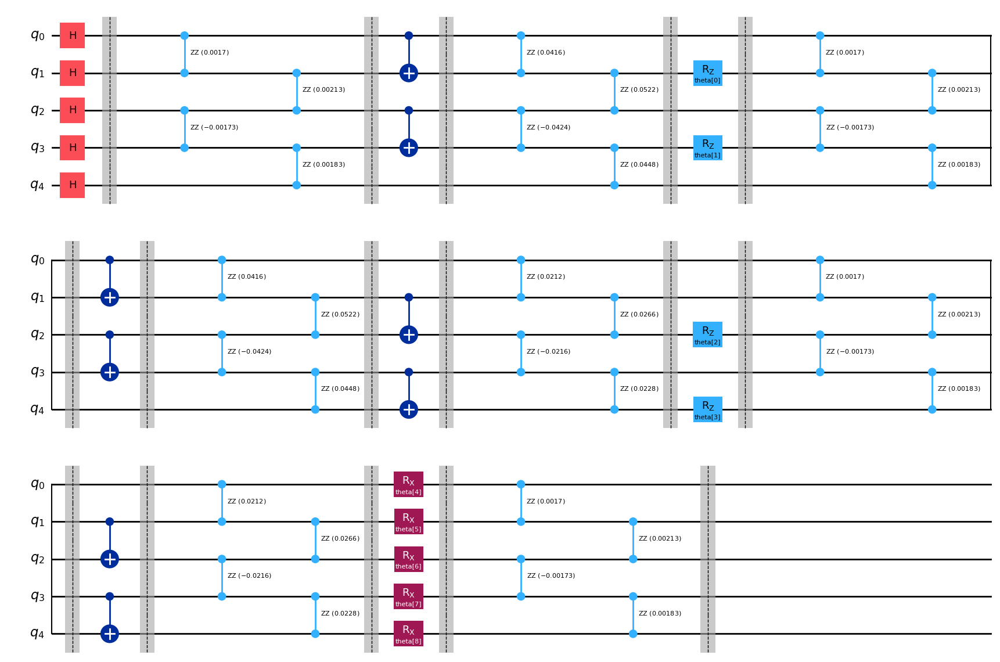

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.draw("mpl")

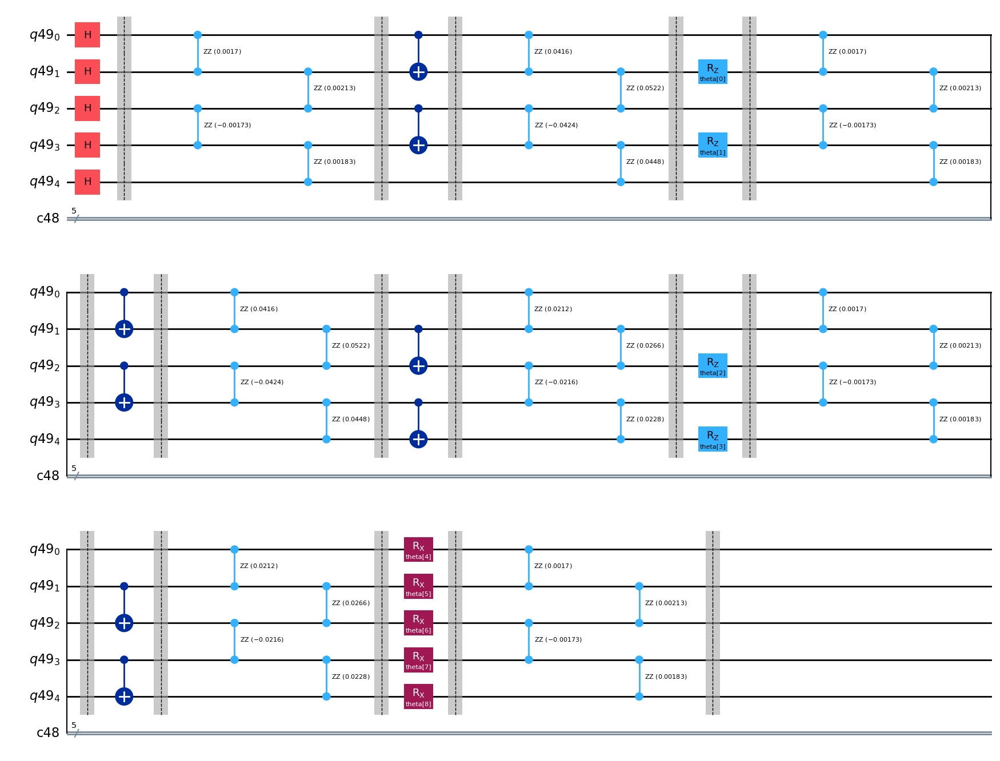

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

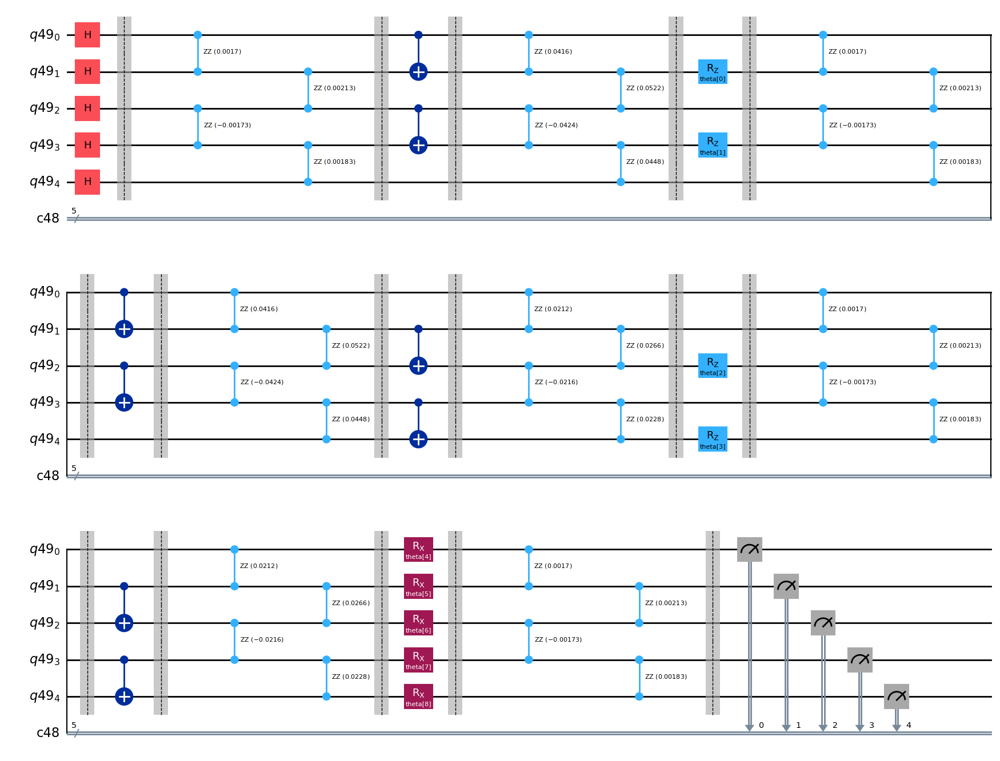

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

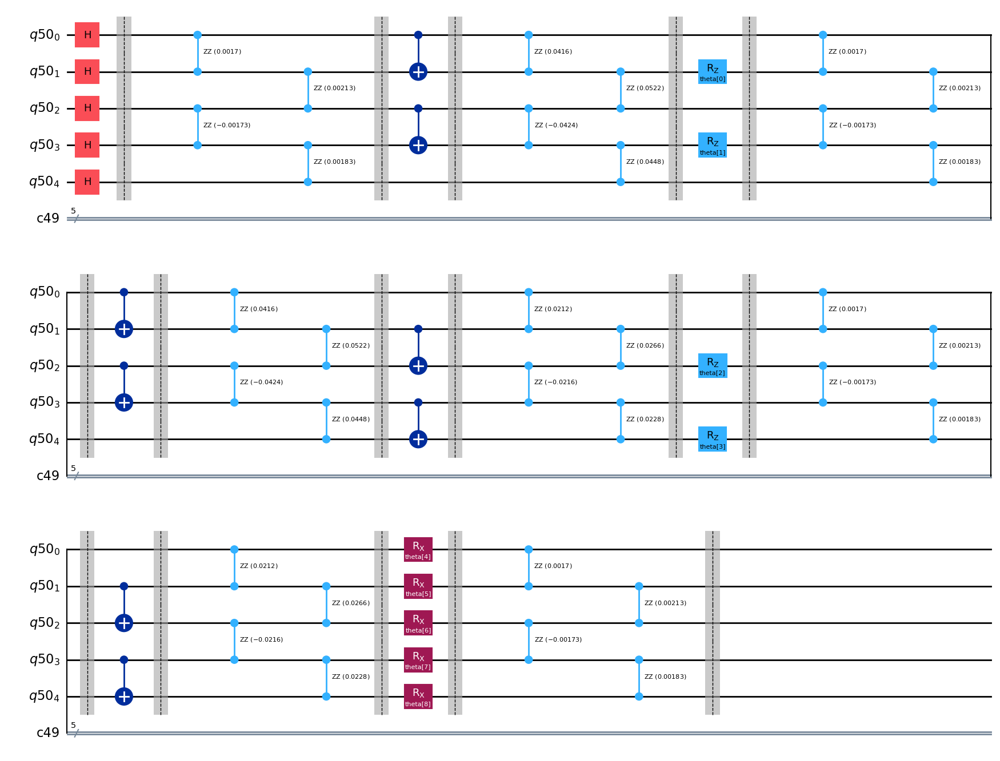

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

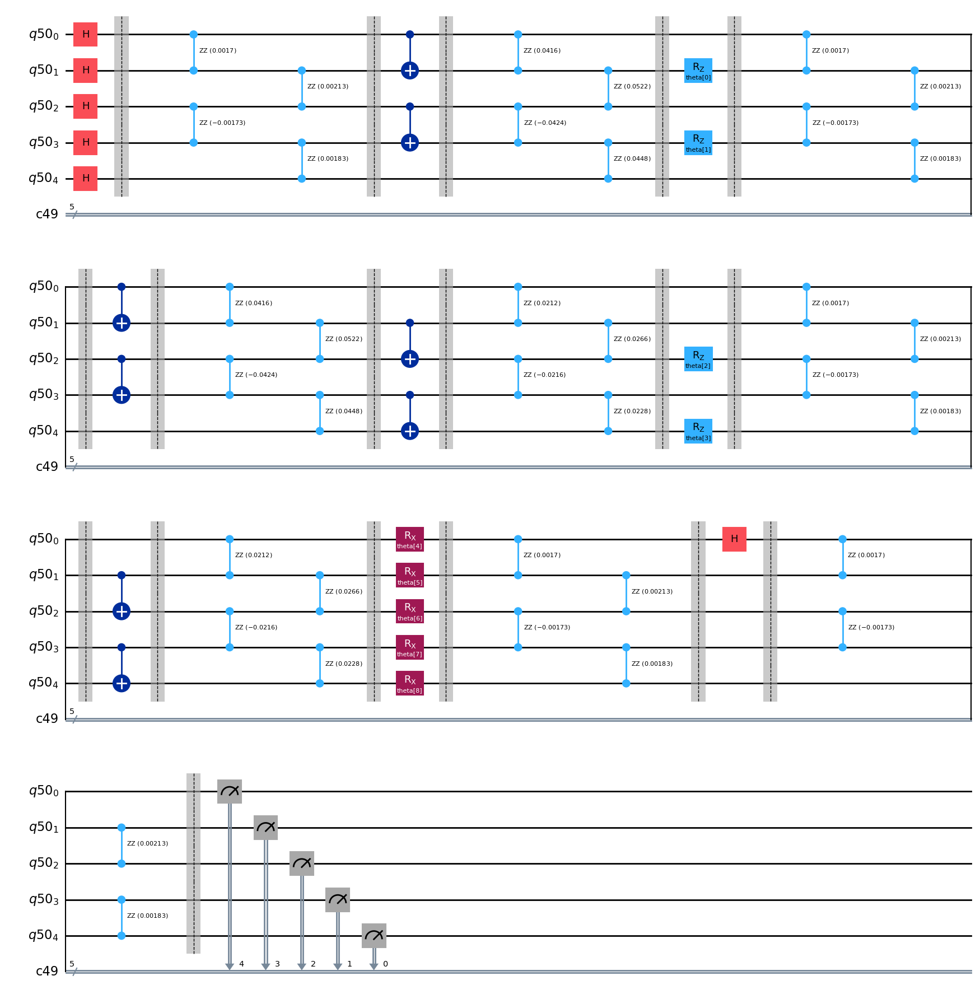

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

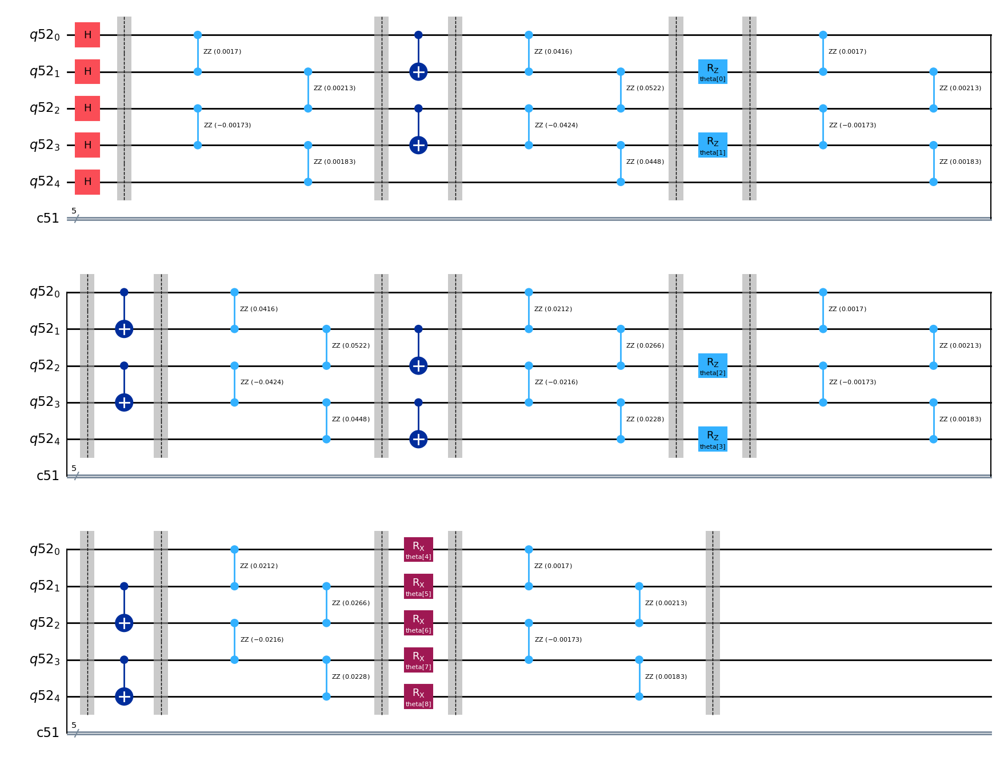

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

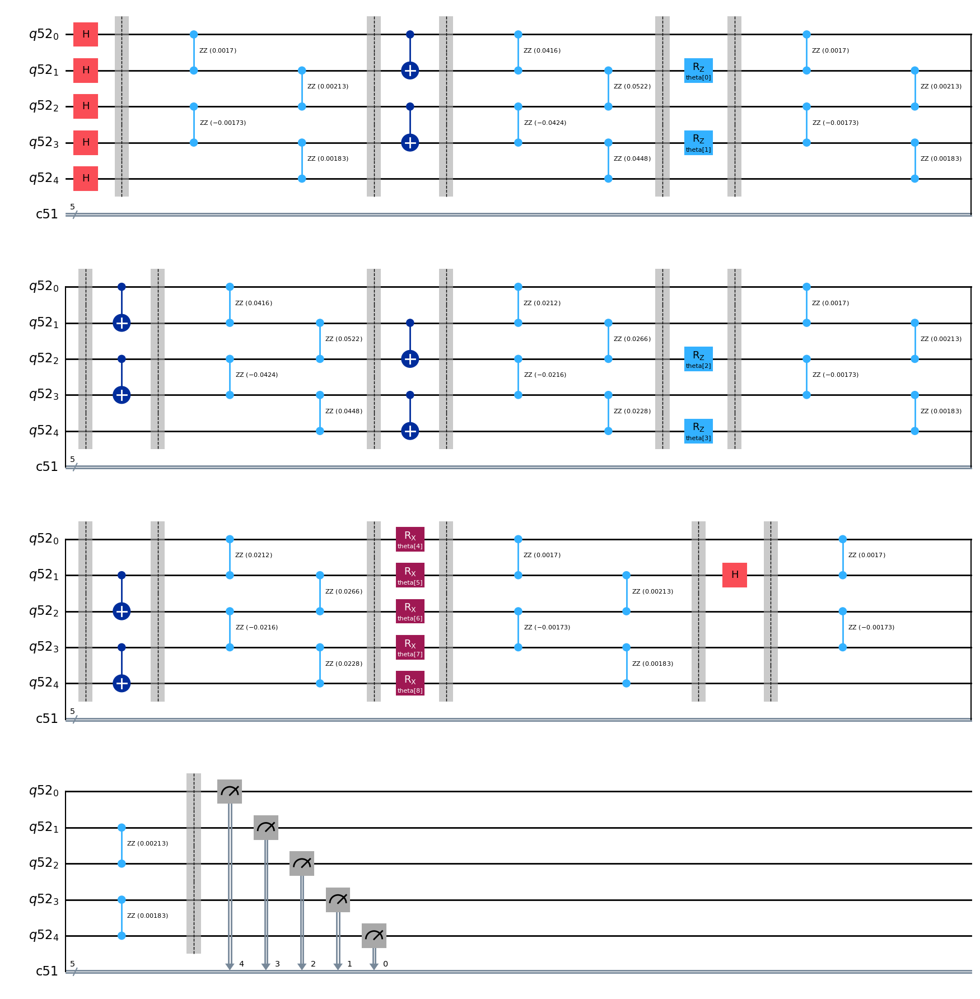

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

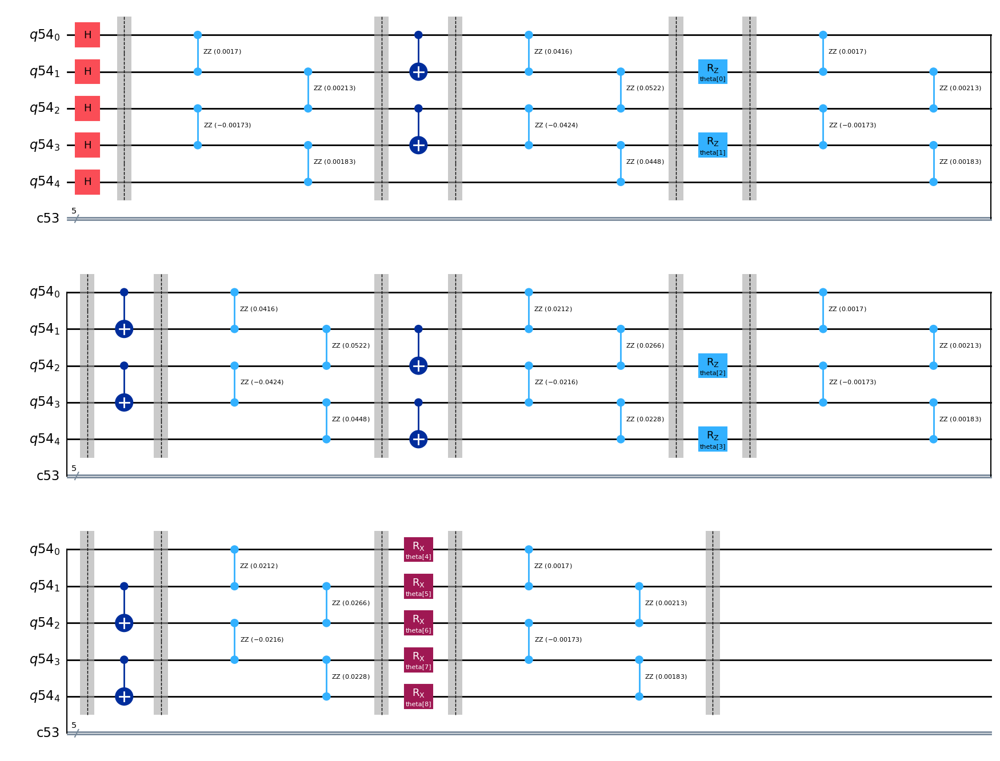

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

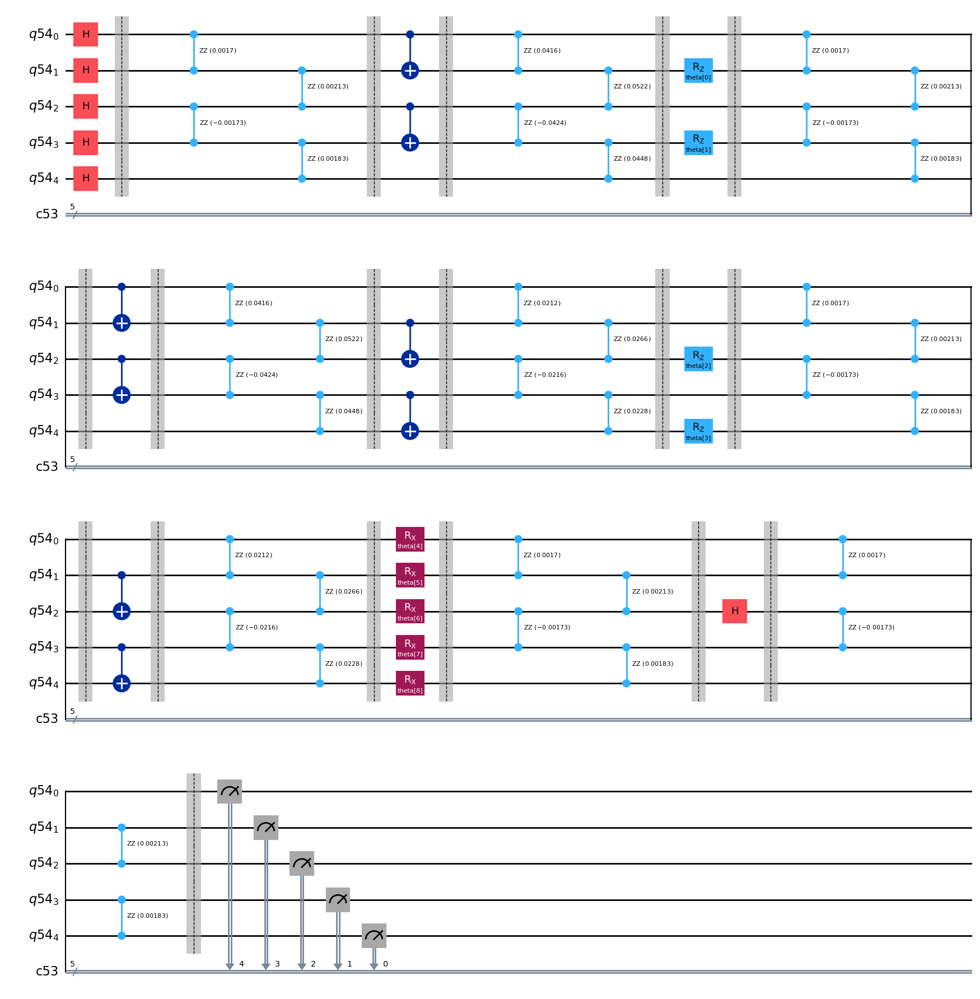

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

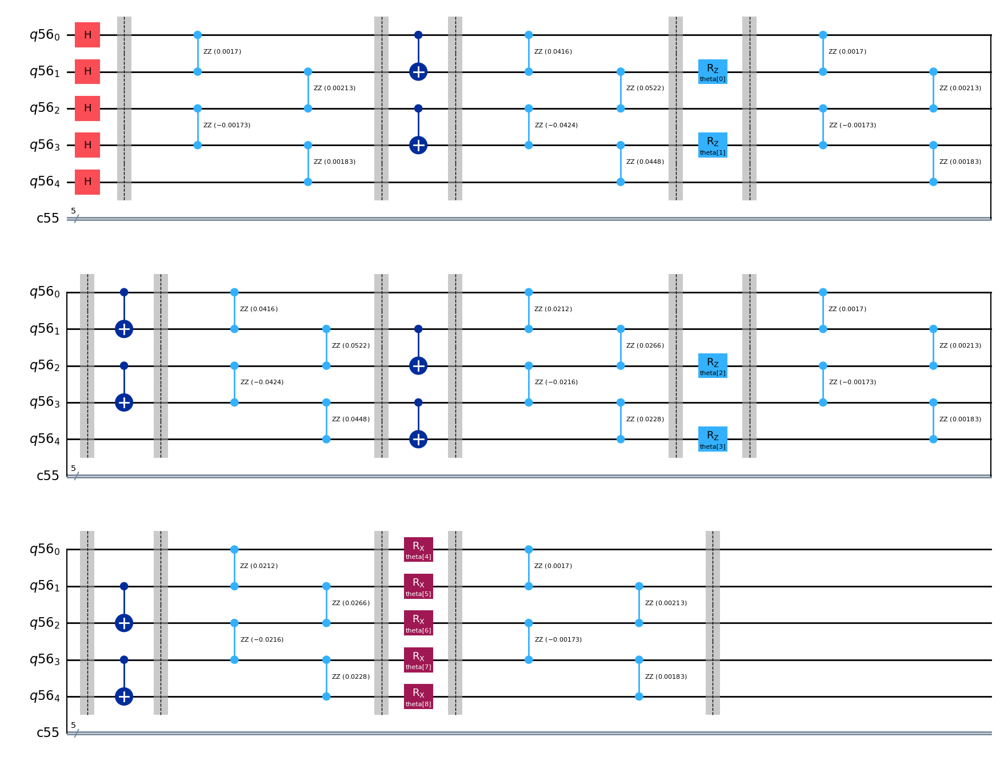

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

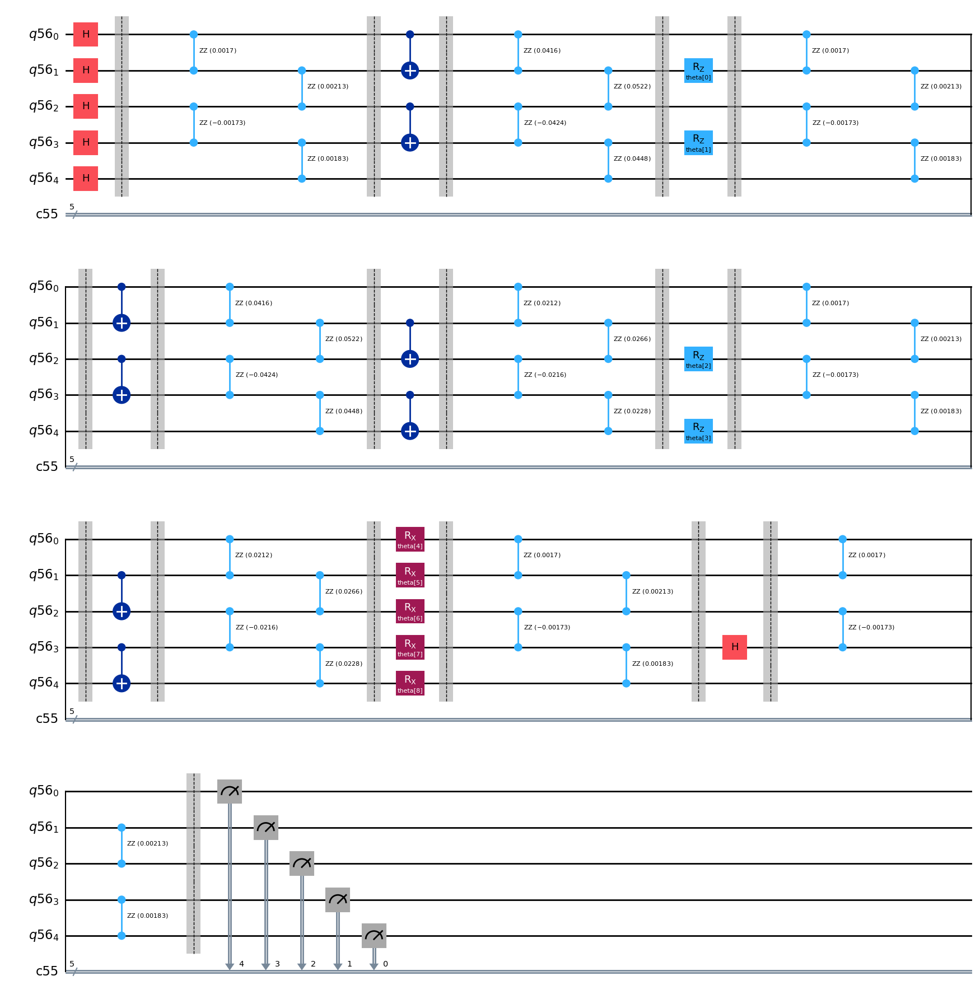

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

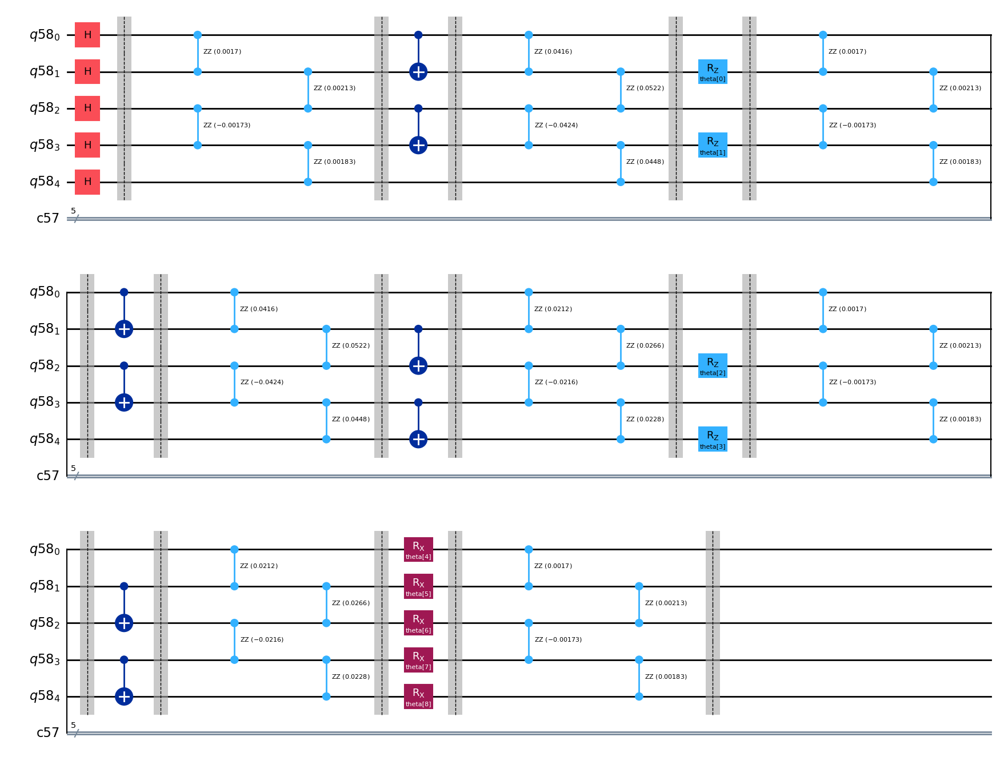

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

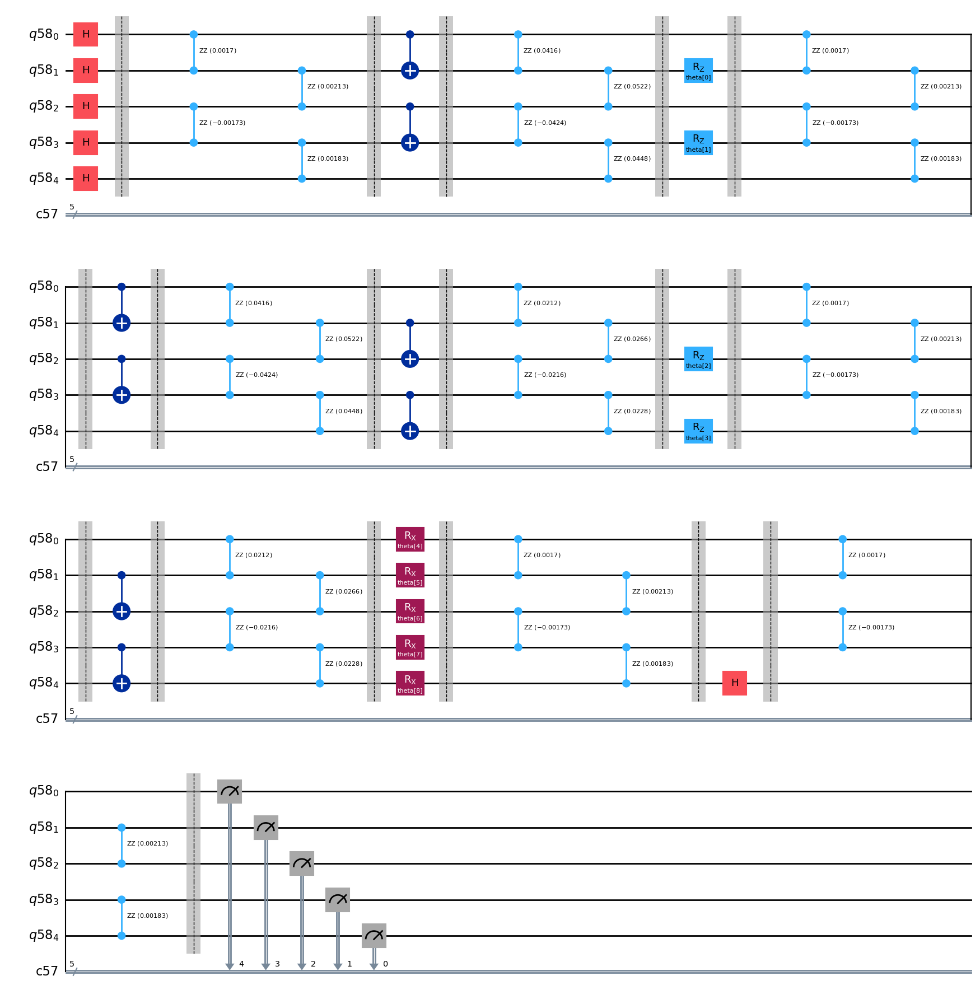

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

-3.4820000000000007
-5.6522000000000014
-3.4322
-3.462000000000001
-5.788
-5.6958
-5.6404
-5.845200000000001
-5.741200000000001
-3.564200000000001
-5.6898
-5.727400000000001
-5.755199999999999
-5.8244
-5.816999999999999
-5.808400000000001
-3.5519999999999996
-5.764000000000002
-5.795
-5.7444


In [ ]:
lowest_energy_vqe

-5.845200000000001

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 0개

In [ ]:
# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.4820000000000007
-5.6522000000000014
-3.4322
-3.462000000000001
-5.788
-5.6958
-5.6404
-5.845200000000001
-5.741200000000001
-3.564200000000001
-5.6898
-5.727400000000001
-5.755199999999999
-5.8244
-5.816999999999999
-5.808400000000001
-3.5519999999999996
-5.764000000000002
-5.795
-5.7444
Optimization terminated successfully.
         Current function value: -5.901518
         Iterations: 62
         Function evaluations: 581
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: -5.880680
         Iterations: 59
         Function evaluations: 553
         Gradient evaluations: 79
Optimization terminated successfully.
         Current function value: -5.896482
         Iterations: 46
         Function evaluations: 385
         Gradient evaluations: 55


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.875120
         Iterations: 34
         Function evaluations: 523
         Gradient evaluations: 73
Optimization terminated successfully.
         Current function value: -5.896483
         Iterations: 59
         Function evaluations: 469
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: -5.901518
         Iterations: 62
         Function evaluations: 567
         Gradient evaluations: 81
Optimization terminated successfully.
         Current function value: -5.896483
         Iterations: 59
         Function evaluations: 462
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: -5.901518
         Iterations: 53
         Function evaluations: 378
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: -5.880679
         Iterations: 49
         Function evaluations: 371
         Gradient evaluation

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.896483
         Iterations: 55
         Function evaluations: 642
         Gradient evaluations: 90
Optimization terminated successfully.
         Current function value: -5.901518
         Iterations: 44
         Function evaluations: 315
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: -5.876177
         Iterations: 41
         Function evaluations: 308
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: -5.876735
         Iterations: 48
         Function evaluations: 413
         Gradient evaluations: 59


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.896483
         Iterations: 47
         Function evaluations: 448
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: -5.876735
         Iterations: 55
         Function evaluations: 483
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: -5.896482
         Iterations: 50
         Function evaluations: 357
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: -5.880680
         Iterations: 80
         Function evaluations: 763
         Gradient evaluations: 109
Optimization terminated successfully.
         Current function value: -5.901518
         Iterations: 48
         Function evaluations: 399
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: -5.896483
         Iterations: 58
         Function evaluations: 469
         Gradient evaluatio

In [ ]:
lowest_energy_vqnhe

-5.901517554285383

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.4820000000000007
-5.6522000000000014
-3.4322
-3.462000000000001
-5.788
-5.6958
-5.6404
-5.845200000000001
-5.741200000000001
-3.564200000000001
-5.6898
-5.727400000000001
-5.755199999999999
-5.8244
-5.816999999999999
-5.808400000000001
-3.5519999999999996
-5.764000000000002
-5.795
-5.7444


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.976303
         Iterations: 300
         Function evaluations: 15972
         Gradient evaluations: 499
Optimization terminated successfully.
         Current function value: -5.911988
         Iterations: 67
         Function evaluations: 5056
         Gradient evaluations: 158


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.976571
         Iterations: 280
         Function evaluations: 13152
         Gradient evaluations: 411


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.980095
         Iterations: 165
         Function evaluations: 8712
         Gradient evaluations: 272


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.970504
         Iterations: 300
         Function evaluations: 14112
         Gradient evaluations: 441


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.974313
         Iterations: 265
         Function evaluations: 10848
         Gradient evaluations: 339


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.936453
         Iterations: 39
         Function evaluations: 3564
         Gradient evaluations: 111


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.894618
         Iterations: 163
         Function evaluations: 8868
         Gradient evaluations: 277


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.982876
         Iterations: 127
         Function evaluations: 6312
         Gradient evaluations: 197


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.984667
         Iterations: 172
         Function evaluations: 7148
         Gradient evaluations: 223


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.977694
         Iterations: 300
         Function evaluations: 12960
         Gradient evaluations: 405
         Current function value: -5.980826
         Iterations: 300
         Function evaluations: 14176
         Gradient evaluations: 443


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.982276
         Iterations: 293
         Function evaluations: 16395
         Gradient evaluations: 512


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.982975
         Iterations: 285
         Function evaluations: 14240
         Gradient evaluations: 445


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.977910
         Iterations: 216
         Function evaluations: 10631
         Gradient evaluations: 332


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.972353
         Iterations: 240
         Function evaluations: 13996
         Gradient evaluations: 437


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.965875
         Iterations: 127
         Function evaluations: 9228
         Gradient evaluations: 288
Optimization terminated successfully.
         Current function value: -5.970277
         Iterations: 80
         Function evaluations: 2784
         Gradient evaluations: 87
Optimization terminated successfully.
         Current function value: -5.928529
         Iterations: 126
         Function evaluations: 5024
         Gradient evaluations: 157
         Current function value: -5.983582
         Iterations: 182
         Function evaluations: 9356
         Gradient evaluations: 292


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-5.9846666278144145

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.4820000000000007
-5.6522000000000014
-3.4322
-3.462000000000001
-5.788
-5.6958
-5.6404
-5.845200000000001
-5.741200000000001
-3.564200000000001
-5.6898
-5.727400000000001
-5.755199999999999
-5.8244
-5.816999999999999
-5.808400000000001
-3.5519999999999996
-5.764000000000002
-5.795
-5.7444


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.980008
         Iterations: 243
         Function evaluations: 22071
         Gradient evaluations: 387


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.928758
         Iterations: 103
         Function evaluations: 15630
         Gradient evaluations: 274


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.975175
         Iterations: 126
         Function evaluations: 16941
         Gradient evaluations: 297


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.987480
         Iterations: 266
         Function evaluations: 21441
         Gradient evaluations: 376


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.984862
         Iterations: 96
         Function evaluations: 9239
         Gradient evaluations: 162


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.972381
         Iterations: 197
         Function evaluations: 17680
         Gradient evaluations: 310


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.935740
         Iterations: 300
         Function evaluations: 24396
         Gradient evaluations: 428
Optimization terminated successfully.
         Current function value: -5.928548
         Iterations: 91
         Function evaluations: 6327
         Gradient evaluations: 111
         Current function value: -5.987576
         Iterations: 300
         Function evaluations: 19893
         Gradient evaluations: 349


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.987158
         Iterations: 170
         Function evaluations: 13065
         Gradient evaluations: 229


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.986343
         Iterations: 300
         Function evaluations: 20292
         Gradient evaluations: 356


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.985536
         Iterations: 286
         Function evaluations: 22641
         Gradient evaluations: 397


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.986695
         Iterations: 300
         Function evaluations: 18981
         Gradient evaluations: 333
         Current function value: -5.987182
         Iterations: 300
         Function evaluations: 19209
         Gradient evaluations: 337


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.984727
         Iterations: 273
         Function evaluations: 23544
         Gradient evaluations: 413


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.975406
         Iterations: 190
         Function evaluations: 15171
         Gradient evaluations: 266


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.946885
         Iterations: 114
         Function evaluations: 12095
         Gradient evaluations: 212


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.973535
         Iterations: 238
         Function evaluations: 21719
         Gradient evaluations: 381


In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=25), pqc))
    if cost_func_vqnhe(np.zeros(shape=25), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=25), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(25) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.4820000000000007
-5.6522000000000014
-3.4322
-3.462000000000001
-5.788
-5.6958
-5.6404
-5.845200000000001
-5.741200000000001
-3.564200000000001
-5.6898
-5.727400000000001
-5.755199999999999
-5.8244
-5.816999999999999
-5.808400000000001
-3.5519999999999996
-5.764000000000002
-5.795
-5.7444
Optimization terminated successfully.
         Current function value: -5.925754
         Iterations: 106
         Function evaluations: 3406
         Gradient evaluations: 131
Optimization terminated successfully.
         Current function value: -5.902535
         Iterations: 44
         Function evaluations: 1352
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: -5.921647
         Iterations: 145
         Function evaluations: 5382
         Gradient evaluations: 207
Optimization terminated successfully.
         Current function value: -5.871843
         Iterations: 129
         Function evaluations: 4082
         Gradient evaluations: 157
O

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.922517
         Iterations: 151
         Function evaluations: 5070
         Gradient evaluations: 195
Optimization terminated successfully.
         Current function value: -5.912486
         Iterations: 47
         Function evaluations: 1612
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: -5.925005
         Iterations: 104
         Function evaluations: 3484
         Gradient evaluations: 134
Optimization terminated successfully.
         Current function value: -5.872173
         Iterations: 26
         Function evaluations: 884
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: -5.909092
         Iterations: 73
         Function evaluations: 2236
         Gradient evaluations: 86
Optimization terminated successfully.
         Current function value: -5.870877
         Iterations: 22
         Function evaluations: 2158
         Gradient e

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.912580
         Iterations: 84
         Function evaluations: 5180
         Gradient evaluations: 199
Optimization terminated successfully.
         Current function value: -5.909356
         Iterations: 66
         Function evaluations: 2106
         Gradient evaluations: 81
Optimization terminated successfully.
         Current function value: -5.870946
         Iterations: 23
         Function evaluations: 624
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: -5.912390
         Iterations: 42
         Function evaluations: 1300
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: -5.912486
         Iterations: 61
         Function evaluations: 3120
         Gradient evaluations: 120
         Current function value: -5.906051
         Iterations: 26
         Function evaluations: 3184
         Gradient evaluations: 122


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-5.925754068740818

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.4820000000000007
-5.6522000000000014
-3.4322
-3.462000000000001
-5.788
-5.6958
-5.6404
-5.845200000000001
-5.741200000000001
-3.564200000000001
-5.6898
-5.727400000000001
-5.755199999999999
-5.8244
-5.816999999999999
-5.808400000000001
-3.5519999999999996
-5.764000000000002
-5.795
-5.7444
Optimization terminated successfully.
         Current function value: -5.926152
         Iterations: 64
         Function evaluations: 4180
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: -5.902535
         Iterations: 32
         Function evaluations: 2255
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: -5.909070
         Iterations: 119
         Function evaluations: 7700
         Gradient evaluations: 140


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.871763
         Iterations: 32
         Function evaluations: 7927
         Gradient evaluations: 144


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.925987
         Iterations: 58
         Function evaluations: 8204
         Gradient evaluations: 149
Optimization terminated successfully.
         Current function value: -5.904981
         Iterations: 36
         Function evaluations: 2420
         Gradient evaluations: 44


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.909620
         Iterations: 61
         Function evaluations: 7162
         Gradient evaluations: 130
Optimization terminated successfully.
         Current function value: -5.908811
         Iterations: 45
         Function evaluations: 2860
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: -5.845200
         Iterations: 1
         Function evaluations: 110
         Gradient evaluations: 2


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.926158
         Iterations: 54
         Function evaluations: 7876
         Gradient evaluations: 143
Optimization terminated successfully.
         Current function value: -5.926552
         Iterations: 154
         Function evaluations: 12430
         Gradient evaluations: 226
Optimization terminated successfully.
         Current function value: -5.871404
         Iterations: 14
         Function evaluations: 990
         Gradient evaluations: 18


<ipython-input-210-2b9e55220a65>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-213-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-213-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-213-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-213-942dbc8389c9>:54: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-210-2b9e55220a65>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-213-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-213-942dbc8389c9>:26: RuntimeWarning: invalid value encounte

         Current function value: nan
         Iterations: 46
         Function evaluations: 9075
         Gradient evaluations: 165


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.870875
         Iterations: 12
         Function evaluations: 4956
         Gradient evaluations: 90


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.882454
         Iterations: 61
         Function evaluations: 6720
         Gradient evaluations: 122


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.905783
         Iterations: 123
         Function evaluations: 13695
         Gradient evaluations: 249


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.871576
         Iterations: 35
         Function evaluations: 5289
         Gradient evaluations: 96
Optimization terminated successfully.
         Current function value: -5.917310
         Iterations: 34
         Function evaluations: 2475
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: -5.912486
         Iterations: 37
         Function evaluations: 2365
         Gradient evaluations: 43
         Current function value: -5.871252
         Iterations: 18
         Function evaluations: 4739
         Gradient evaluations: 86


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-5.926552189008736

## ZZ Crosstalk, Shots = 10000

CUSCO 0 1 2 3 4

J = 2MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 0 1 2 3 4

J = 2MHz

In [ ]:
# Qubit Number 0,1,2,3,4

J = 0.002                                                   # Unit : GHz
freq = [5.015, 4.956, 4.807, 5.232, 5.138]                  # Unit : GHz
anharm = [-0.30739, -0.30775, -0.31038, -0.30373, -0.3054]  # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_01 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_12 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[2]+anharm[2], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[2]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_23 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

In [ ]:
crosstalk_freq_01, crosstalk_freq_12, crosstalk_freq_23, crosstalk_freq_34

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 940
gate_34 = 460

gate_single = 40

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

In [ ]:
lowest_energy_vqe

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 0개

In [ ]:
# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=25), pqc))
    if cost_func_vqnhe(np.zeros(shape=25), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=25), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(25) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

## ZZ Crosstalk, Shots = 10000

CUSCO 0 1 2 3 4

J = 3MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 0 1 2 3 4

J = 3MHz

In [ ]:
# Qubit Number 0,1,2,3,4

J = 0.003                                                   # Unit : GHz
freq = [5.015, 4.956, 4.807, 5.232, 5.138]                  # Unit : GHz
anharm = [-0.30739, -0.30775, -0.31038, -0.30373, -0.3054]  # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_01 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_12 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[2]+anharm[2], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[2]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_23 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

In [ ]:
crosstalk_freq_01, crosstalk_freq_12, crosstalk_freq_23, crosstalk_freq_34

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 940
gate_34 = 460

gate_single = 40

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

In [ ]:
lowest_energy_vqe

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 0개

In [ ]:
# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=25), pqc))
    if cost_func_vqnhe(np.zeros(shape=25), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=25), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(25) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

## ZZ Crosstalk, Shots = 10000

CUSCO 0 1 2 3 4

J = 4MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 0 1 2 3 4

J = 4MHz

In [ ]:
# Qubit Number 0,1,2,3,4

J = 0.004                                                   # Unit : GHz
freq = [5.015, 4.956, 4.807, 5.232, 5.138]                  # Unit : GHz
anharm = [-0.30739, -0.30775, -0.31038, -0.30373, -0.3054]  # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_01 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_12 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[2]+anharm[2], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[2]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_23 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

In [ ]:
crosstalk_freq_01, crosstalk_freq_12, crosstalk_freq_23, crosstalk_freq_34

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 940
gate_34 = 460

gate_single = 40

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

In [ ]:
lowest_energy_vqe

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 0개

In [ ]:
# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=25), pqc))
    if cost_func_vqnhe(np.zeros(shape=25), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=25), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(25) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

## ZZ Crosstalk, Shots = 10000

CUSCO 0 1 2 3 4

J = 5MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 0 1 2 3 4

J = 5MHz

In [ ]:
# Qubit Number 0,1,2,3,4

J = 0.005                                                   # Unit : GHz
freq = [5.015, 4.956, 4.807, 5.232, 5.138]                  # Unit : GHz
anharm = [-0.30739, -0.30775, -0.31038, -0.30373, -0.3054]  # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_01 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_12 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[2]+anharm[2], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[2]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_23 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

[5.01542073 4.95557927]
[9.72240921 9.97133723 9.60411356]
0.0003372308330682472
[4.9561676 4.8068324]
[9.60393599 9.76342287 9.30351114]
0.0004228661445191406
[4.80694118 5.23205882]
[ 9.30355201 10.03865688 10.16068111]
-0.00034311606669401584
[5.23226521 5.13773479]
[10.16003217 10.37036306  9.97047477]
0.0003630638566862743


In [ ]:
crosstalk_freq_01, crosstalk_freq_12, crosstalk_freq_23, crosstalk_freq_34

(0.0001686154165341236,
 0.0002114330722595703,
 -0.00017155803334700792,
 0.00018153192834313714)

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 940
gate_34 = 460

gate_single = 40

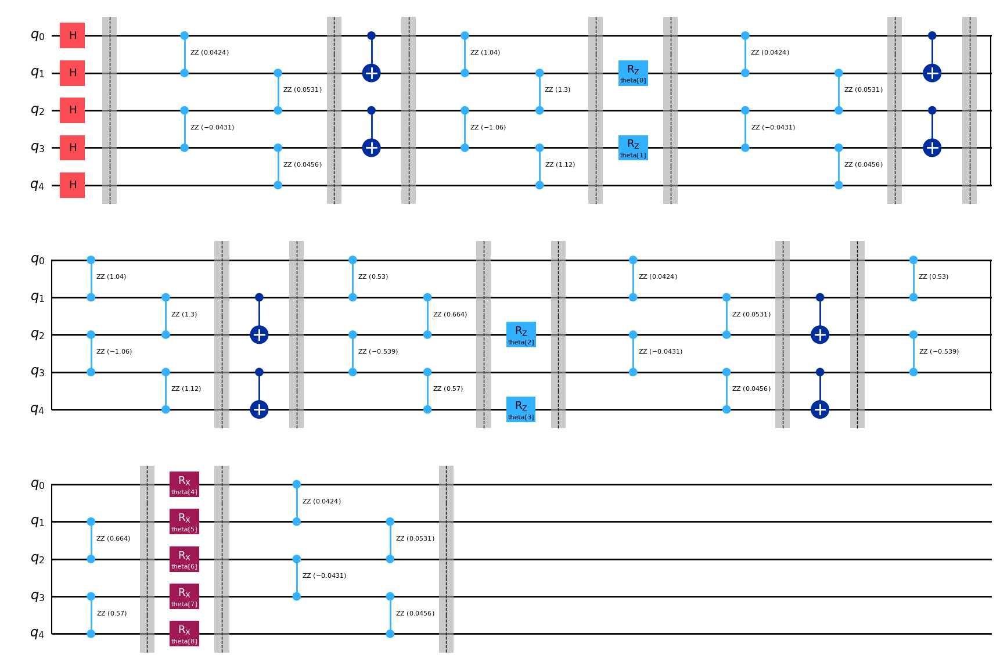

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.draw("mpl")

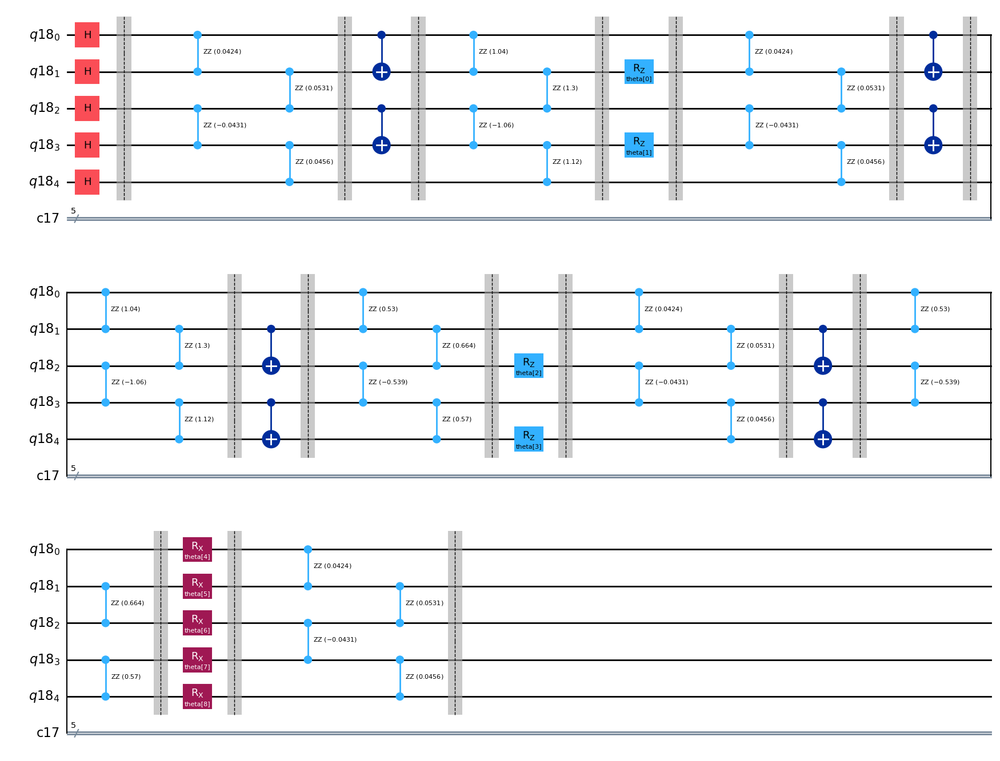

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

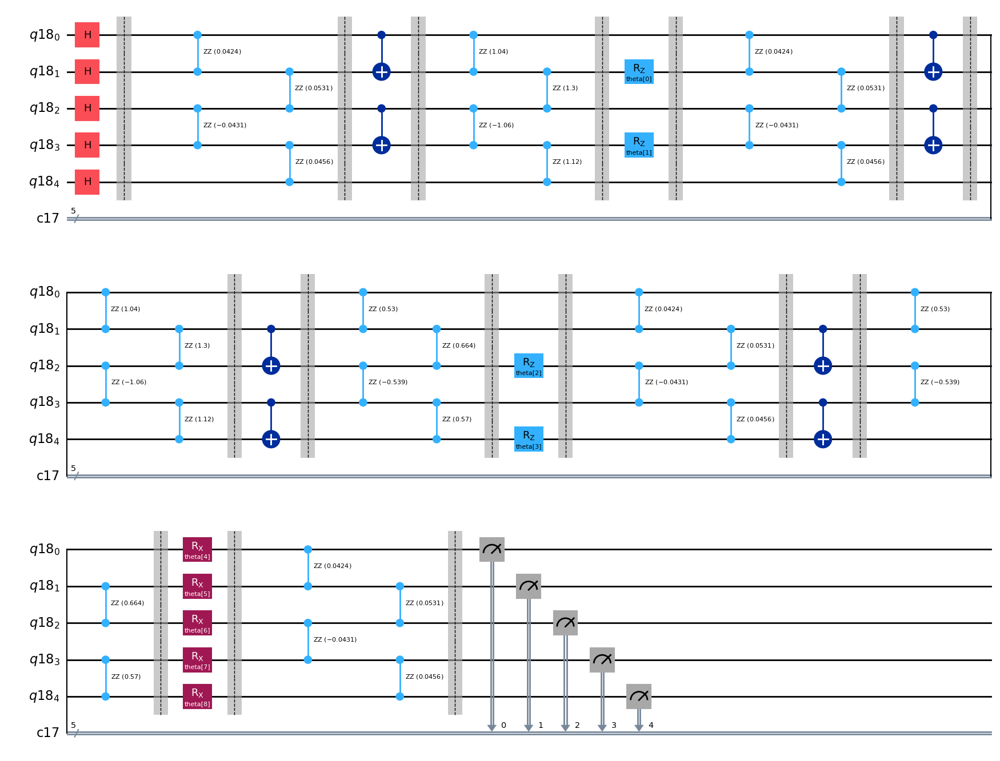

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

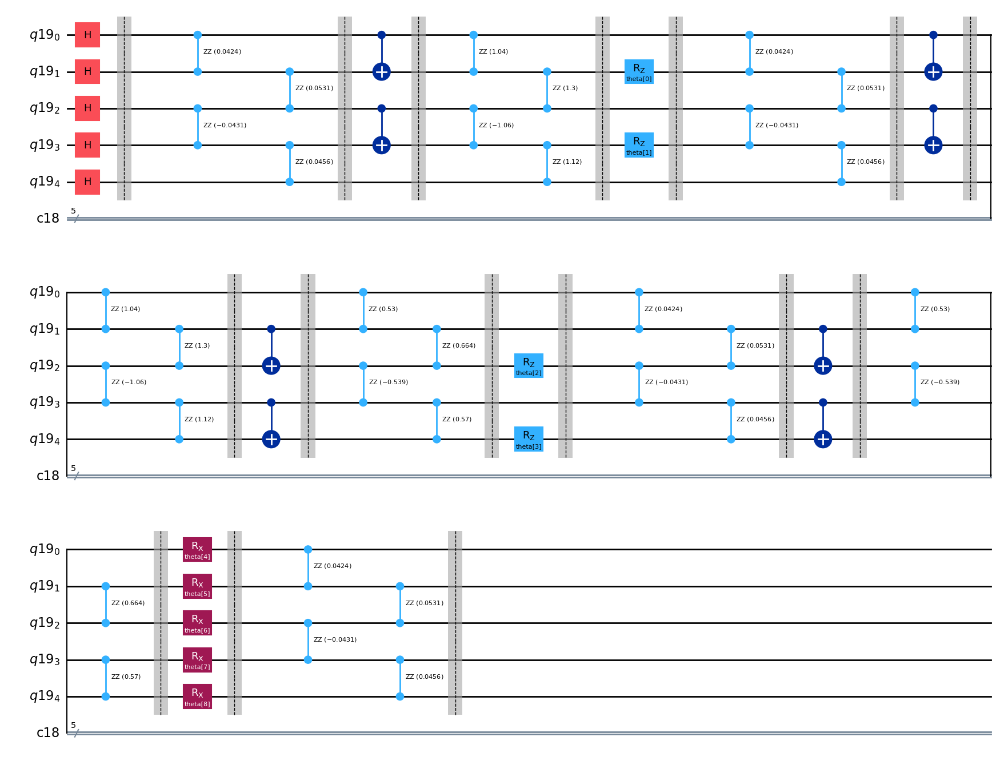

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

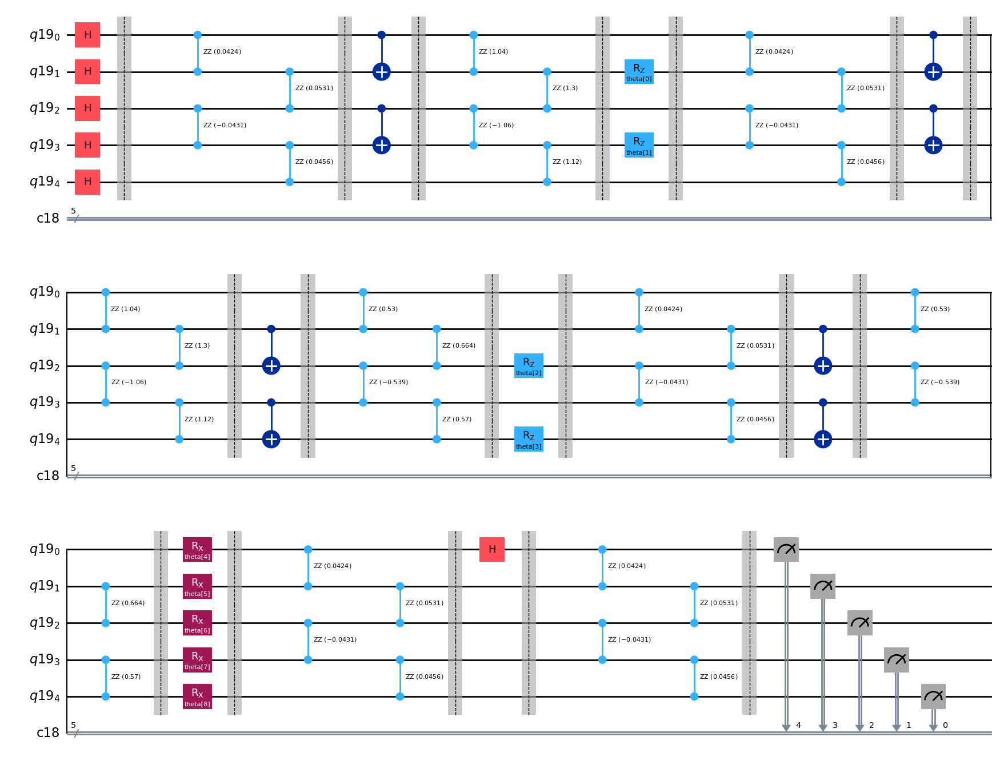

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

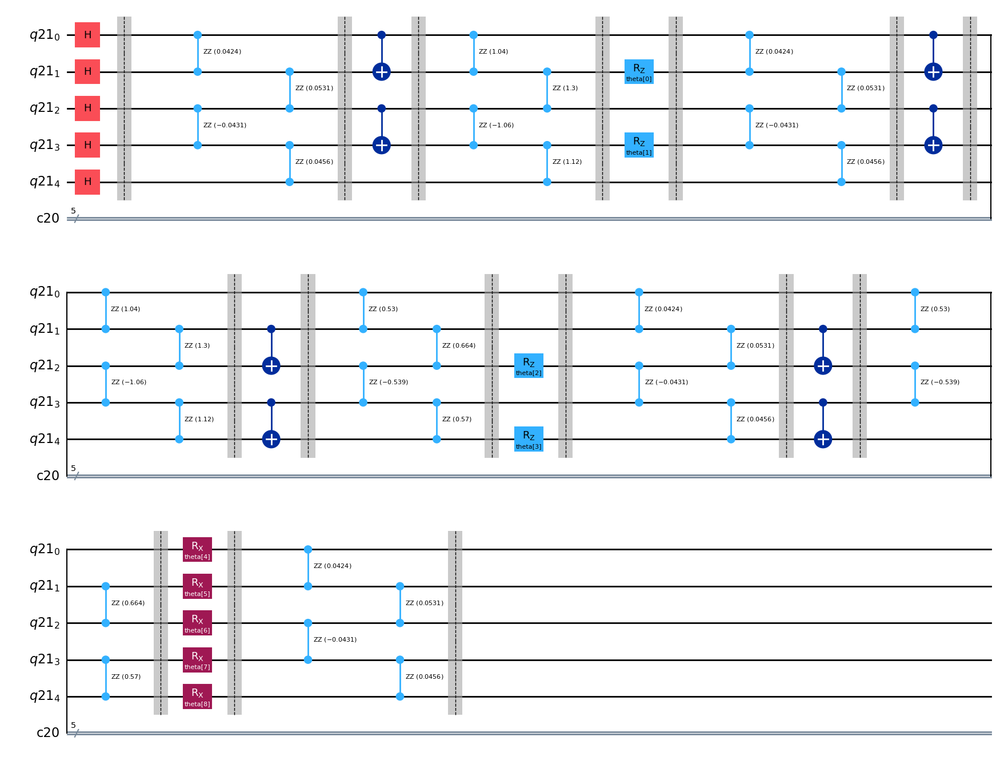

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

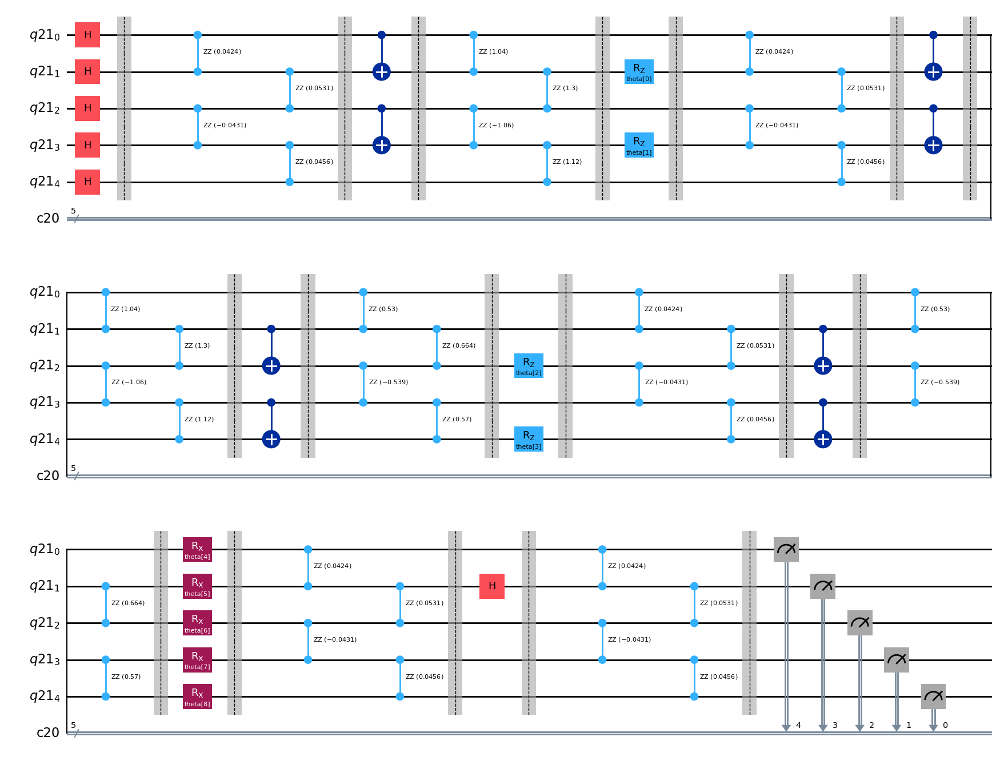

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

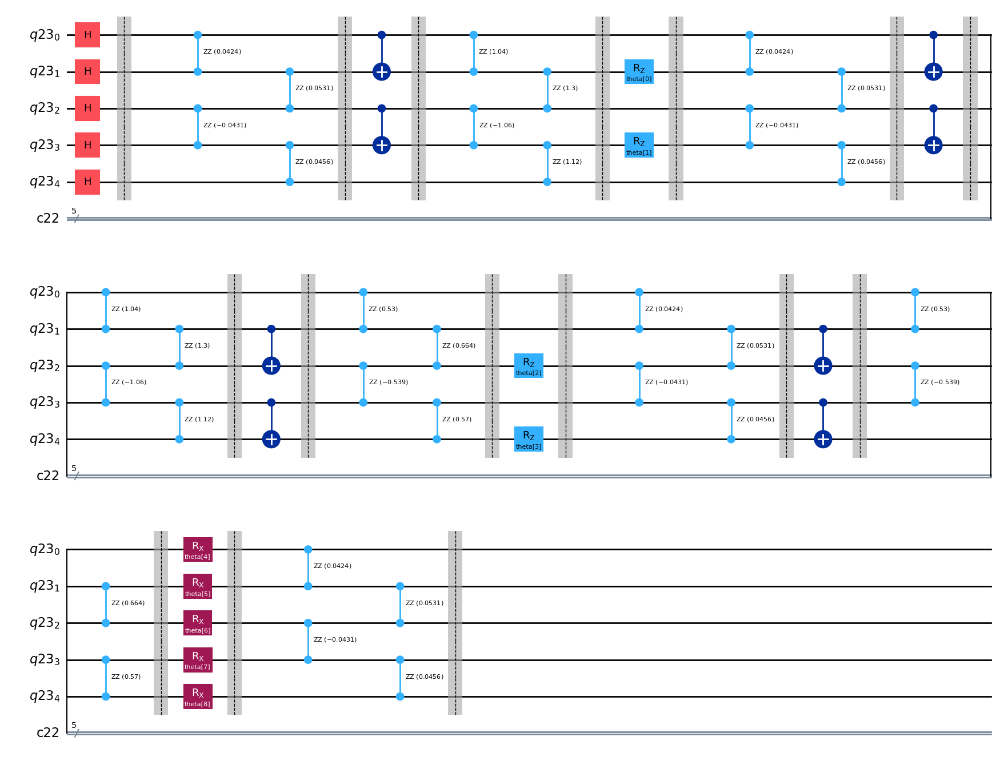

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

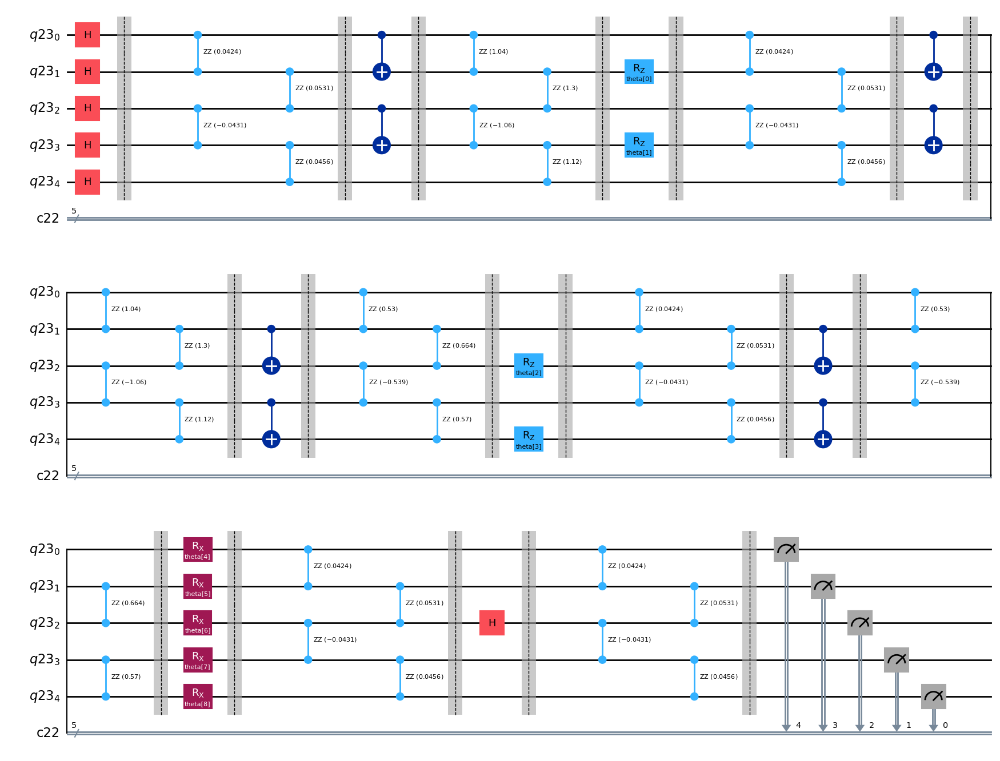

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

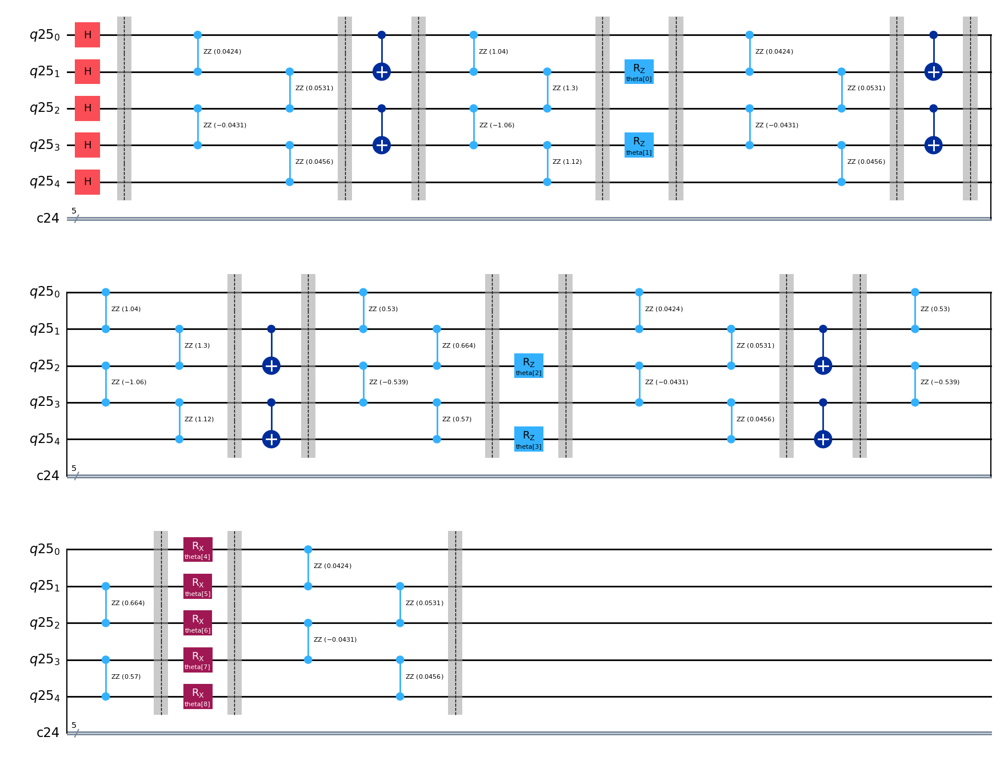

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

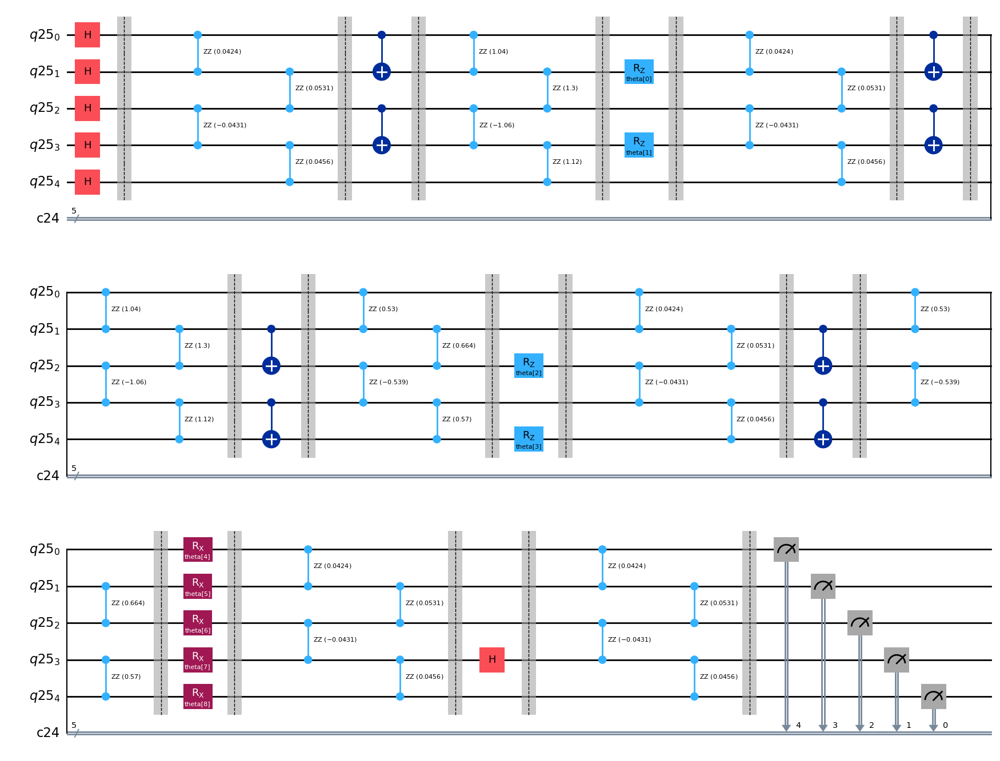

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

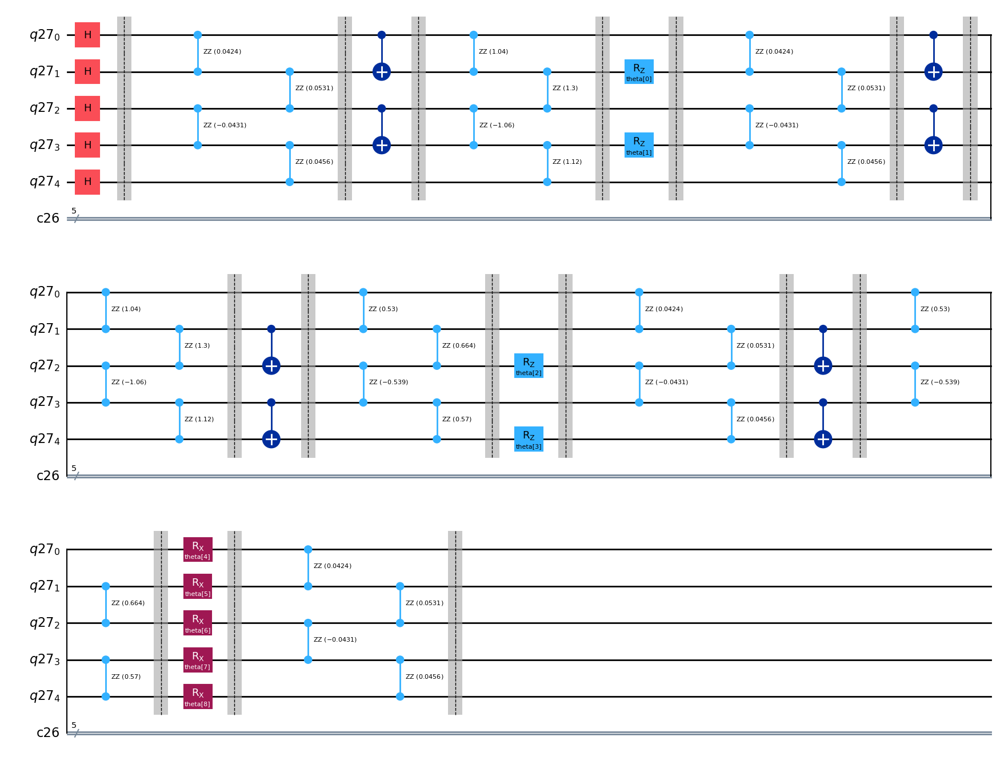

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

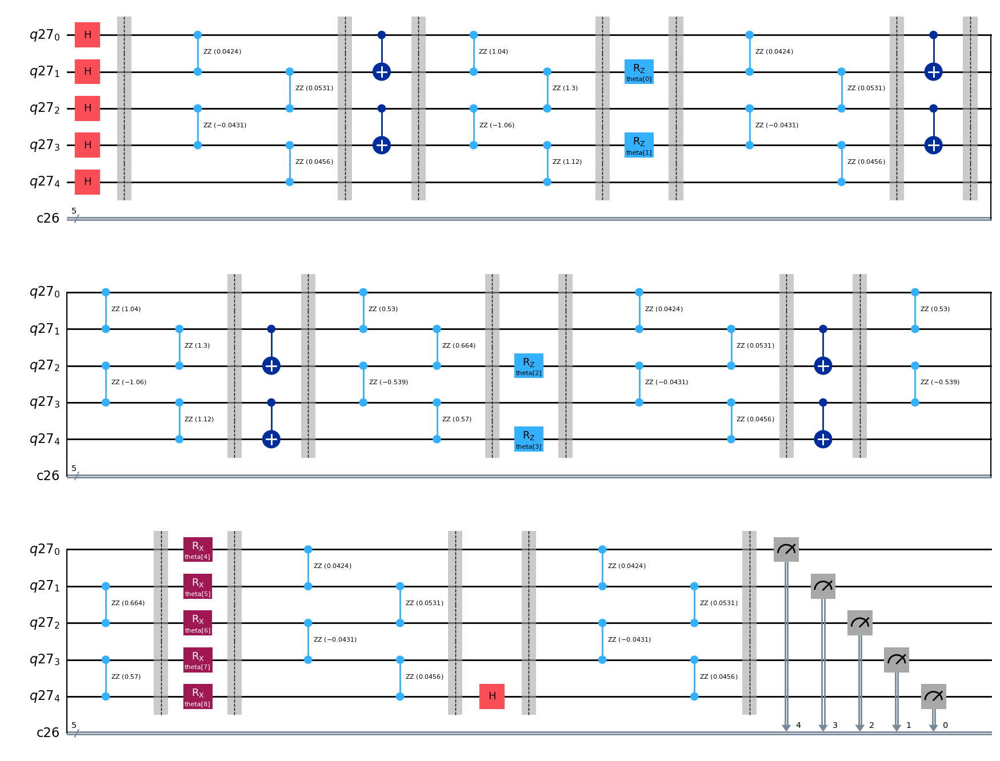

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

-2.7978
-2.7270000000000003
-2.5987999999999998
-2.6502000000000008
-2.444
-2.4370000000000003
-2.566
-2.4095999999999997
-2.6585999999999994
-2.6224000000000003
-2.5338000000000007
-2.4714
-2.8258000000000005
-2.4066
-2.6216
-2.7051999999999996
-2.7518000000000007
-2.7474000000000007
-2.0534
-2.5803999999999996


In [ ]:
lowest_energy_vqe

-2.8258000000000005

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 0개

In [ ]:
# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.7978
-2.7270000000000003
-2.5987999999999998
-2.6502000000000008
-2.444
-2.4370000000000003
-2.566
-2.4095999999999997
-2.6585999999999994
-2.6224000000000003
-2.5338000000000007
-2.4714
-2.8258000000000005
-2.4066
-2.6216
-2.7051999999999996
-2.7518000000000007
-2.7474000000000007
-2.0534
-2.5803999999999996


<ipython-input-80-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar 

         Current function value: nan
         Iterations: 39
         Function evaluations: 1120
         Gradient evaluations: 160
Optimization terminated successfully.
         Current function value: -4.548555
         Iterations: 56
         Function evaluations: 630
         Gradient evaluations: 90


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -18.151546
         Iterations: 143
         Function evaluations: 1557
         Gradient evaluations: 221


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -18.151544
         Iterations: 131
         Function evaluations: 1426
         Gradient evaluations: 202
Optimization terminated successfully.
         Current function value: -6.429606
         Iterations: 17
         Function evaluations: 161
         Gradient evaluations: 23


<ipython-input-80-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar 

         Current function value: nan
         Iterations: 28
         Function evaluations: 1036
         Gradient evaluations: 148
Optimization terminated successfully.
         Current function value: -6.303245
         Iterations: 33
         Function evaluations: 301
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: -5.774085
         Iterations: 48
         Function evaluations: 378
         Gradient evaluations: 54


<ipython-input-80-942dbc8389c9>:24: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:56: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:103: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+4]
<ipython-input-80-942dbc8389c9>:136: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]
<ipython-input-77-1f0d911e14fe>:33: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-80-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc

         Current function value: nan
         Iterations: 42
         Function evaluations: 1204
         Gradient evaluations: 172
Optimization terminated successfully.
         Current function value: -19.196477
         Iterations: 59
         Function evaluations: 483
         Gradient evaluations: 69


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.970255
         Iterations: 262
         Function evaluations: 2783
         Gradient evaluations: 396
Optimization terminated successfully.
         Current function value: -18.151548
         Iterations: 147
         Function evaluations: 1547
         Gradient evaluations: 221
Optimization terminated successfully.
         Current function value: -19.196477
         Iterations: 36
         Function evaluations: 364
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: -6.325645
         Iterations: 90
         Function evaluations: 721
         Gradient evaluations: 103


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.970259
         Iterations: 300
         Function evaluations: 2751
         Gradient evaluations: 393
Optimization terminated successfully.
         Current function value: -6.325644
         Iterations: 55
         Function evaluations: 420
         Gradient evaluations: 60
         Current function value: -7.970256
         Iterations: 300
         Function evaluations: 3108
         Gradient evaluations: 444


<ipython-input-80-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar 

         Current function value: nan
         Iterations: 24
         Function evaluations: 994
         Gradient evaluations: 142
Optimization terminated successfully.
         Current function value: -5.558937
         Iterations: 19
         Function evaluations: 168
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: -19.196476
         Iterations: 44
         Function evaluations: 399
         Gradient evaluations: 57


In [ ]:
lowest_energy_vqnhe

-19.19647655570937

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.7978
-2.7270000000000003
-2.5987999999999998
-2.6502000000000008
-2.444
-2.4370000000000003
-2.566
-2.4095999999999997
-2.6585999999999994
-2.6224000000000003
-2.5338000000000007
-2.4714
-2.8258000000000005
-2.4066
-2.6216
-2.7051999999999996
-2.7518000000000007
-2.7474000000000007
-2.0534
-2.5803999999999996


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.368256
         Iterations: 50
         Function evaluations: 5388
         Gradient evaluations: 168


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.258376
         Iterations: 102
         Function evaluations: 5708
         Gradient evaluations: 178


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -8.216377
         Iterations: 34
         Function evaluations: 2284
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: -6.642613
         Iterations: 62
         Function evaluations: 3072
         Gradient evaluations: 96


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.997067
         Iterations: 195
         Function evaluations: 9856
         Gradient evaluations: 308


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.677005
         Iterations: 88
         Function evaluations: 7012
         Gradient evaluations: 219


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.358553
         Iterations: 76
         Function evaluations: 3872
         Gradient evaluations: 121


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -18.353192
         Iterations: 290
         Function evaluations: 16480
         Gradient evaluations: 515


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.600007
         Iterations: 115
         Function evaluations: 5184
         Gradient evaluations: 162


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -17.312158
         Iterations: 54
         Function evaluations: 3178
         Gradient evaluations: 99


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -8.376358
         Iterations: 157
         Function evaluations: 8896
         Gradient evaluations: 278


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.278588
         Iterations: 111
         Function evaluations: 6728
         Gradient evaluations: 210


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -18.220696
         Iterations: 46
         Function evaluations: 4487
         Gradient evaluations: 140


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.354159
         Iterations: 123
         Function evaluations: 9383
         Gradient evaluations: 293


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.638839
         Iterations: 70
         Function evaluations: 5192
         Gradient evaluations: 162


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -17.346346
         Iterations: 67
         Function evaluations: 4812
         Gradient evaluations: 150


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.777378
         Iterations: 182
         Function evaluations: 11243
         Gradient evaluations: 351


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.983560
         Iterations: 60
         Function evaluations: 4679
         Gradient evaluations: 146


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.338278
         Iterations: 67
         Function evaluations: 5132
         Gradient evaluations: 160
         Current function value: -19.463727
         Iterations: 194
         Function evaluations: 12684
         Gradient evaluations: 396


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-19.463727490606924

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.7978
-2.7270000000000003
-2.5987999999999998
-2.6502000000000008
-2.444
-2.4370000000000003
-2.566
-2.4095999999999997
-2.6585999999999994
-2.6224000000000003
-2.5338000000000007
-2.4714
-2.8258000000000005
-2.4066
-2.6216
-2.7051999999999996
-2.7518000000000007
-2.7474000000000007
-2.0534
-2.5803999999999996


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -18.715368
         Iterations: 120
         Function evaluations: 25491
         Gradient evaluations: 447


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.877729
         Iterations: 99
         Function evaluations: 10044
         Gradient evaluations: 176


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.244469
         Iterations: 80
         Function evaluations: 7752
         Gradient evaluations: 136


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -10.725337
         Iterations: 66
         Function evaluations: 12267
         Gradient evaluations: 215
Optimization terminated successfully.
         Current function value: -4.403628
         Iterations: 5
         Function evaluations: 2166
         Gradient evaluations: 38


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -17.748446
         Iterations: 88
         Function evaluations: 11575
         Gradient evaluations: 203


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.792156
         Iterations: 118
         Function evaluations: 11070
         Gradient evaluations: 194


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -17.408358
         Iterations: 61
         Function evaluations: 11919
         Gradient evaluations: 209


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.305422
         Iterations: 41
         Function evaluations: 7422
         Gradient evaluations: 130


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.312070
         Iterations: 45
         Function evaluations: 5769
         Gradient evaluations: 101


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.985416
         Iterations: 291
         Function evaluations: 31813
         Gradient evaluations: 558
Optimization terminated successfully.
         Current function value: -9.512333
         Iterations: 30
         Function evaluations: 4047
         Gradient evaluations: 71


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.194675
         Iterations: 71
         Function evaluations: 7365
         Gradient evaluations: 129


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.047114
         Iterations: 18
         Function evaluations: 9979
         Gradient evaluations: 175


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.487535
         Iterations: 46
         Function evaluations: 7991
         Gradient evaluations: 140


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.650687
         Iterations: 45
         Function evaluations: 5767
         Gradient evaluations: 101


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.463727
         Iterations: 167
         Function evaluations: 16074
         Gradient evaluations: 282


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -16.278063
         Iterations: 23
         Function evaluations: 8445
         Gradient evaluations: 148


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.828217
         Iterations: 35
         Function evaluations: 7422
         Gradient evaluations: 130
         Current function value: -18.353194
         Iterations: 101
         Function evaluations: 13521
         Gradient evaluations: 237


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-19.46372693691122

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=25), pqc))
    if cost_func_vqnhe(np.zeros(shape=25), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=25), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(25) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.7978
-2.7270000000000003
-2.5987999999999998
-2.6502000000000008
-2.444
-2.4370000000000003
-2.566
-2.4095999999999997
-2.6585999999999994
-2.6224000000000003
-2.5338000000000007
-2.4714
-2.8258000000000005
-2.4066
-2.6216
-2.7051999999999996
-2.7518000000000007
-2.7474000000000007
-2.0534
-2.5803999999999996


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.701876
         Iterations: 79
         Function evaluations: 4949
         Gradient evaluations: 190


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.508883
         Iterations: 31
         Function evaluations: 2997
         Gradient evaluations: 115
Optimization terminated successfully.
         Current function value: -3.839522
         Iterations: 144
         Function evaluations: 5304
         Gradient evaluations: 204


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.327670
         Iterations: 14
         Function evaluations: 4010
         Gradient evaluations: 154
Optimization terminated successfully.
         Current function value: -2.842421
         Iterations: 15
         Function evaluations: 416
         Gradient evaluations: 16
Optimization terminated successfully.
         Current function value: -3.632891
         Iterations: 27
         Function evaluations: 884
         Gradient evaluations: 34


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.840063
         Iterations: 39
         Function evaluations: 1716
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: -2.842421
         Iterations: 14
         Function evaluations: 390
         Gradient evaluations: 15


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.828911
         Iterations: 9
         Function evaluations: 2170
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: -4.507757
         Iterations: 96
         Function evaluations: 3588
         Gradient evaluations: 138


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.517616
         Iterations: 13
         Function evaluations: 2372
         Gradient evaluations: 91


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.297136
         Iterations: 42
         Function evaluations: 3566
         Gradient evaluations: 137
Optimization terminated successfully.
         Current function value: -3.839522
         Iterations: 45
         Function evaluations: 3016
         Gradient evaluations: 116
Optimization terminated successfully.
         Current function value: -2.842421
         Iterations: 13
         Function evaluations: 364
         Gradient evaluations: 14


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.827060
         Iterations: 71
         Function evaluations: 2548
         Gradient evaluations: 98


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.521371
         Iterations: 14
         Function evaluations: 2137
         Gradient evaluations: 82


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.378006
         Iterations: 71
         Function evaluations: 5105
         Gradient evaluations: 196


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.893225
         Iterations: 99
         Function evaluations: 4451
         Gradient evaluations: 171
Optimization terminated successfully.
         Current function value: -3.297074
         Iterations: 32
         Function evaluations: 1560
         Gradient evaluations: 60
         Current function value: -5.094554
         Iterations: 155
         Function evaluations: 9103
         Gradient evaluations: 350


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-6.827060304806946

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.7978
-2.7270000000000003
-2.5987999999999998
-2.6502000000000008
-2.444
-2.4370000000000003
-2.566
-2.4095999999999997
-2.6585999999999994
-2.6224000000000003
-2.5338000000000007
-2.4714
-2.8258000000000005
-2.4066
-2.6216
-2.7051999999999996
-2.7518000000000007
-2.7474000000000007
-2.0534
-2.5803999999999996


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.582849
         Iterations: 118
         Function evaluations: 15852
         Gradient evaluations: 288
Optimization terminated successfully.
         Current function value: -4.955159
         Iterations: 31
         Function evaluations: 2860
         Gradient evaluations: 52


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.306454
         Iterations: 4
         Function evaluations: 3807
         Gradient evaluations: 69


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.364500
         Iterations: 19
         Function evaluations: 5006
         Gradient evaluations: 91
Optimization terminated successfully.
         Current function value: -2.842421
         Iterations: 11
         Function evaluations: 660
         Gradient evaluations: 12


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.313288
         Iterations: 65
         Function evaluations: 9582
         Gradient evaluations: 174
Optimization terminated successfully.
         Current function value: -3.711059
         Iterations: 27
         Function evaluations: 1705
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: -4.380335
         Iterations: 38
         Function evaluations: 3520
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: -2.825800
         Iterations: 1
         Function evaluations: 110
         Gradient evaluations: 2


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.377667
         Iterations: 81
         Function evaluations: 15247
         Gradient evaluations: 277


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.943461
         Iterations: 85
         Function evaluations: 8042
         Gradient evaluations: 146
Optimization terminated successfully.
         Current function value: -3.266402
         Iterations: 49
         Function evaluations: 4235
         Gradient evaluations: 77


In [ ]:
lowest_energy_vqnhe

## ZZ Crosstalk, Shots = 10000

CUSCO 0 1 2 3 4

J = 6MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 0 1 2 3 4

J = 6MHz

In [ ]:
# Qubit Number 0,1,2,3,4

J = 0.006                                                   # Unit : GHz
freq = [5.015, 4.956, 4.807, 5.232, 5.138]                  # Unit : GHz
anharm = [-0.30739, -0.30775, -0.31038, -0.30373, -0.3054]  # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_01 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_12 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[2]+anharm[2], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[2]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_23 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

In [ ]:
crosstalk_freq_01, crosstalk_freq_12, crosstalk_freq_23, crosstalk_freq_34

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 940
gate_34 = 460

gate_single = 40

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

In [ ]:
lowest_energy_vqe

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 0개

In [ ]:
# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=25), pqc))
    if cost_func_vqnhe(np.zeros(shape=25), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=25), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(25) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

## ZZ Crosstalk, Shots = 10000

CUSCO 0 1 2 3 4

J = 7MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 0 1 2 3 4

J = 7MHz

In [ ]:
# Qubit Number 0,1,2,3,4

J = 0.007                                                   # Unit : GHz
freq = [5.015, 4.956, 4.807, 5.232, 5.138]                  # Unit : GHz
anharm = [-0.30739, -0.30775, -0.31038, -0.30373, -0.3054]  # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_01 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_12 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[2]+anharm[2], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[2]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_23 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

In [ ]:
crosstalk_freq_01, crosstalk_freq_12, crosstalk_freq_23, crosstalk_freq_34

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 940
gate_34 = 460

gate_single = 40

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

In [ ]:
lowest_energy_vqe

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 0개

In [ ]:
# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=25), pqc))
    if cost_func_vqnhe(np.zeros(shape=25), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=25), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(25) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

## ZZ Crosstalk, Shots = 10000

CUSCO 0 1 2 3 4

J = 8MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 0 1 2 3 4

J = 8MHz

In [ ]:
# Qubit Number 0,1,2,3,4

J = 0.008                                                   # Unit : GHz
freq = [5.015, 4.956, 4.807, 5.232, 5.138]                  # Unit : GHz
anharm = [-0.30739, -0.30775, -0.31038, -0.30373, -0.3054]  # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_01 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_12 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[2]+anharm[2], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[2]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_23 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

In [ ]:
crosstalk_freq_01, crosstalk_freq_12, crosstalk_freq_23, crosstalk_freq_34

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 940
gate_34 = 460

gate_single = 40

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

In [ ]:
lowest_energy_vqe

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 0개

In [ ]:
# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=25), pqc))
    if cost_func_vqnhe(np.zeros(shape=25), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=25), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(25) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

# 7. CNN Estimation - ZZ Crosstalk (CUSCO 3 4 5 15 22)

## ZZ Crosstalk, Shots = 10000

CUSCO 3 4 5 15 22

J = 1MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 3 4 5 15 22

J = 1MHz

In [ ]:
# Qubit Number 3,4,5,15,22

J = 0.001                                                   # Unit : GHz
freq = [5.232, 5.138, 4.988, 5.015, 5.282]                  # Unit : GHz
anharm = [-0.30373, -0.3054, -0.30755, -0.30699, -0.303]    # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_45 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[2]+anharm[2], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[2]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_415 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_1522 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

[5.23201064 5.13798936]
[10.16026046 10.37001454  9.97059499]
1.4542737942768724e-05
[5.13800667 4.98799333]
[ 9.97058713 10.12601724  9.66844563]
1.723952758059255e-05
[4.98796301 5.01503699]
[ 9.66844402 10.00301312  9.72300286]
1.3120722719861533e-05
[5.01499625 5.28200375]
[ 9.72300652 10.29705895 10.26094454]
5.8948757417631725e-05


In [ ]:
crosstalk_freq_34, crosstalk_freq_45, crosstalk_freq_415, crosstalk_freq_1522

(7.271368971384362e-06,
 8.619763790296275e-06,
 6.560361359930766e-06,
 2.9474378708815863e-05)

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 460
gate_34 = 460

gate_single = 40

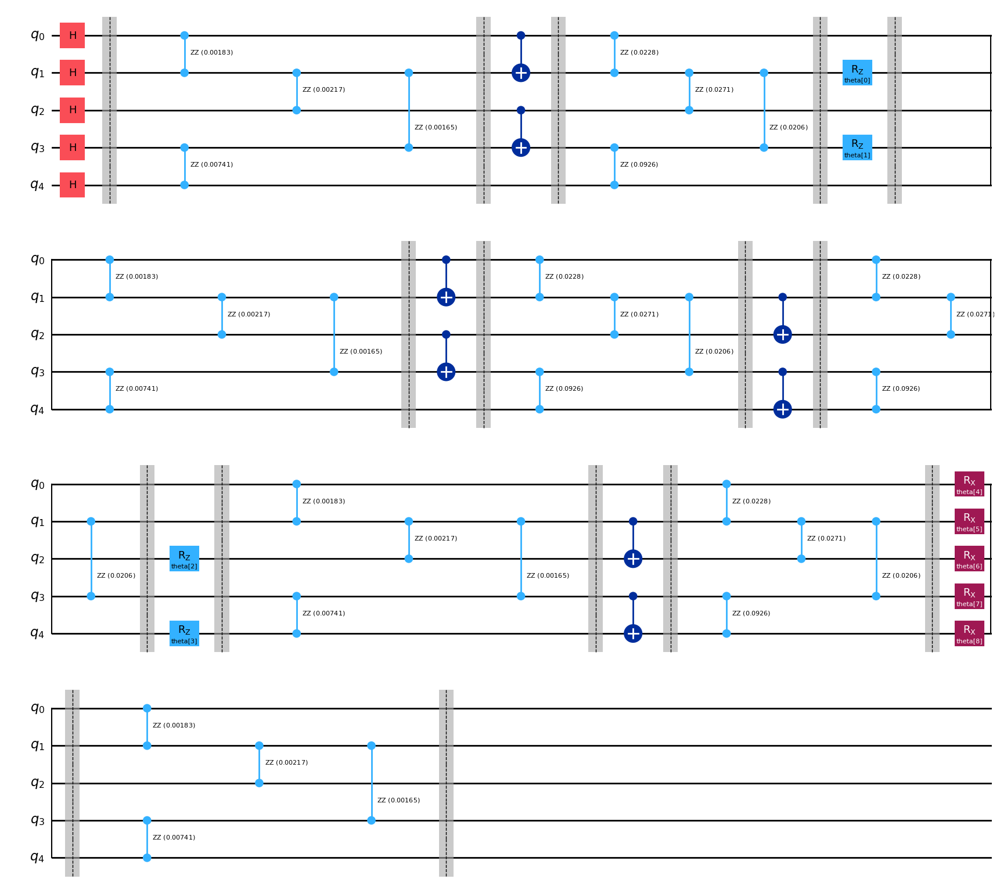

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.draw("mpl")

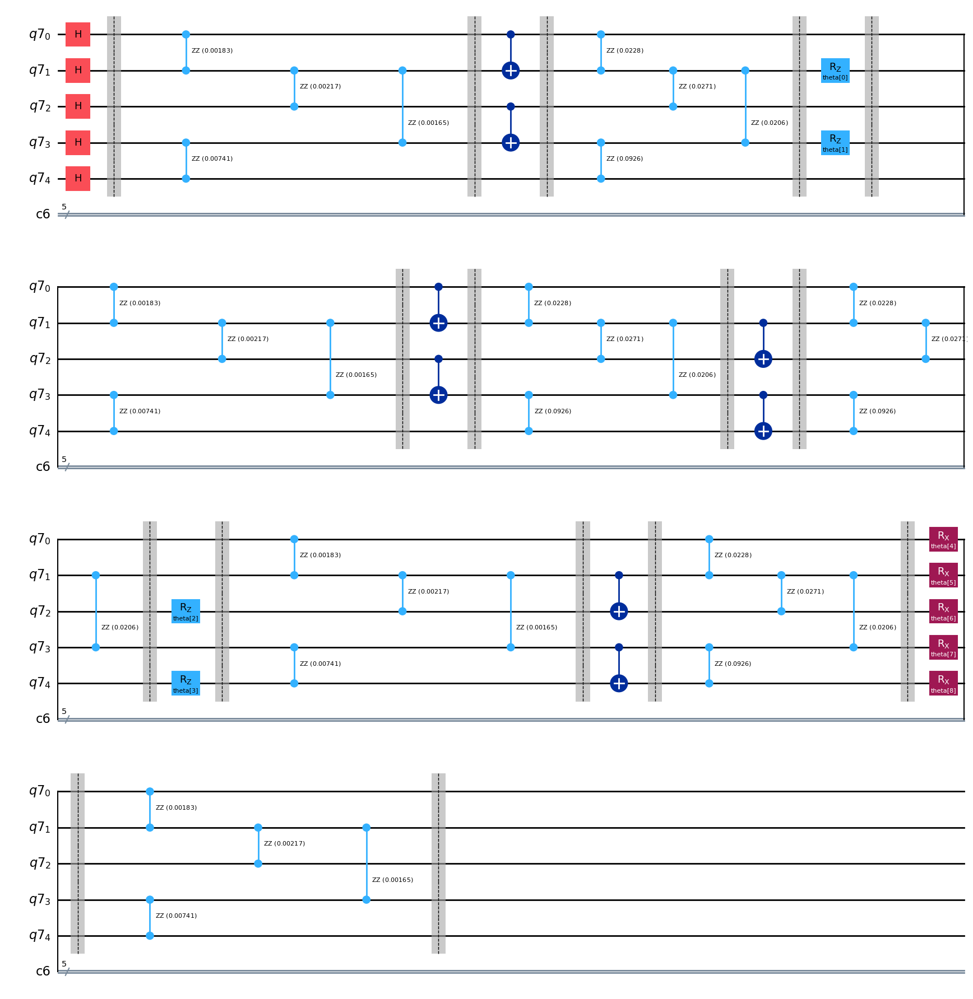

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

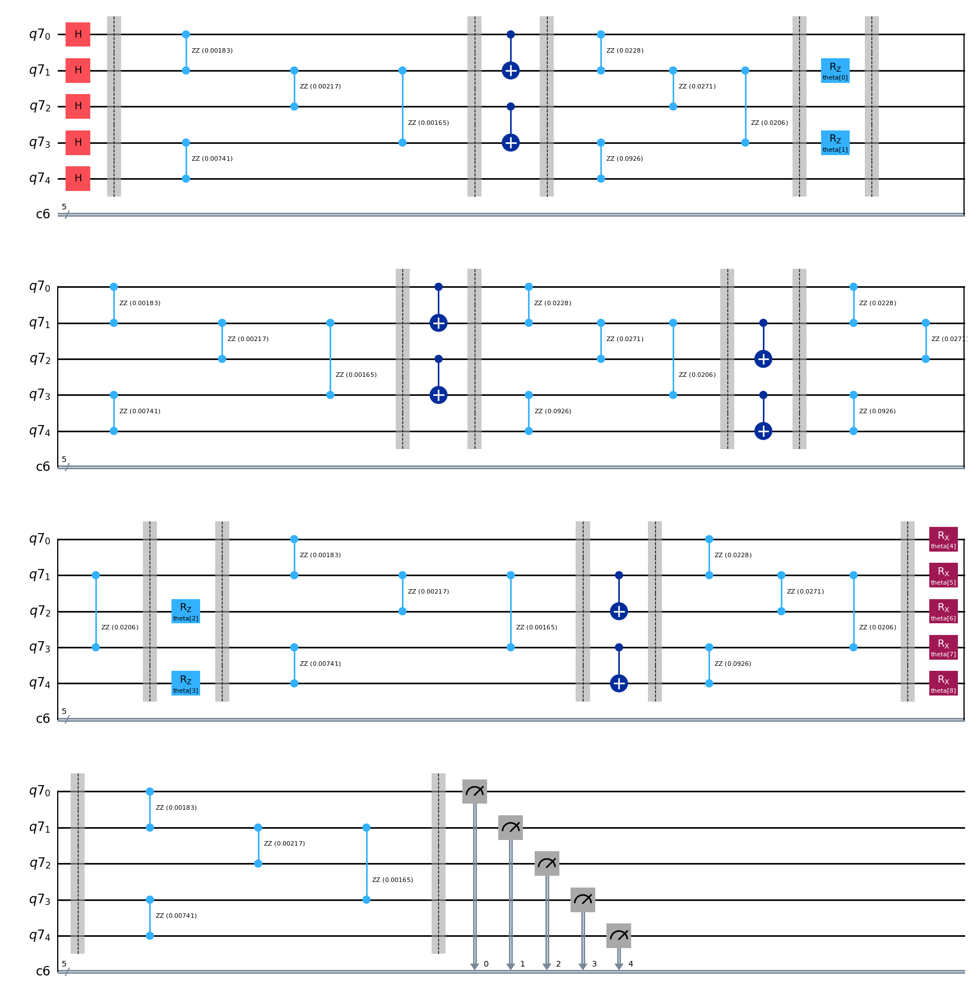

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

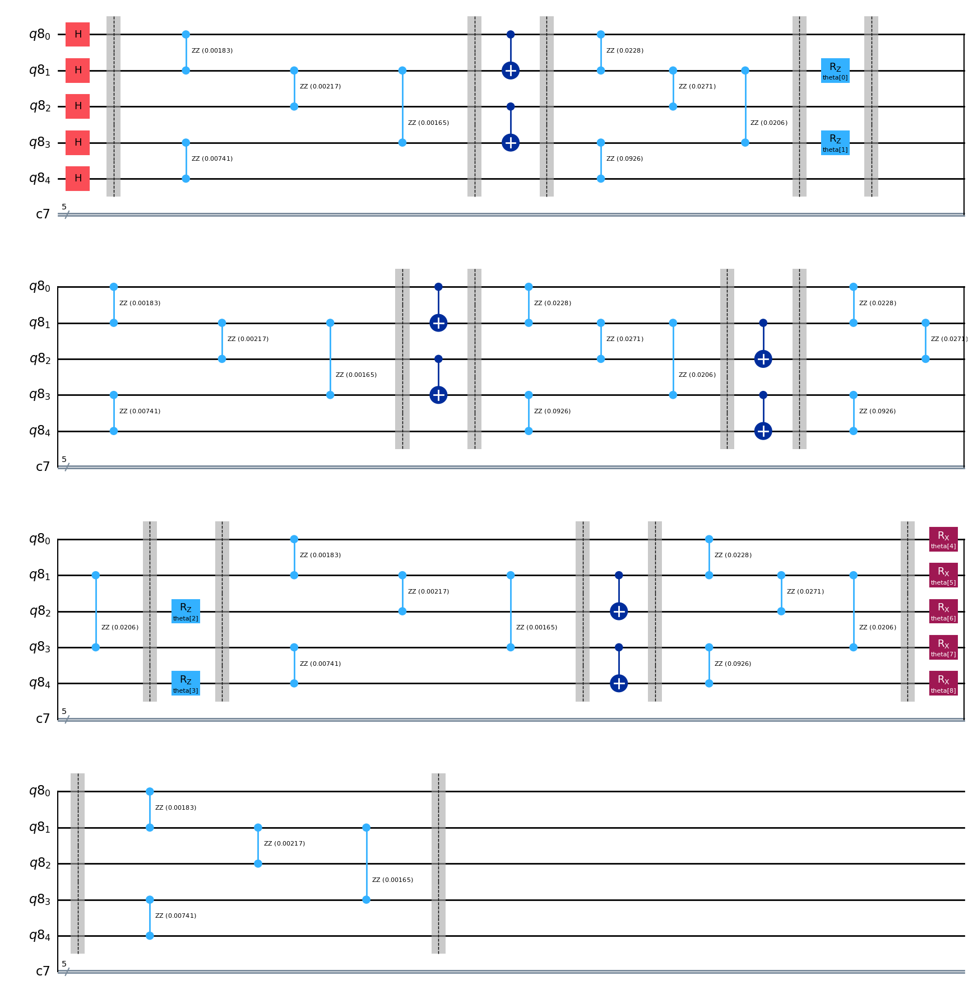

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

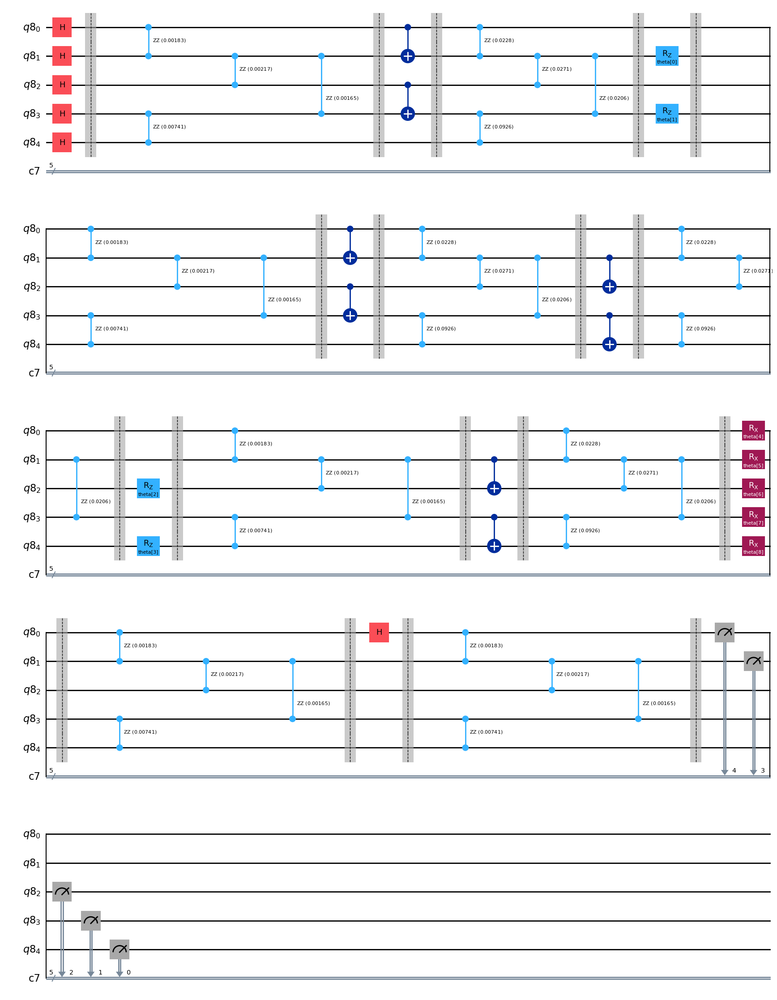

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

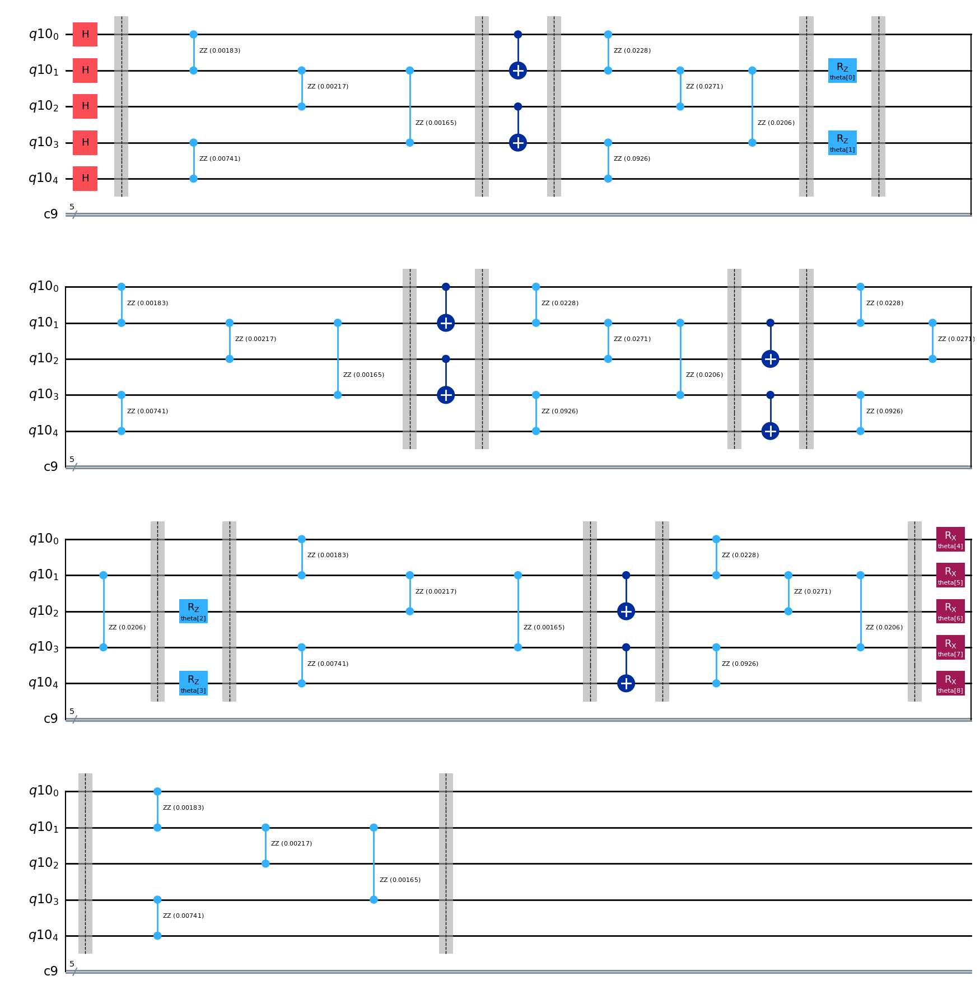

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

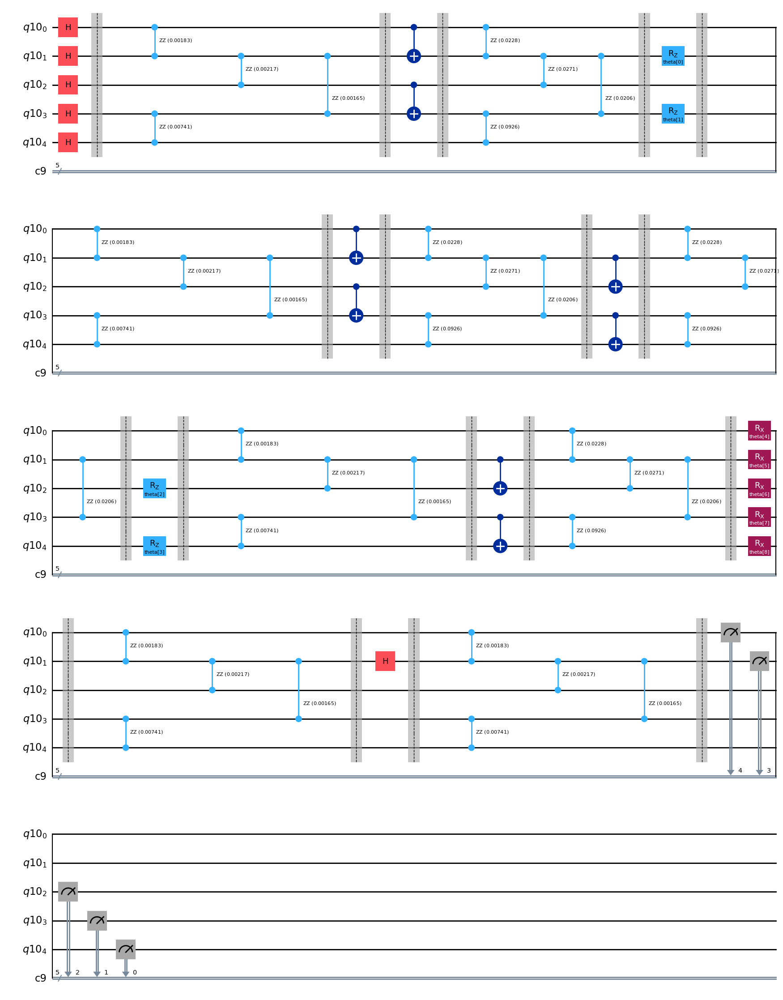

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

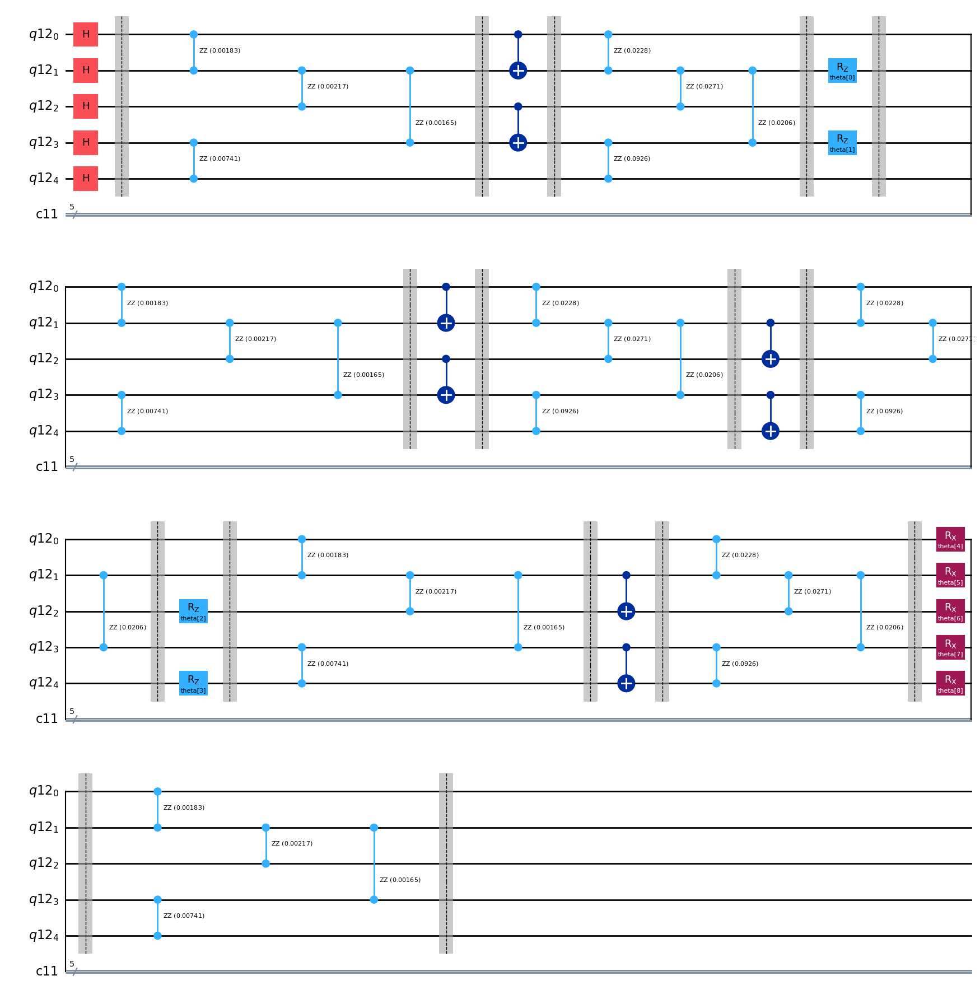

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

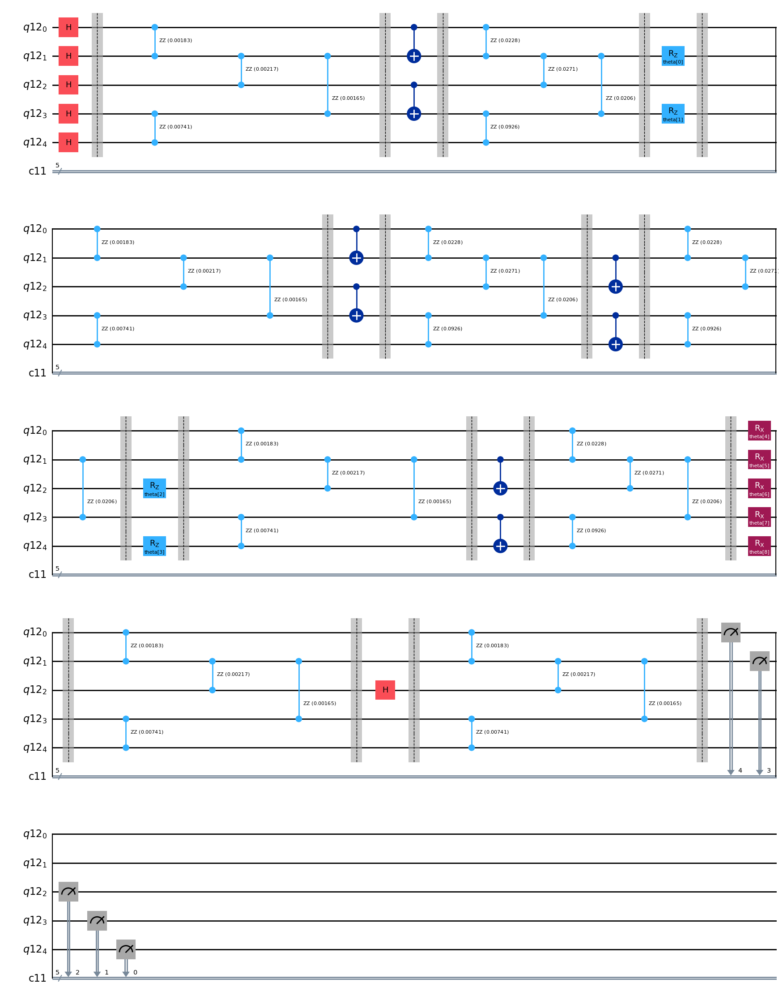

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

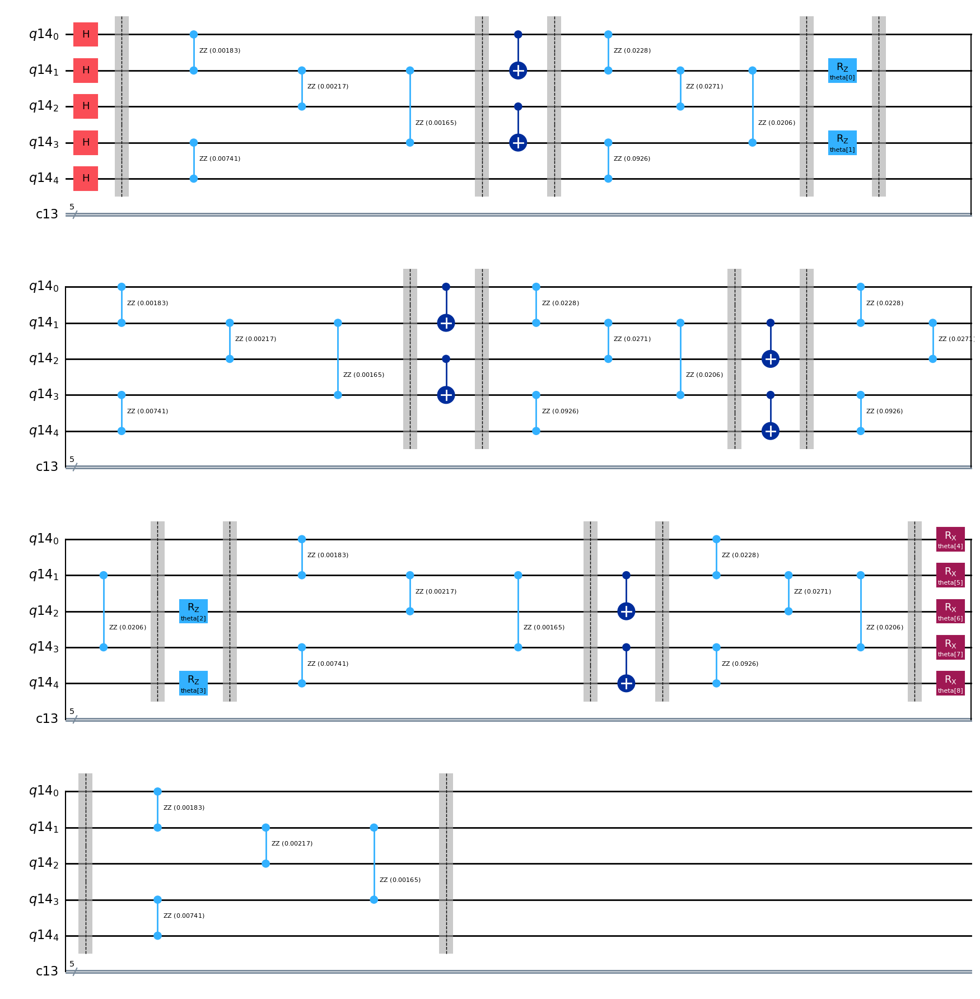

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

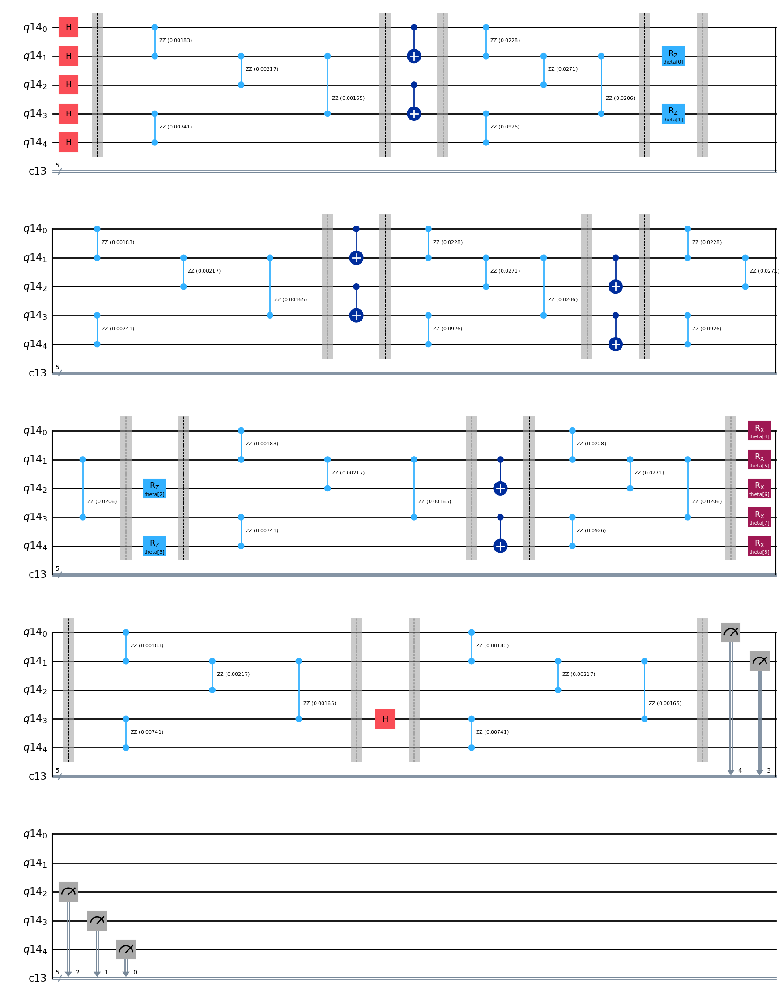

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

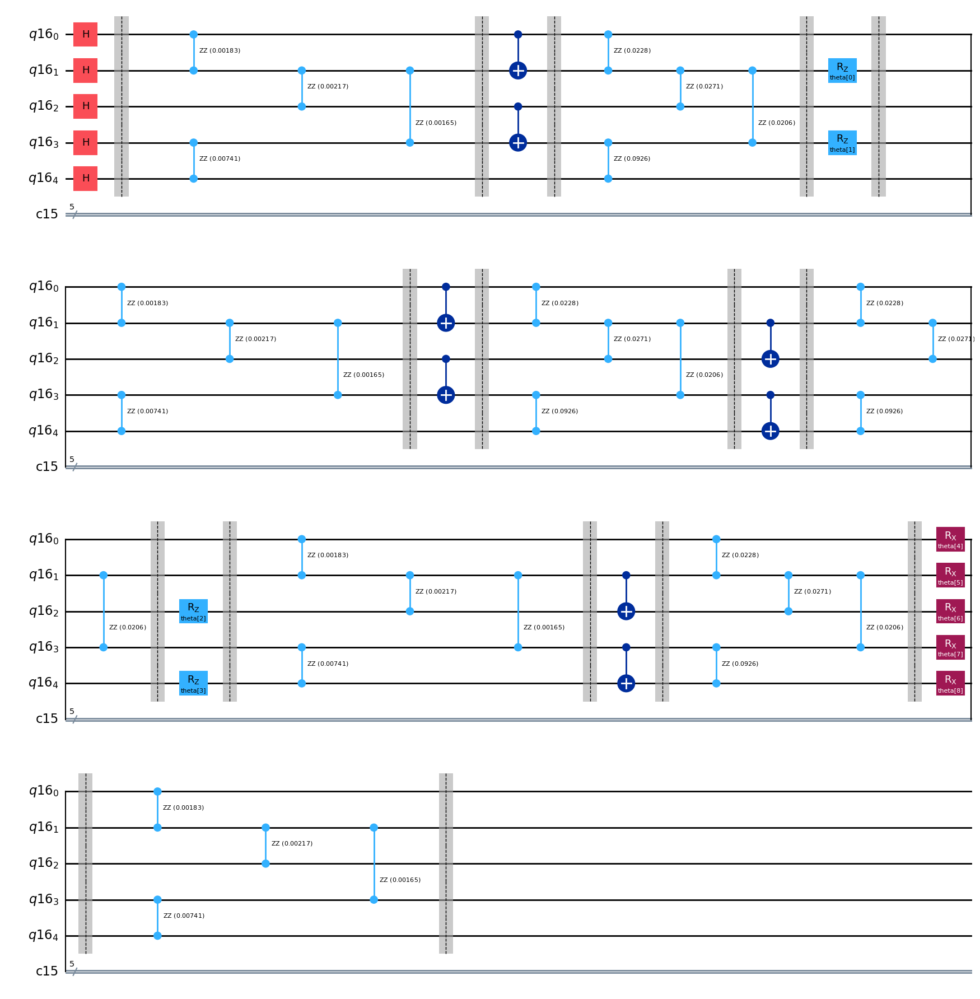

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

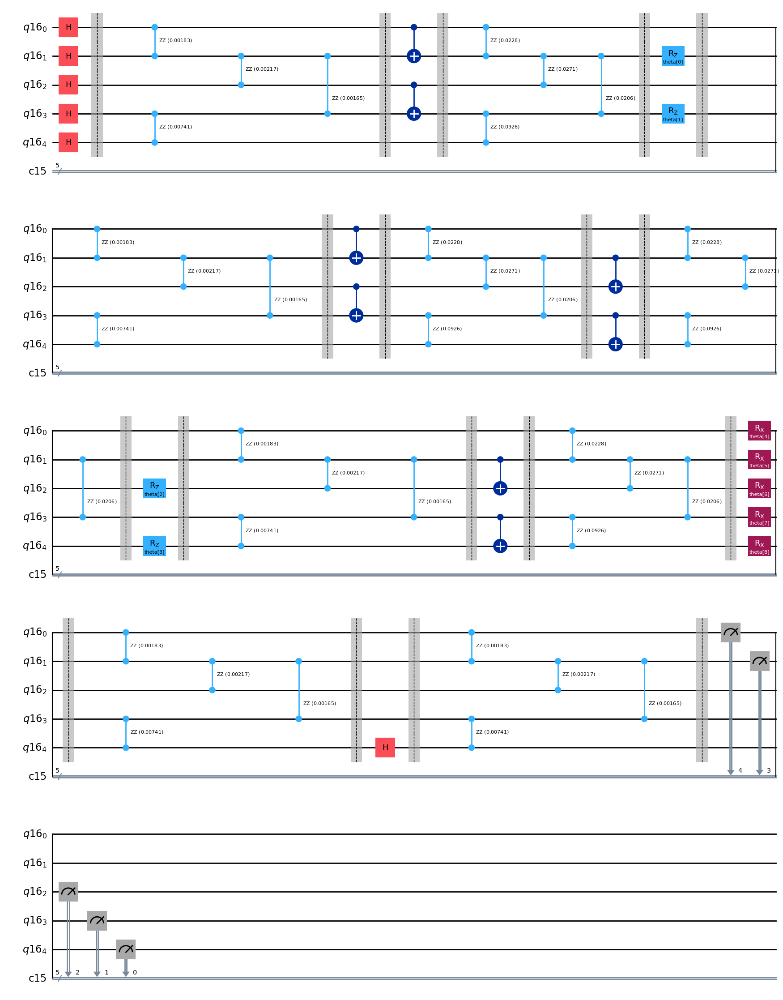

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

-3.536400000000001
-5.6408000000000005
-3.5378000000000003
-3.4834
-5.847399999999999
-5.8108
-5.792400000000001
-5.819799999999998
-5.8522
-3.5445999999999995
-5.7436
-5.830999999999998
-5.697399999999999
-5.8416000000000015
-5.814200000000001
-5.8435999999999995
-3.480200000000001
-5.821199999999999
-5.793200000000001
-5.715800000000001


In [ ]:
lowest_energy_vqe

-5.8522

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 0개

In [ ]:
# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.536400000000001
-5.6408000000000005
-3.5378000000000003
-3.4834
-5.847399999999999
-5.8108
-5.792400000000001
-5.819799999999998
-5.8522
-3.5445999999999995
-5.7436
-5.830999999999998
-5.697399999999999
-5.8416000000000015
-5.814200000000001
-5.8435999999999995
-3.480200000000001
-5.821199999999999
-5.793200000000001
-5.715800000000001
Optimization terminated successfully.
         Current function value: -6.219820
         Iterations: 227
         Function evaluations: 2037
         Gradient evaluations: 291
Optimization terminated successfully.
         Current function value: -6.219821
         Iterations: 238
         Function evaluations: 2142
         Gradient evaluations: 306


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.219821
         Iterations: 300
         Function evaluations: 3010
         Gradient evaluations: 430


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.219820
         Iterations: 221
         Function evaluations: 2142
         Gradient evaluations: 306
Optimization terminated successfully.
         Current function value: -6.219819
         Iterations: 219
         Function evaluations: 2037
         Gradient evaluations: 291
Optimization terminated successfully.
         Current function value: -6.219820
         Iterations: 206
         Function evaluations: 2037
         Gradient evaluations: 291


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.219821
         Iterations: 209
         Function evaluations: 2301
         Gradient evaluations: 327


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.219819
         Iterations: 208
         Function evaluations: 1974
         Gradient evaluations: 282


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.219820
         Iterations: 228
         Function evaluations: 2434
         Gradient evaluations: 346
Optimization terminated successfully.
         Current function value: -6.219821
         Iterations: 216
         Function evaluations: 2184
         Gradient evaluations: 312


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.219819
         Iterations: 188
         Function evaluations: 1911
         Gradient evaluations: 273


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.219820
         Iterations: 217
         Function evaluations: 2210
         Gradient evaluations: 314
Optimization terminated successfully.
         Current function value: -6.219819
         Iterations: 246
         Function evaluations: 2555
         Gradient evaluations: 365


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.219820
         Iterations: 180
         Function evaluations: 1825
         Gradient evaluations: 259


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.219821
         Iterations: 217
         Function evaluations: 2100
         Gradient evaluations: 300


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.219820
         Iterations: 197
         Function evaluations: 1876
         Gradient evaluations: 268


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.219820
         Iterations: 220
         Function evaluations: 2142
         Gradient evaluations: 306


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.219819
         Iterations: 166
         Function evaluations: 1839
         Gradient evaluations: 261
Optimization terminated successfully.
         Current function value: -6.219820
         Iterations: 211
         Function evaluations: 2037
         Gradient evaluations: 291
         Current function value: -6.219819
         Iterations: 170
         Function evaluations: 1832
         Gradient evaluations: 260


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-6.21982082354652

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.536400000000001
-5.6408000000000005
-3.5378000000000003
-3.4834
-5.847399999999999
-5.8108
-5.792400000000001
-5.819799999999998
-5.8522
-3.5445999999999995
-5.7436
-5.830999999999998
-5.697399999999999
-5.8416000000000015
-5.814200000000001
-5.8435999999999995
-3.480200000000001
-5.821199999999999
-5.793200000000001
-5.715800000000001


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.464399
         Iterations: 160
         Function evaluations: 7339
         Gradient evaluations: 229


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.331131
         Iterations: 300
         Function evaluations: 12224
         Gradient evaluations: 382


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.434555
         Iterations: 187
         Function evaluations: 9986
         Gradient evaluations: 312


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.427552
         Iterations: 98
         Function evaluations: 6217
         Gradient evaluations: 194


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.462363
         Iterations: 300
         Function evaluations: 11360
         Gradient evaluations: 355


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.460613
         Iterations: 248
         Function evaluations: 12775
         Gradient evaluations: 399


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.381331
         Iterations: 300
         Function evaluations: 12512
         Gradient evaluations: 391


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.383828
         Iterations: 237
         Function evaluations: 11725
         Gradient evaluations: 366


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.457546
         Iterations: 300
         Function evaluations: 11104
         Gradient evaluations: 347
         Current function value: -6.456362
         Iterations: 300
         Function evaluations: 13408
         Gradient evaluations: 419


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.462705
         Iterations: 170
         Function evaluations: 8939
         Gradient evaluations: 279


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.254734
         Iterations: 300
         Function evaluations: 13952
         Gradient evaluations: 436


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.445503
         Iterations: 127
         Function evaluations: 5643
         Gradient evaluations: 176
Optimization terminated successfully.
         Current function value: -6.416399
         Iterations: 152
         Function evaluations: 6176
         Gradient evaluations: 193


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.441431
         Iterations: 255
         Function evaluations: 12164
         Gradient evaluations: 380


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.450835
         Iterations: 300
         Function evaluations: 12064
         Gradient evaluations: 377
Optimization terminated successfully.
         Current function value: -6.425667
         Iterations: 74
         Function evaluations: 2528
         Gradient evaluations: 79


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.418740
         Iterations: 204
         Function evaluations: 8646
         Gradient evaluations: 270


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.331510
         Iterations: 140
         Function evaluations: 7820
         Gradient evaluations: 244
         Current function value: -6.463145
         Iterations: 300
         Function evaluations: 12064
         Gradient evaluations: 377


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-6.464399237314924

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.536400000000001
-5.6408000000000005
-3.5378000000000003
-3.4834
-5.847399999999999
-5.8108
-5.792400000000001
-5.819799999999998
-5.8522
-3.5445999999999995
-5.7436
-5.830999999999998
-5.697399999999999
-5.8416000000000015
-5.814200000000001
-5.8435999999999995
-3.480200000000001
-5.821199999999999
-5.793200000000001
-5.715800000000001
         Current function value: -6.452615
         Iterations: 300
         Function evaluations: 19836
         Gradient evaluations: 348
Optimization terminated successfully.
         Current function value: -6.183877
         Iterations: 116
         Function evaluations: 10431
         Gradient evaluations: 183
         Current function value: -6.297701
         Iterations: 300
         Function evaluations: 21204
         Gradient evaluations: 372


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.431717
         Iterations: 83
         Function evaluations: 11122
         Gradient evaluations: 195


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.467973
         Iterations: 300
         Function evaluations: 20976
         Gradient evaluations: 368


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.436312
         Iterations: 208
         Function evaluations: 19620
         Gradient evaluations: 344


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.423187
         Iterations: 195
         Function evaluations: 16599
         Gradient evaluations: 291


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.424599
         Iterations: 262
         Function evaluations: 22064
         Gradient evaluations: 387


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.464957
         Iterations: 300
         Function evaluations: 18411
         Gradient evaluations: 323


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.443875
         Iterations: 133
         Function evaluations: 16541
         Gradient evaluations: 290
Optimization terminated successfully.
         Current function value: -6.446397
         Iterations: 148
         Function evaluations: 9747
         Gradient evaluations: 171


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.433270
         Iterations: 244
         Function evaluations: 18935
         Gradient evaluations: 332


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.307946
         Iterations: 300
         Function evaluations: 30495
         Gradient evaluations: 535
         Current function value: -6.453717
         Iterations: 300
         Function evaluations: 22743
         Gradient evaluations: 399


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.378833
         Iterations: 124
         Function evaluations: 11294
         Gradient evaluations: 198


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.391944
         Iterations: 107
         Function evaluations: 10215
         Gradient evaluations: 179


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.392623
         Iterations: 130
         Function evaluations: 10609
         Gradient evaluations: 186


In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=25), pqc))
    if cost_func_vqnhe(np.zeros(shape=25), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=25), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(25) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

## ZZ Crosstalk, Shots = 10000

CUSCO 3 4 5 15 22

J = 2MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 3 4 5 15 22

J = 2MHz

In [ ]:
# Qubit Number 3,4,5,15,22

J = 0.002                                                   # Unit : GHz
freq = [5.232, 5.138, 4.988, 5.015, 5.282]                  # Unit : GHz
anharm = [-0.30373, -0.3054, -0.30755, -0.30699, -0.303]    # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_45 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[2]+anharm[2], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[2]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_415 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_1522 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

In [ ]:
crosstalk_freq_34, crosstalk_freq_45, crosstalk_freq_415, crosstalk_freq_1522

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 460
gate_34 = 460

gate_single = 40

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz.barrier()


ansatz.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_23)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_23)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single+gate_12)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single+gate_12)), [1,3])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatzo.barrier()


ansatzo.draw("mpl")

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_1522*(gate_single)), [3,4])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_45*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_415*(gate_single)), [1,3])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

In [ ]:
lowest_energy_vqe

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 0개

In [ ]:
# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=25), pqc))
    if cost_func_vqnhe(np.zeros(shape=25), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=25), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(25) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

In [ ]:
lowest_energy_vqnhe

# CNN QEM Plot

## 5. CNN Estimation - Depolarizing Channel

vqe

[-5.831799999999999,
 -5.8191999999999995,
 -5.775000000000001,
 -5.782000000000001,
 -5.7467999999999995,
 -5.742000000000001,
 -5.6944,
 -5.709399999999999,
 -5.684400000000002,
 -5.6546,
 -5.6246,
 -5.4496,
 -5.256800000000002,
 -5.056400000000001,
 -4.8721999999999985,
 -4.706800000000002,
 -4.576600000000001,
 -4.430999999999998,
 -4.254599999999999,
 -4.114799999999999]

vqnhe FC Hidden Layer 0 + CNN Hidden Layer 0

[-5.919691524202059,
 -5.909266681731913,
 -5.871121846295345,
 -5.860512992519139,
 -5.827856166661195,
 -5.8693531158632455,
 -5.803894487338251,
 -5.816255217174009,
 -5.763852070123904,
 -5.7550676097308475,
 -5.720940795044208,
 -5.568578059117119,
 -5.411916222038937,
 -5.284468919589966,
 -5.265287221604532,
 -5.129173554445168,
 -5.077624272045166,
 -5.073424152028077,
 -4.928244187760365,
 -4.911047483324537]

vqnhe FC Hidden Layer 1 + CNN Hidden Layer 0

[-6.016810277150228,
 -5.993445929692607,
 -6.012591815389597,
 -5.959095768598058,
 -5.909027999679842,
 -5.987107360376306,
 -5.917036036455259,
 -5.922397274809012,
 -5.857229761262304,
 -5.841494889534196,
 -5.8105821583220525,
 -5.692370916403381,
 -5.569565571660491,
 -5.406280078842187,
 -5.396340270045532,
 -5.245672828163454,
 -5.192263034610052,
 -5.16313359541295,
 -5.032879195310073,
 -4.978091901266644]

vqnhe FC Hidden Layer 0 + CNN Hidden Layer 1

vqnhe FC Hidden Layer 1 + CNN Hidden Layer 1

[-5.9215692209688084,
 -5.9051113716317625,
 -5.882038846182267,
 -5.88662268294751,
 -5.839374372609238,
 -5.836689658429629,
 -5.808483999142415,
 -5.8287110002385445,
 -5.787439979698193,
 -5.768134065885558,
 -5.727824786531487,
 -5.613545399129404,
 -5.460960445529198,
 -5.318625460239696,
 -5.2174201256509285,
 -5.1133637963997245,
 -5.031851065964,
 -4.981779980345924,
 -4.863445336486164,
 -4.774758869722714]

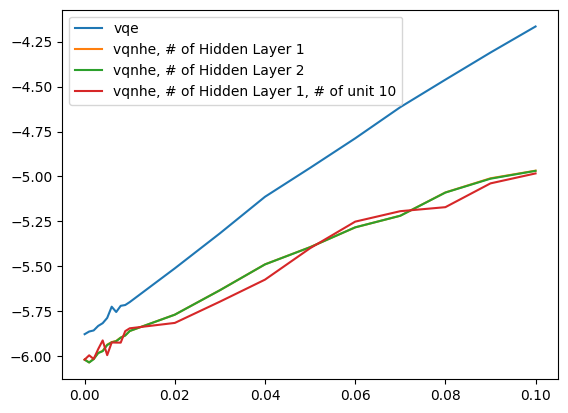

In [ ]:
error_list = [0.001*i for i in range(10)]+[0.01*i for i in range(1,11,1)]

vqe = [-5.876600000000001, -5.8619200000000005, -5.855820000000001, -5.830759999999999, -5.81554, -5.786360000000001, -5.723840000000001, -5.75338, -5.71892, -5.714540000000001, -5.69826, -5.5106, -5.3159800000000015, -5.112719999999999, -4.9521, -4.78792, -4.614680000000001, -4.461779999999999, -4.3110599999999994, -4.16606]
vqnhe_1 = [-6.016802141557301, -6.033668811971606, -6.0126360379539046, -5.981320863910831, -5.969558737051838, -5.934874750042589, -5.920637462798409, -5.914035409603047, -5.895030747146389, -5.883510734777119, -5.8589093314138285, -5.768163382324187, -5.632185221427297, -5.488488523492795, -5.392835794187803, -5.282777008483308, -5.218086763971021, -5.088782119949112, -5.010089066676246, -4.967618445813056]
vqnhe_2 = [-6.0189520440435835, -6.033933976459512, -6.015939855858921, -5.981398538394226, -5.971035006177397, -5.937147888028424, -5.921916205729822, -5.915723425109382, -5.896390190020607, -5.884099549362669, -5.858966473582975, -5.768171830036203, -5.632245711882939, -5.488642324996632, -5.393136248291399, -5.282811913275707, -5.218354733066544, -5.089269, -5.012300, -4.968633]
vqnhe_5 = [-6.012186352896376, -5.990314680426382, -6.012238520592578, -5.94999362014869, -5.911308461056507, -5.987423, -5.91941228330353, -5.9199132081640755, -5.857610311120224, -5.840269378687749, -5.8127171201352414, -5.695483374689246, -5.572004400932811, -5.409658085158476, -5.397080228431743, -5.250284575846735, -5.1916432743864025, -5.169469727175823, -5.034134576221107, -4.971820354328851]
vqnhe_unit10 = [-6.0180292017147865, -5.9940830843595005, -6.014639147707469, -5.9597404015346624, -5.911344187076163, -5.993209559288424, -5.922568836995583, -5.92337036213113, -5.9235631, -5.859724870361055, -5.843946004687859, -5.81398424629551, -5.695758589588917, -5.573372391501268, -5.398764320375726, -5.250990830374524, -5.192855248104412, -5.170575560977388, -5.0383291010529865, -4.982976474792443]


plt.plot(error_list, vqe, label="vqe")
plt.plot(error_list, vqnhe_1, label="vqnhe, # of Hidden Layer 1")
plt.plot(error_list, vqnhe_2, label="vqnhe, # of Hidden Layer 2")
plt.plot(error_list, vqnhe_5, label="vqnhe, # of Hidden Layer 5")
plt.plot(error_list, vqnhe_unit10, label="vqnhe, # of Hidden Layer 1, # of unit 10")
plt.legend()